<a href="https://colab.research.google.com/github/NBK-code/TextWorld_Game_GRPO/blob/main/TextWorld_Game_Ver_3_3_B.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Training

In [ ]:
%%capture
import os
if "COLAB_" not in "".join(os.environ.keys()):
    !pip install unsloth vllm
else:
    # [NOTE] Do the below ONLY in Colab! Use [[pip install unsloth vllm]]
    !pip install --no-deps unsloth vllm==0.8.5.post1

In [ ]:
%%capture
import os
if "COLAB_" not in "".join(os.environ.keys()):
    !pip install unsloth vllm
else:
    !pip install --no-deps unsloth vllm==0.8.5.post1
    # [NOTE] Do the below ONLY in Colab! Use [[pip install unsloth vllm]]
    # Skip restarting message in Colab
    import sys, re, requests; modules = list(sys.modules.keys())
    for x in modules: sys.modules.pop(x) if "PIL" in x or "google" in x else None
    !pip install --no-deps bitsandbytes accelerate xformers==0.0.29.post3 peft "trl==0.15.2" triton cut_cross_entropy unsloth_zoo
    !pip install sentencepiece protobuf "datasets>=3.4.1" huggingface_hub hf_transfer
    !pip install transformers==4.51.3

    # vLLM requirements - vLLM breaks Colab due to reinstalling numpy
    f = requests.get("https://raw.githubusercontent.com/vllm-project/vllm/refs/heads/main/requirements/common.txt").content
    with open("vllm_requirements.txt", "wb") as file:
        file.write(re.sub(rb"(transformers|numpy|xformers)[^\n]{1,}\n", b"", f))
    !pip install -r vllm_requirements.txt

In [ ]:
from unsloth import FastLanguageModel
import torch.nn.functional as F
import torch
import json
import random
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
max_seq_length = 1024  # Can increase for longer reasoning traces
lora_rank = 8  # Larger rank = smarter, but slower

model, tokenizer = FastLanguageModel.from_pretrained(
    model_name="meta-llama/meta-Llama-3.1-8B-Instruct",
    max_seq_length=max_seq_length,
    load_in_4bit=True,  # False for LoRA 16bit
    fast_inference=True,
    max_lora_rank=lora_rank,
    gpu_memory_utilization=0.6
)

In [ ]:
def count_trainable_parameters(model):
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    total_params = sum(p.numel() for p in model.parameters())

    print(f"Trainable parameters: {trainable_params:,}")
    print(f"Total parameters:     {total_params:,}")
    print(f"Percentage trainable: {100 * trainable_params / total_params:.4f}%")

In [ ]:
count_trainable_parameters(model)

Trainable parameters: 0
Total parameters:     4,628,680,704
Percentage trainable: 0.0000%


In [ ]:
model = FastLanguageModel.get_peft_model(
    model,
    r = lora_rank, # Choose any number > 0 ! Suggested 8, 16, 32, 64, 128
    target_modules = [
        "q_proj", "k_proj", "v_proj", "o_proj",
        "gate_proj", "up_proj", "down_proj",
    ], # Remove QKVO if out of memory
    lora_alpha = lora_rank,
    use_gradient_checkpointing = "unsloth", # Enable long context finetuning
    random_state = 3407,)

Unsloth 2025.7.11 patched 32 layers with 32 QKV layers, 32 O layers and 32 MLP layers.


In [ ]:
count_trainable_parameters(model)

Trainable parameters: 20,971,520
Total parameters:     4,649,652,224
Percentage trainable: 0.4510%


In [ ]:
def compute_completion_logprob_from_ids(full_input_ids, prompt_len, model):
    """
    computes log-prob of tokens at i+1 given logits at i.
    """
    attention_mask = torch.ones_like(full_input_ids)

    logits = model(full_input_ids, attention_mask=attention_mask).logits  # shape (1, T, vocab)
    log_probs = torch.nn.functional.log_softmax(logits[:, :-1, :], dim=-1)  # shape (1, T-1, vocab)

    target_ids = full_input_ids[:, 1:]  # shape (1, T-1)
    token_log_probs = log_probs.gather(2, target_ids.unsqueeze(-1)).squeeze(-1)  # shape (1, T-1)
    token_log_probs = token_log_probs.squeeze(0)  # shape (T-1,)

    completion_mask = torch.zeros_like(token_log_probs)
    completion_mask[prompt_len - 1:] = 1.0  # offset by 1 due to shifting

    completion_logprob = (token_log_probs * completion_mask).sum()

    return completion_logprob, token_log_probs, completion_mask

In [ ]:
def grpo_loss_episode_level(log_probs_theta, log_probs_old, log_probs_ref, advantage, epsilon=0.02, beta=0.01):
    ratio = torch.exp(log_probs_theta - log_probs_old)
    unclipped = ratio * advantage
    clipped = torch.clamp(ratio, 1 - epsilon, 1 + epsilon) * advantage
    policy_loss = torch.min(unclipped, clipped)

    print("log_probs_theta:", log_probs_theta.item())
    print("log_probs_old:", log_probs_old.item())
    print("delta:", (log_probs_theta - log_probs_old).item())

    delta = log_probs_theta - log_probs_ref
    kl = torch.exp(-delta) + delta - 1

    #print("delta: ", delta.item())
    print("kl: ", kl.item())

    return -(policy_loss - beta * kl)

    #return -(policy_loss)

In [ ]:
file_path = "/content/grpo_data.jsonl"

In [ ]:
from torch.optim import AdamW
optimizer = AdamW(model.parameters(), lr=5e-6)

In [ ]:
def load_flattened_steps(file_path):
    steps = []
    with open(file_path, "r") as f:
        for line in f:
            steps.append(json.loads(line))
    return steps

In [ ]:
steps = load_flattened_steps(file_path)
print(len(steps))

3078


In [ ]:
from collections import defaultdict
import json

def load_grouped_steps_by_env(file_path):
    grouped = defaultdict(list)
    with open(file_path, "r") as f:
        for line in f:
            entry = json.loads(line)
            key = (entry["level"], entry["seed"])
            grouped[key].append(entry)
    return grouped

In [ ]:
def plot_smoothed_loss(loss_history, window=20):

    loss_array = np.array(loss_history)

    smoothed_loss = np.convolve(loss_array, np.ones(window)/window, mode='valid')

    plt.figure(figsize=(10, 5))
    plt.plot(loss_array, alpha=0.3, label='Raw Loss', linewidth=1)
    plt.plot(range(window - 1, len(loss_array)), smoothed_loss, label=f'Smoothed (window={window})', color='blue')

    plt.xlabel('Training Step')
    plt.ylabel('Loss')
    plt.title('GRPO Training Loss (Smoothed)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Streaming output truncated to the last 5000 lines.
kl:  0.0009765625
log_probs_theta: -51.125
log_probs_old: -51.15625
delta: 0.03125
kl:  0.0
log_probs_theta: -29.0625
log_probs_old: -29.0625
delta: 0.0
kl:  0.0
log_probs_theta: -46.09375
log_probs_old: -46.0625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -29.09375
log_probs_old: -29.046875
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -33.28125
log_probs_old: -33.15625
delta: -0.125
kl:  0.0078125
log_probs_theta: -28.640625
log_probs_old: -28.5625
delta: -0.078125
kl:  0.0029296875
✅ Epoch 1 | Batch [1848-1859] | Loss: 0.5083
log_probs_theta: -34.3125
log_probs_old: -34.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -48.4375
log_probs_old: -48.4375
delta: 0.0
kl:  0.0
log_probs_theta: -26.46875
log_probs_old: -26.421875
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -44.125
log_probs_old: -44.15625
delta: 0.03125
kl:  0.0
log_probs_theta: -32.6875
log_probs_old: -32.65625
delta: -0.03125
kl:  0.0009765625

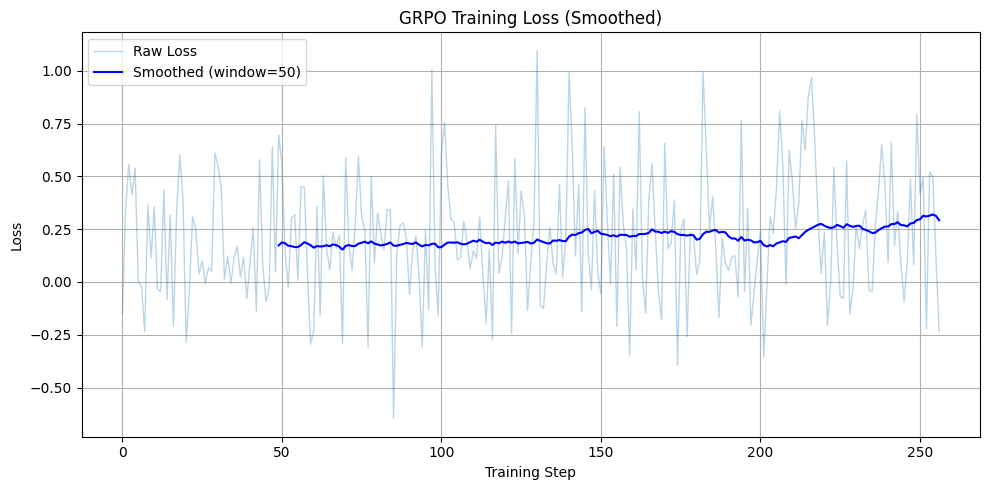

Streaming output truncated to the last 5000 lines.
kl:  0.0029296875
log_probs_theta: -29.8125
log_probs_old: -29.90625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -27.515625
log_probs_old: -27.4375
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -44.5625
log_probs_old: -44.46875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -39.125
log_probs_old: -39.09375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -52.09375
log_probs_old: -51.875
delta: -0.21875
kl:  0.025390625
log_probs_theta: -35.40625
log_probs_old: -35.28125
delta: -0.125
kl:  0.0078125
✅ Epoch 2 | Batch [1848-1859] | Loss: 0.1906
log_probs_theta: -24.734375
log_probs_old: -24.640625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -52.5
log_probs_old: -52.4375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -19.96875
log_probs_old: -19.9375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -29.4375
log_probs_old: -29.28125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -38.75
log_probs_old: -38.6875

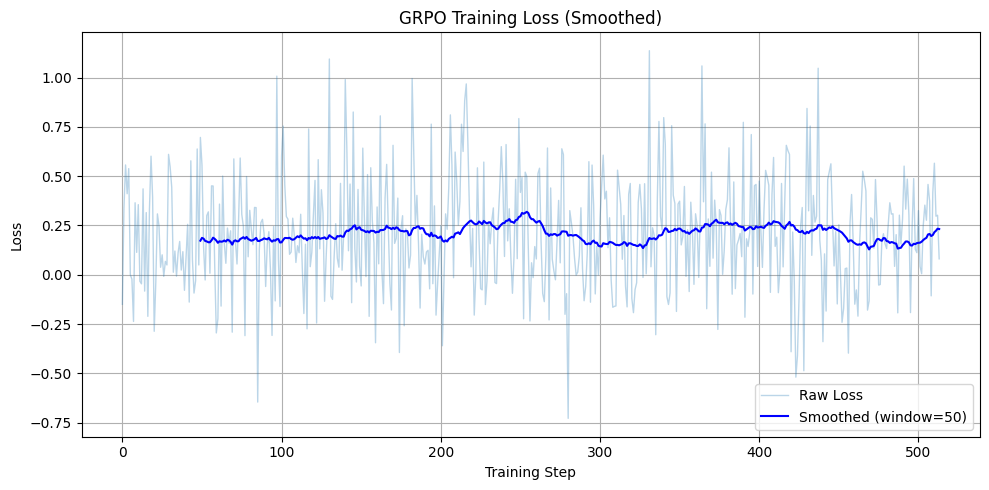

Streaming output truncated to the last 5000 lines.
delta: -0.15625
kl:  0.0126953125
✅ Epoch 3 | Batch [144-155] | Loss: 0.1458
log_probs_theta: -32.9375
log_probs_old: -33.03125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -34.0
log_probs_old: -34.125
delta: 0.125
kl:  0.0078125
log_probs_theta: -34.3125
log_probs_old: -34.4375
delta: 0.125
kl:  0.0078125
log_probs_theta: -41.0
log_probs_old: -41.15625
delta: 0.15625
kl:  0.01171875
log_probs_theta: -30.859375
log_probs_old: -30.859375
delta: 0.0
kl:  0.0
log_probs_theta: -46.03125
log_probs_old: -46.21875
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -46.4375
log_probs_old: -46.53125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -34.09375
log_probs_old: -34.1875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -36.9375
log_probs_old: -36.96875
delta: 0.03125
kl:  0.0
log_probs_theta: -46.65625
log_probs_old: -46.875
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -63.8125
log_probs_old: -63.65625
delta: -0.15625
kl:  0.01269

In [ ]:
loss_history = []


batch_size = 12
num_epochs = 3
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-6)

for epoch in range(num_epochs):
    print(f"\n🌀 Epoch {epoch+1}")
    random.shuffle(steps)

    for i in range(0, len(steps), batch_size):
        batch = steps[i:i+batch_size]
        batch_loss = 0.0
        optimizer.zero_grad()

        for step in batch:
            input_ids_tensor = torch.tensor(step["input_ids"]).unsqueeze(0).to(model.device)
            prompt_len = step["prompt_len"]

            logprob_theta, _, completion_mask = compute_completion_logprob_from_ids(
                input_ids_tensor, prompt_len, model
            )

            logprob_old = torch.tensor(step["logprob_old"], dtype=torch.float16).to(model.device)
            logprob_ref = logprob_old  # π_ref = π_old
            advantage = torch.tensor(step["advantage"], dtype=torch.float16).to(model.device)

            loss = grpo_loss_episode_level(logprob_theta, logprob_old, logprob_ref, advantage)
            batch_loss += loss

        # Backpropagate mean batch loss
        batch_loss = batch_loss / len(batch)
        batch_loss.backward()
        optimizer.step()

        loss_history.append(batch_loss.item())

        print(f"✅ Epoch {epoch+1} | Batch [{i}-{i+len(batch)-1}] | Loss: {batch_loss.item():.4f}")

    plot_smoothed_loss(loss_history, window = 50)


🌟 Epoch 1

🌍 Training on env: Level 5, Seed 10 | 71 steps
log_probs_theta: -34.15625
log_probs_old: -34.15625
delta: 0.0
kl:  0.0
log_probs_theta: -29.21875
log_probs_old: -29.21875
delta: 0.0
kl:  0.0
log_probs_theta: -20.078125
log_probs_old: -20.078125
delta: 0.0
kl:  0.0
log_probs_theta: -38.75
log_probs_old: -38.75
delta: 0.0
kl:  0.0
log_probs_theta: -29.328125
log_probs_old: -29.328125
delta: 0.0
kl:  0.0
log_probs_theta: -40.46875
log_probs_old: -40.46875
delta: 0.0
kl:  0.0
log_probs_theta: -19.015625
log_probs_old: -19.015625
delta: 0.0
kl:  0.0
log_probs_theta: -39.1875
log_probs_old: -39.1875
delta: 0.0
kl:  0.0
log_probs_theta: -41.9375
log_probs_old: -41.9375
delta: 0.0
kl:  0.0
log_probs_theta: -37.0
log_probs_old: -37.0
delta: 0.0
kl:  0.0
log_probs_theta: -54.75
log_probs_old: -54.75
delta: 0.0
kl:  0.0
log_probs_theta: -36.65625
log_probs_old: -36.65625
delta: 0.0
kl:  0.0
✅ Epoch 1 | Batch [0-11] | Loss: -0.0521
Unsloth: Will smartly offload gradients to save VRAM!


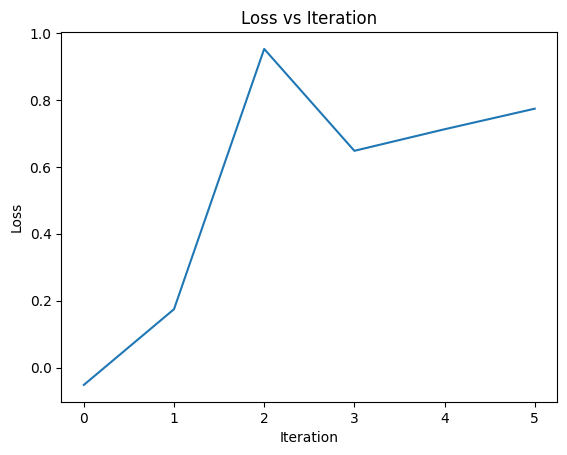


🌍 Training on env: Level 5, Seed 14 | 76 steps
log_probs_theta: -46.09375
log_probs_old: -46.0
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -58.6875
log_probs_old: -58.59375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -45.125
log_probs_old: -45.0
delta: -0.125
kl:  0.0078125
log_probs_theta: -32.1875
log_probs_old: -32.1875
delta: 0.0
kl:  0.0
log_probs_theta: -44.5
log_probs_old: -44.4375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -36.5
log_probs_old: -36.4375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.71875
log_probs_old: -34.625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -42.9375
log_probs_old: -42.875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -38.875
log_probs_old: -38.8125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -51.46875
log_probs_old: -51.34375
delta: -0.125
kl:  0.0078125
log_probs_theta: -49.53125
log_probs_old: -49.40625
delta: -0.125
kl:  0.0078125
log_probs_theta: -33.75
log_probs_old: -33.6875
delta: -0.0625
kl:  0.0019

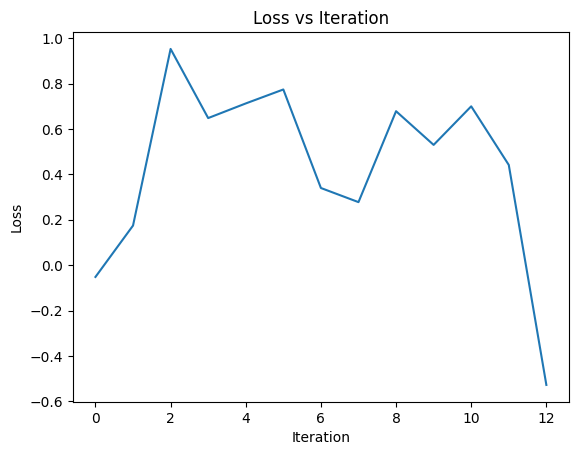


🌍 Training on env: Level 5, Seed 18 | 61 steps
log_probs_theta: -33.28125
log_probs_old: -33.15625
delta: -0.125
kl:  0.0078125
log_probs_theta: -32.125
log_probs_old: -32.03125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -32.1875
log_probs_old: -32.09375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -37.40625
log_probs_old: -37.3125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -18.8125
log_probs_old: -18.75
delta: -0.0625
kl:  0.001953125
log_probs_theta: -37.15625
log_probs_old: -37.0625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -34.8125
log_probs_old: -34.71875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -27.046875
log_probs_old: -27.046875
delta: 0.0
kl:  0.0
log_probs_theta: -29.90625
log_probs_old: -29.828125
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -59.46875
log_probs_old: -59.34375
delta: -0.125
kl:  0.0078125
log_probs_theta: -27.984375
log_probs_old: -27.90625
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -32.0625
log_probs_

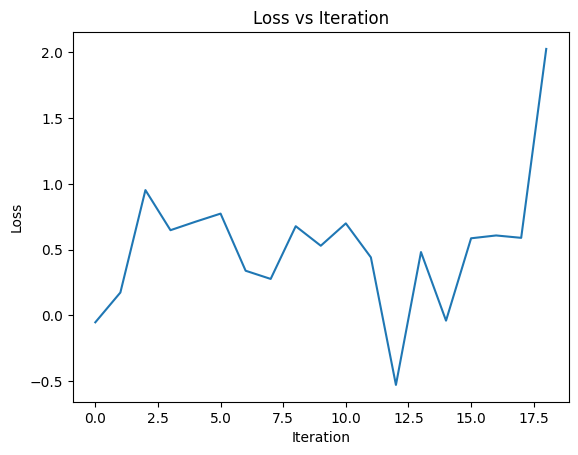


🌍 Training on env: Level 5, Seed 22 | 121 steps
log_probs_theta: -35.90625
log_probs_old: -35.90625
delta: 0.0
kl:  0.0
log_probs_theta: -38.15625
log_probs_old: -38.0
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -37.21875
log_probs_old: -37.21875
delta: 0.0
kl:  0.0
log_probs_theta: -55.40625
log_probs_old: -55.375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -31.59375
log_probs_old: -31.53125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -44.625
log_probs_old: -44.5
delta: -0.125
kl:  0.0078125
log_probs_theta: -31.625
log_probs_old: -31.640625
delta: 0.015625
kl:  0.0
log_probs_theta: -46.3125
log_probs_old: -46.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -32.0625
log_probs_old: -31.984375
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -57.03125
log_probs_old: -57.03125
delta: 0.0
kl:  0.0
log_probs_theta: -39.5625
log_probs_old: -39.625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -38.5625
log_probs_old: -38.4375
delta: -0.125
kl:  0.0078125
✅ E

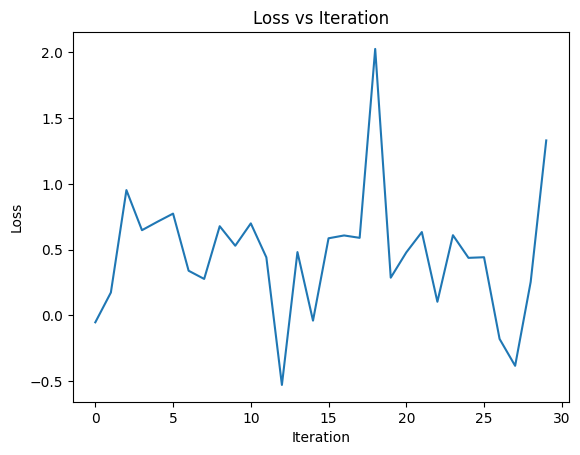


🌍 Training on env: Level 5, Seed 26 | 67 steps
log_probs_theta: -44.3125
log_probs_old: -44.4375
delta: 0.125
kl:  0.0078125
log_probs_theta: -49.09375
log_probs_old: -49.0625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -42.6875
log_probs_old: -42.78125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -43.0
log_probs_old: -43.09375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -37.25
log_probs_old: -37.15625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -49.59375
log_probs_old: -49.46875
delta: -0.125
kl:  0.0078125
log_probs_theta: -26.59375
log_probs_old: -26.625
delta: 0.03125
kl:  0.0
log_probs_theta: -23.15625
log_probs_old: -23.140625
delta: -0.015625
kl:  0.0
log_probs_theta: -41.625
log_probs_old: -41.78125
delta: 0.15625
kl:  0.01171875
log_probs_theta: -31.15625
log_probs_old: -31.046875
delta: -0.109375
kl:  0.005859375
log_probs_theta: -40.09375
log_probs_old: -40.21875
delta: 0.125
kl:  0.0078125
log_probs_theta: -34.65625
log_probs_old: -34.625
delta: -0.031

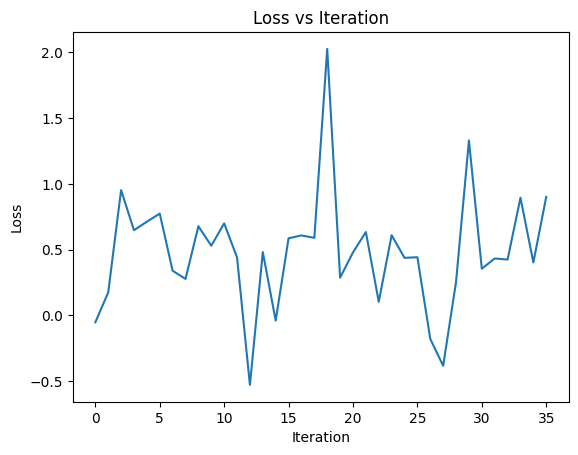


🌍 Training on env: Level 5, Seed 30 | 79 steps
log_probs_theta: -28.078125
log_probs_old: -28.03125
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -58.71875
log_probs_old: -58.625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -36.875
log_probs_old: -36.8125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.875
log_probs_old: -40.84375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -45.59375
log_probs_old: -45.53125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -41.84375
log_probs_old: -41.84375
delta: 0.0
kl:  0.0
log_probs_theta: -48.75
log_probs_old: -48.6875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -18.046875
log_probs_old: -18.0625
delta: 0.015625
kl:  0.0
log_probs_theta: -34.53125
log_probs_old: -34.4375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -56.15625
log_probs_old: -55.96875
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -26.859375
log_probs_old: -26.8125
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -18.046875
log_probs_old: -1

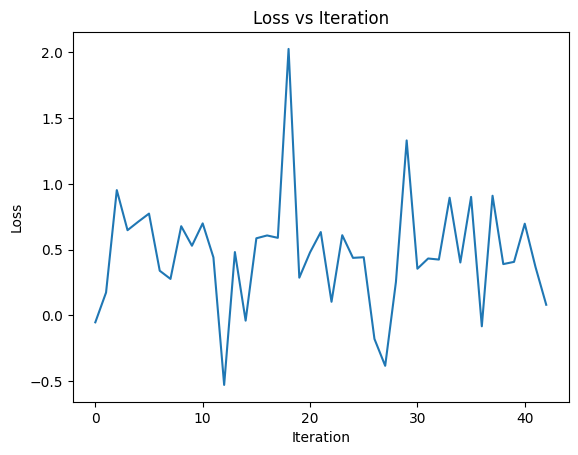


🌍 Training on env: Level 5, Seed 34 | 68 steps
log_probs_theta: -29.078125
log_probs_old: -29.09375
delta: 0.015625
kl:  0.0
log_probs_theta: -35.84375
log_probs_old: -35.75
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -59.5
log_probs_old: -59.28125
delta: -0.21875
kl:  0.025390625
log_probs_theta: -39.84375
log_probs_old: -39.78125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -26.296875
log_probs_old: -26.328125
delta: 0.03125
kl:  0.0
log_probs_theta: -19.515625
log_probs_old: -19.453125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -29.15625
log_probs_old: -29.109375
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -37.03125
log_probs_old: -37.03125
delta: 0.0
kl:  0.0
log_probs_theta: -34.875
log_probs_old: -34.71875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -52.625
log_probs_old: -52.40625
delta: -0.21875
kl:  0.025390625
log_probs_theta: -24.4375
log_probs_old: -24.375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -61.59375
log_probs_old: -61.59375
de

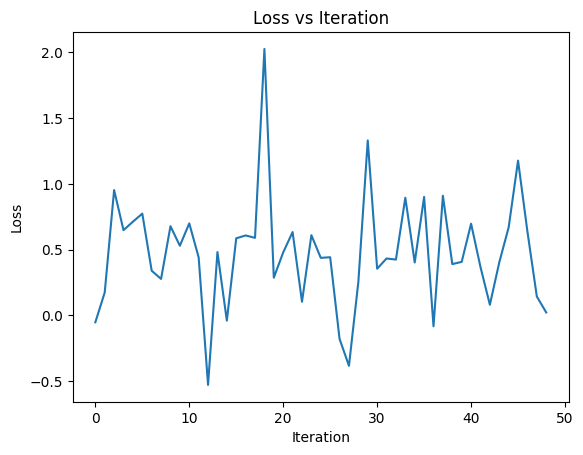


🌍 Training on env: Level 5, Seed 38 | 70 steps
log_probs_theta: -37.21875
log_probs_old: -37.125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -26.796875
log_probs_old: -26.75
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -27.3125
log_probs_old: -27.359375
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -25.8125
log_probs_old: -25.75
delta: -0.0625
kl:  0.001953125
log_probs_theta: -41.03125
log_probs_old: -41.03125
delta: 0.0
kl:  0.0
log_probs_theta: -32.5
log_probs_old: -32.4375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -36.4375
log_probs_old: -36.34375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -35.875
log_probs_old: -35.75
delta: -0.125
kl:  0.0078125
log_probs_theta: -27.84375
log_probs_old: -27.75
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -40.28125
log_probs_old: -40.1875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -33.125
log_probs_old: -33.125
delta: 0.0
kl:  0.0
log_probs_theta: -38.0
log_probs_old: -37.90625
delta: -0.09375
kl:  

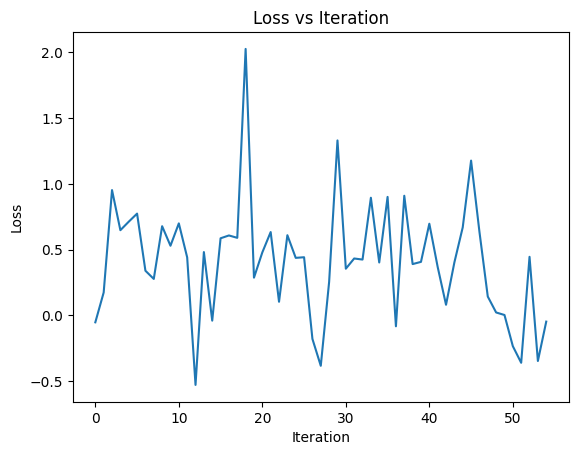


🌍 Training on env: Level 5, Seed 42 | 108 steps
log_probs_theta: -40.1875
log_probs_old: -40.125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -27.75
log_probs_old: -27.734375
delta: -0.015625
kl:  0.0
log_probs_theta: -31.5
log_probs_old: -31.40625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -35.84375
log_probs_old: -35.78125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -51.75
log_probs_old: -51.6875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -49.09375
log_probs_old: -49.0
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -30.796875
log_probs_old: -30.828125
delta: 0.03125
kl:  0.0
log_probs_theta: -45.125
log_probs_old: -44.96875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -22.546875
log_probs_old: -22.59375
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -30.984375
log_probs_old: -30.9375
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -26.6875
log_probs_old: -26.625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -38.71875
log_probs_old: -38.687

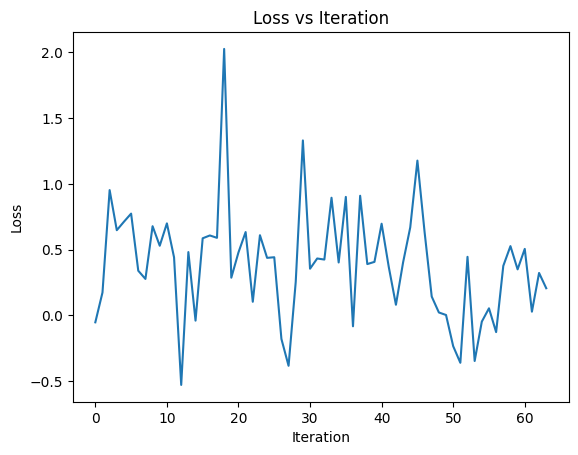


🌍 Training on env: Level 5, Seed 46 | 81 steps
log_probs_theta: -33.28125
log_probs_old: -33.3125
delta: 0.03125
kl:  0.0
log_probs_theta: -59.71875
log_probs_old: -59.6875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -27.359375
log_probs_old: -27.359375
delta: 0.0
kl:  0.0
log_probs_theta: -24.875
log_probs_old: -24.953125
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -26.84375
log_probs_old: -26.8125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -30.9375
log_probs_old: -30.890625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -47.71875
log_probs_old: -47.75
delta: 0.03125
kl:  0.0
log_probs_theta: -30.984375
log_probs_old: -31.0
delta: 0.015625
kl:  0.0
log_probs_theta: -15.671875
log_probs_old: -15.7265625
delta: 0.0546875
kl:  0.001953125
log_probs_theta: -45.21875
log_probs_old: -45.15625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -48.8125
log_probs_old: -48.75
delta: -0.0625
kl:  0.001953125
log_probs_theta: -36.1875
log_probs_old: -36.15625
delta: -0.

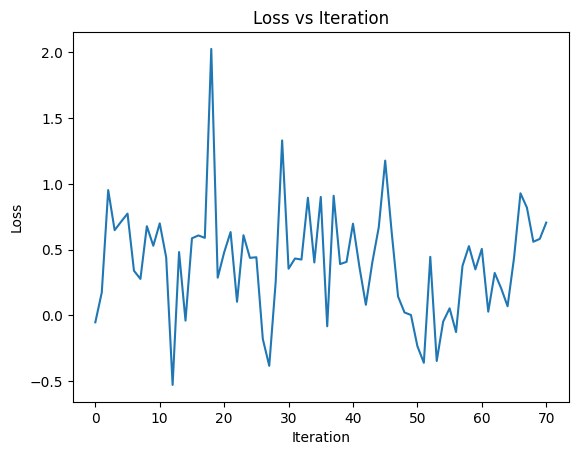


🌍 Training on env: Level 6, Seed 10 | 130 steps
log_probs_theta: -37.78125
log_probs_old: -37.78125
delta: 0.0
kl:  0.0
log_probs_theta: -44.625
log_probs_old: -44.625
delta: 0.0
kl:  0.0
log_probs_theta: -34.125
log_probs_old: -34.15625
delta: 0.03125
kl:  0.0
log_probs_theta: -41.4375
log_probs_old: -41.375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -31.296875
log_probs_old: -31.390625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -38.8125
log_probs_old: -38.71875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -31.421875
log_probs_old: -31.34375
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -42.90625
log_probs_old: -42.90625
delta: 0.0
kl:  0.0
log_probs_theta: -26.953125
log_probs_old: -26.96875
delta: 0.015625
kl:  0.0
log_probs_theta: -40.4375
log_probs_old: -40.4375
delta: 0.0
kl:  0.0
log_probs_theta: -34.15625
log_probs_old: -34.03125
delta: -0.125
kl:  0.0078125
log_probs_theta: -46.6875
log_probs_old: -46.65625
delta: -0.03125
kl:  0.0009765625
✅ Epoch 1 | 

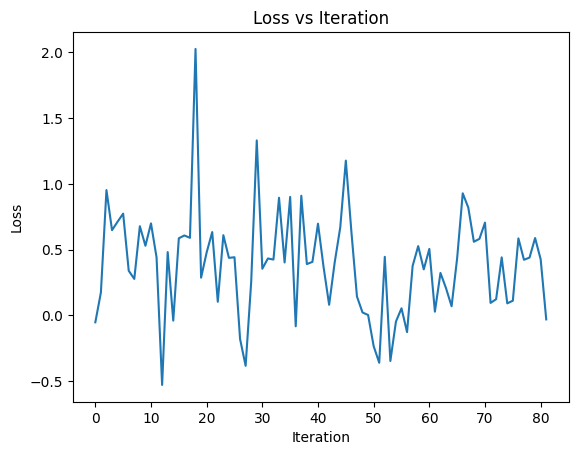


🌍 Training on env: Level 6, Seed 14 | 72 steps
log_probs_theta: -45.90625
log_probs_old: -45.84375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -28.625
log_probs_old: -28.609375
delta: -0.015625
kl:  0.0
log_probs_theta: -41.65625
log_probs_old: -41.6875
delta: 0.03125
kl:  0.0
log_probs_theta: -29.609375
log_probs_old: -29.609375
delta: 0.0
kl:  0.0
log_probs_theta: -31.328125
log_probs_old: -31.390625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -57.5625
log_probs_old: -57.65625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -22.515625
log_probs_old: -22.625
delta: 0.109375
kl:  0.005859375
log_probs_theta: -37.96875
log_probs_old: -38.0
delta: 0.03125
kl:  0.0
log_probs_theta: -42.84375
log_probs_old: -42.78125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -53.6875
log_probs_old: -53.6875
delta: 0.0
kl:  0.0
log_probs_theta: -29.671875
log_probs_old: -29.75
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -36.5
log_probs_old: -36.46875
delta: -0.03125
kl:  0.0009765625

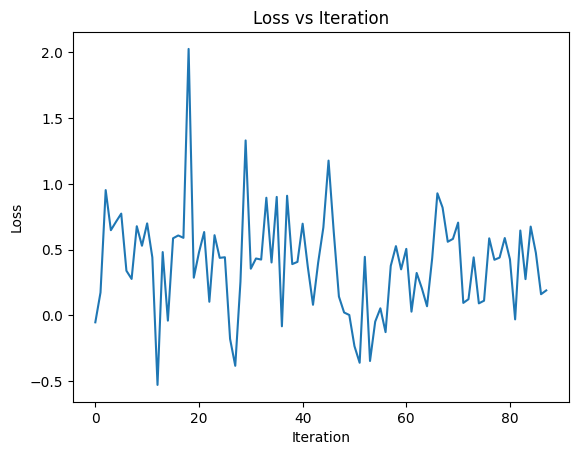


🌍 Training on env: Level 6, Seed 18 | 89 steps
log_probs_theta: -60.5
log_probs_old: -60.40625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -30.390625
log_probs_old: -30.296875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -37.3125
log_probs_old: -37.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -19.125
log_probs_old: -19.203125
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -45.15625
log_probs_old: -45.03125
delta: -0.125
kl:  0.0078125
log_probs_theta: -23.90625
log_probs_old: -23.875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -38.96875
log_probs_old: -38.90625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.375
log_probs_old: -40.34375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -36.40625
log_probs_old: -36.34375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -30.515625
log_probs_old: -30.546875
delta: 0.03125
kl:  0.0
log_probs_theta: -20.75
log_probs_old: -20.796875
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -28.765625
log_p

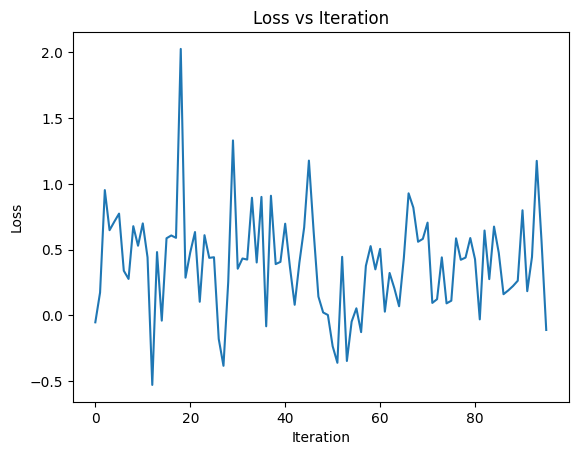


🌍 Training on env: Level 6, Seed 22 | 155 steps
log_probs_theta: -51.40625
log_probs_old: -51.3125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -34.21875
log_probs_old: -34.125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -49.65625
log_probs_old: -49.625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -29.046875
log_probs_old: -28.875
delta: -0.171875
kl:  0.015625
log_probs_theta: -34.65625
log_probs_old: -34.5625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -25.40625
log_probs_old: -25.328125
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -39.5
log_probs_old: -39.4375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -33.71875
log_probs_old: -33.71875
delta: 0.0
kl:  0.0
log_probs_theta: -25.46875
log_probs_old: -25.359375
delta: -0.109375
kl:  0.005859375
log_probs_theta: -22.875
log_probs_old: -22.78125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -40.46875
log_probs_old: -40.3125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -29.03125
log_probs

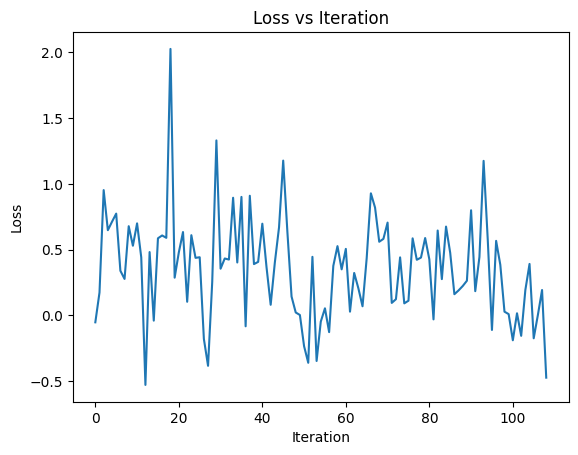


🌍 Training on env: Level 6, Seed 26 | 115 steps
log_probs_theta: -30.46875
log_probs_old: -30.515625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -35.46875
log_probs_old: -35.5625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -32.65625
log_probs_old: -32.625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -48.0
log_probs_old: -47.96875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -50.40625
log_probs_old: -50.375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -34.65625
log_probs_old: -34.71875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -53.3125
log_probs_old: -53.1875
delta: -0.125
kl:  0.0078125
log_probs_theta: -40.0
log_probs_old: -40.0
delta: 0.0
kl:  0.0
log_probs_theta: -21.984375
log_probs_old: -21.9375
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -34.125
log_probs_old: -34.09375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -32.25
log_probs_old: -32.25
delta: 0.0
kl:  0.0
log_probs_theta: -54.03125
log_probs_old: -54.125
delta: 0.09375
kl: 

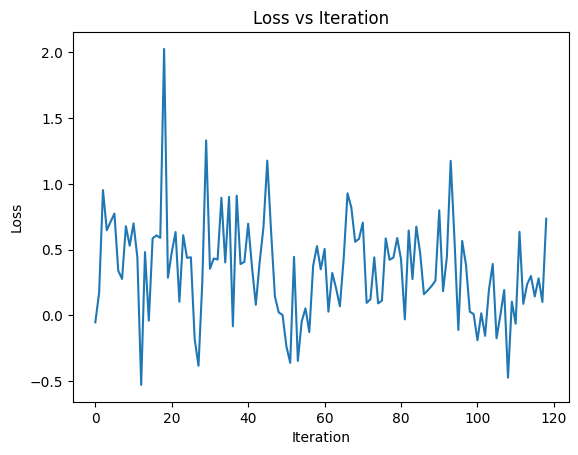


🌍 Training on env: Level 6, Seed 30 | 122 steps
log_probs_theta: -32.78125
log_probs_old: -32.78125
delta: 0.0
kl:  0.0
log_probs_theta: -43.34375
log_probs_old: -43.28125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -30.078125
log_probs_old: -30.09375
delta: 0.015625
kl:  0.0
log_probs_theta: -38.0
log_probs_old: -37.90625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -43.28125
log_probs_old: -43.1875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -53.4375
log_probs_old: -53.40625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -41.71875
log_probs_old: -41.78125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -36.96875
log_probs_old: -36.96875
delta: 0.0
kl:  0.0
log_probs_theta: -29.078125
log_probs_old: -29.0625
delta: -0.015625
kl:  0.0
log_probs_theta: -36.34375
log_probs_old: -36.25
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -47.75
log_probs_old: -47.71875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -33.15625
log_probs_old: -33.09375
delta: -0.0625

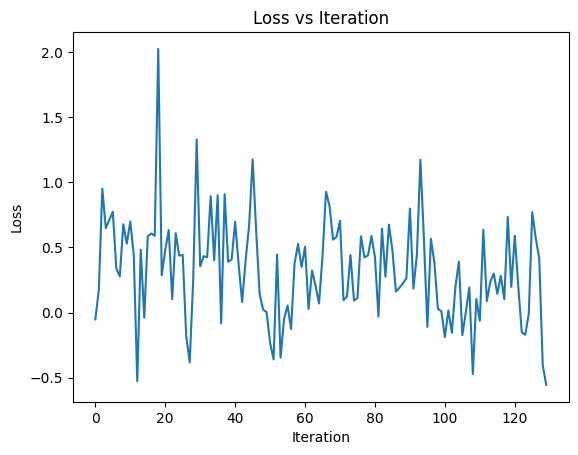


🌍 Training on env: Level 6, Seed 34 | 66 steps
log_probs_theta: -34.15625
log_probs_old: -34.25
delta: 0.09375
kl:  0.00390625
log_probs_theta: -20.453125
log_probs_old: -20.4375
delta: -0.015625
kl:  0.0
log_probs_theta: -30.359375
log_probs_old: -30.40625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -31.71875
log_probs_old: -31.765625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -39.6875
log_probs_old: -39.78125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -46.53125
log_probs_old: -46.5625
delta: 0.03125
kl:  0.0
log_probs_theta: -33.5
log_probs_old: -33.53125
delta: 0.03125
kl:  0.0
log_probs_theta: -30.390625
log_probs_old: -30.390625
delta: 0.0
kl:  0.0
log_probs_theta: -46.6875
log_probs_old: -46.6875
delta: 0.0
kl:  0.0
log_probs_theta: -30.203125
log_probs_old: -30.15625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -33.5625
log_probs_old: -33.625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -30.3125
log_probs_old: -30.1875
delta: -0.125
kl:  0.0078125


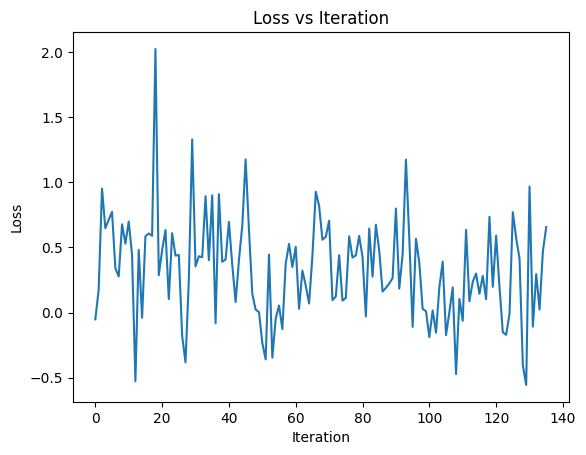


🌍 Training on env: Level 6, Seed 38 | 95 steps
log_probs_theta: -31.171875
log_probs_old: -31.140625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -30.234375
log_probs_old: -30.1875
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -45.65625
log_probs_old: -45.65625
delta: 0.0
kl:  0.0
log_probs_theta: -42.28125
log_probs_old: -42.21875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -52.5
log_probs_old: -52.4375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -32.21875
log_probs_old: -32.21875
delta: 0.0
kl:  0.0
log_probs_theta: -56.34375
log_probs_old: -56.3125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -34.6875
log_probs_old: -34.65625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -37.65625
log_probs_old: -37.59375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -38.09375
log_probs_old: -38.03125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -37.5
log_probs_old: -37.375
delta: -0.125
kl:  0.0078125
log_probs_theta: -15.9921875
log_probs_old: -16.046875
de

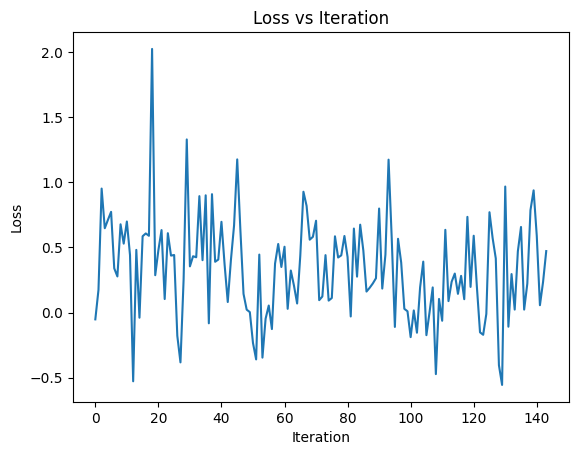


🌍 Training on env: Level 6, Seed 42 | 104 steps
log_probs_theta: -42.21875
log_probs_old: -42.1875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -41.78125
log_probs_old: -41.65625
delta: -0.125
kl:  0.0078125
log_probs_theta: -42.09375
log_probs_old: -41.84375
delta: -0.25
kl:  0.0341796875
log_probs_theta: -48.5625
log_probs_old: -48.5
delta: -0.0625
kl:  0.001953125
log_probs_theta: -37.8125
log_probs_old: -37.71875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -36.4375
log_probs_old: -36.21875
delta: -0.21875
kl:  0.025390625
log_probs_theta: -30.328125
log_probs_old: -30.234375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -56.15625
log_probs_old: -56.0625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -39.6875
log_probs_old: -39.5625
delta: -0.125
kl:  0.0078125
log_probs_theta: -40.5625
log_probs_old: -40.40625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -45.5625
log_probs_old: -45.46875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -33.96875
log_p

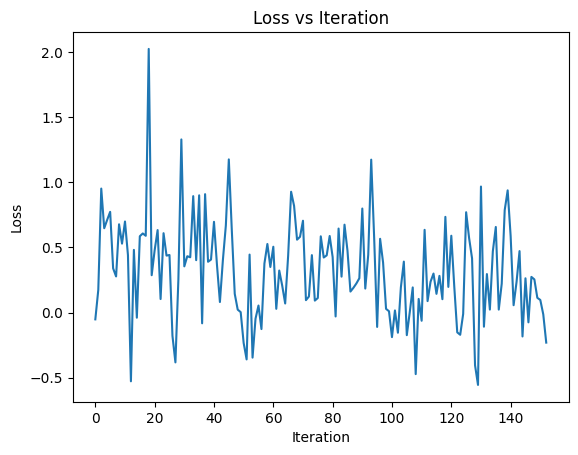


🌍 Training on env: Level 6, Seed 46 | 61 steps
log_probs_theta: -55.78125
log_probs_old: -55.84375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -36.1875
log_probs_old: -36.21875
delta: 0.03125
kl:  0.0
log_probs_theta: -29.875
log_probs_old: -29.984375
delta: 0.109375
kl:  0.005859375
log_probs_theta: -30.15625
log_probs_old: -30.21875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -40.34375
log_probs_old: -40.46875
delta: 0.125
kl:  0.0078125
log_probs_theta: -38.53125
log_probs_old: -38.53125
delta: 0.0
kl:  0.0
log_probs_theta: -37.53125
log_probs_old: -37.65625
delta: 0.125
kl:  0.0078125
log_probs_theta: -36.65625
log_probs_old: -36.75
delta: 0.09375
kl:  0.00390625
log_probs_theta: -20.828125
log_probs_old: -20.875
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -29.90625
log_probs_old: -30.03125
delta: 0.125
kl:  0.0078125
log_probs_theta: -40.34375
log_probs_old: -40.5
delta: 0.15625
kl:  0.01171875
log_probs_theta: -40.90625
log_probs_old: -40.96875
delta: 0.0625
kl:  

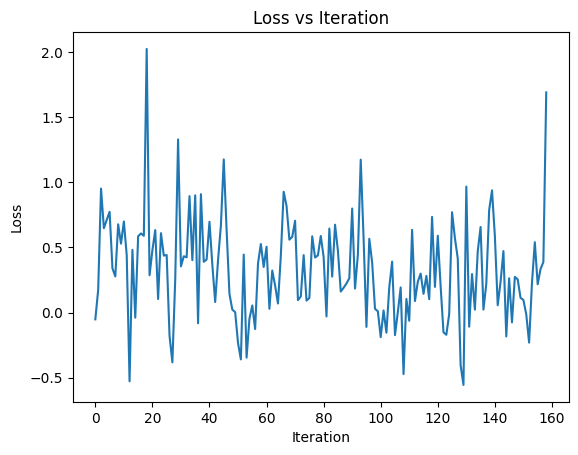


🌍 Training on env: Level 7, Seed 10 | 112 steps
log_probs_theta: -30.8125
log_probs_old: -30.9375
delta: 0.125
kl:  0.0078125
log_probs_theta: -34.96875
log_probs_old: -34.90625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -92.0
log_probs_old: -91.8125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -36.34375
log_probs_old: -36.25
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -18.671875
log_probs_old: -18.609375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -63.15625
log_probs_old: -62.90625
delta: -0.25
kl:  0.0341796875
log_probs_theta: -51.875
log_probs_old: -51.71875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -28.390625
log_probs_old: -28.359375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -33.8125
log_probs_old: -33.78125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -47.0
log_probs_old: -46.84375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -32.71875
log_probs_old: -32.65625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -47.84375
log_pro

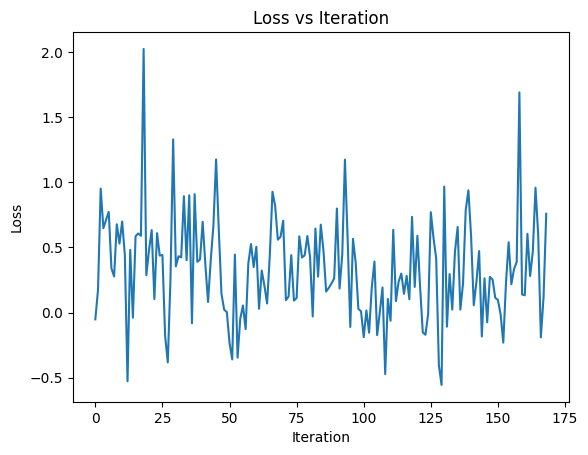


🌍 Training on env: Level 7, Seed 14 | 131 steps
log_probs_theta: -42.5625
log_probs_old: -42.53125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -54.125
log_probs_old: -54.09375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -36.8125
log_probs_old: -36.78125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -39.84375
log_probs_old: -39.6875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -50.03125
log_probs_old: -50.0
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -34.25
log_probs_old: -34.1875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -45.46875
log_probs_old: -45.34375
delta: -0.125
kl:  0.0078125
log_probs_theta: -32.90625
log_probs_old: -32.90625
delta: 0.0
kl:  0.0
log_probs_theta: -33.21875
log_probs_old: -33.09375
delta: -0.125
kl:  0.0078125
log_probs_theta: -33.5625
log_probs_old: -33.46875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -38.5
log_probs_old: -38.40625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -33.1875
log_probs_old: -33.125


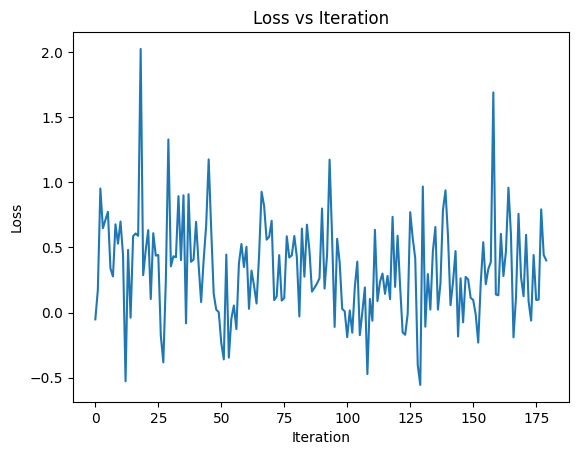


🌍 Training on env: Level 7, Seed 18 | 118 steps
log_probs_theta: -39.125
log_probs_old: -39.0625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.40625
log_probs_old: -40.4375
delta: 0.03125
kl:  0.0
log_probs_theta: -22.78125
log_probs_old: -22.6875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -39.59375
log_probs_old: -39.65625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -38.71875
log_probs_old: -38.65625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.03125
log_probs_old: -39.90625
delta: -0.125
kl:  0.0078125
log_probs_theta: -34.40625
log_probs_old: -34.4375
delta: 0.03125
kl:  0.0
log_probs_theta: -41.3125
log_probs_old: -41.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -33.375
log_probs_old: -33.375
delta: 0.0
kl:  0.0
log_probs_theta: -29.140625
log_probs_old: -29.25
delta: 0.109375
kl:  0.005859375
log_probs_theta: -36.96875
log_probs_old: -37.0
delta: 0.03125
kl:  0.0
log_probs_theta: -39.125
log_probs_old: -39.09375
delta: -0.03125
kl:  0.000976

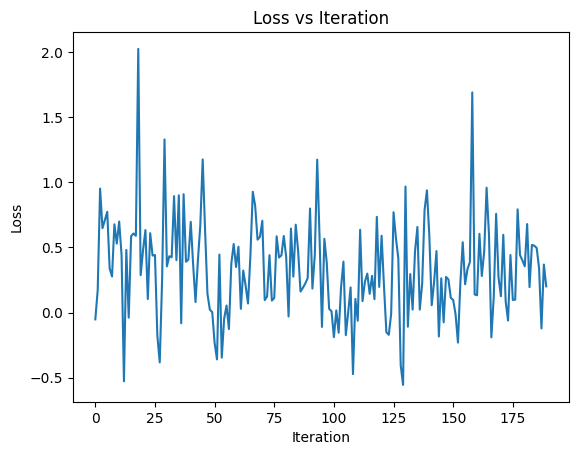


🌍 Training on env: Level 7, Seed 22 | 147 steps
log_probs_theta: -46.25
log_probs_old: -46.21875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -36.53125
log_probs_old: -36.5
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -27.984375
log_probs_old: -27.921875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -49.1875
log_probs_old: -49.0625
delta: -0.125
kl:  0.0078125
log_probs_theta: -30.734375
log_probs_old: -30.6875
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -52.3125
log_probs_old: -52.0625
delta: -0.25
kl:  0.0341796875
log_probs_theta: -39.90625
log_probs_old: -39.8125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -42.8125
log_probs_old: -42.65625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -33.125
log_probs_old: -33.0625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -36.5
log_probs_old: -36.375
delta: -0.125
kl:  0.0078125
log_probs_theta: -32.5
log_probs_old: -32.375
delta: -0.125
kl:  0.0078125
log_probs_theta: -42.46875
log_probs_old: -42.375
de

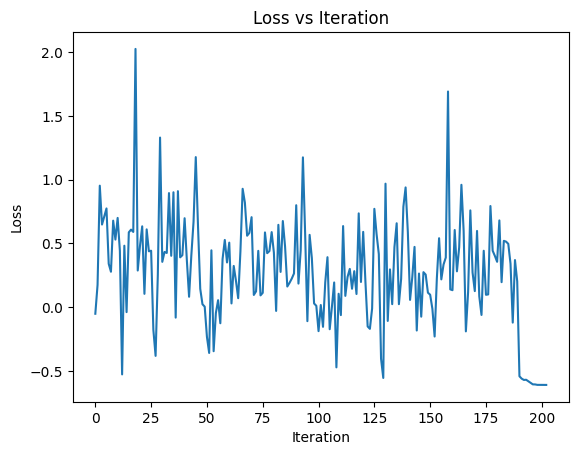


🌍 Training on env: Level 7, Seed 26 | 139 steps
log_probs_theta: -47.28125
log_probs_old: -47.5
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -36.78125
log_probs_old: -37.03125
delta: 0.25
kl:  0.029296875
log_probs_theta: -24.0625
log_probs_old: -24.140625
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -61.375
log_probs_old: -61.59375
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -50.53125
log_probs_old: -50.8125
delta: 0.28125
kl:  0.0361328125
log_probs_theta: -36.9375
log_probs_old: -37.09375
delta: 0.15625
kl:  0.01171875
log_probs_theta: -40.0
log_probs_old: -40.1875
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -33.0625
log_probs_old: -33.28125
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -38.21875
log_probs_old: -38.4375
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -29.140625
log_probs_old: -29.40625
delta: 0.265625
kl:  0.0322265625
log_probs_theta: -31.3125
log_probs_old: -31.4375
delta: 0.125
kl:  0.0078125
log_probs_theta: -32.1875
log_probs_old: -

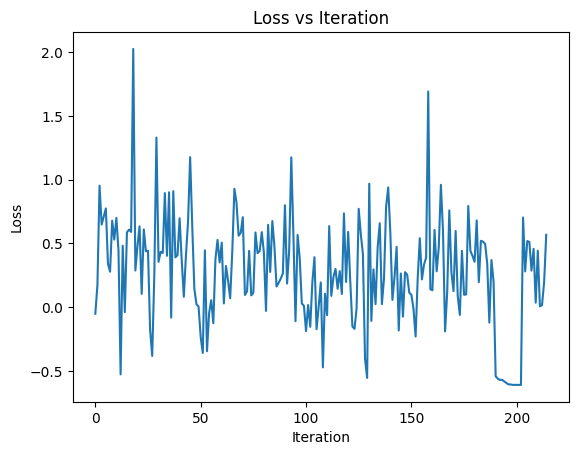


🌍 Training on env: Level 7, Seed 30 | 132 steps
log_probs_theta: -59.40625
log_probs_old: -59.25
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -32.90625
log_probs_old: -32.875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -66.875
log_probs_old: -66.8125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -33.3125
log_probs_old: -33.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -32.71875
log_probs_old: -32.6875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -52.6875
log_probs_old: -52.625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.46875
log_probs_old: -34.34375
delta: -0.125
kl:  0.0078125
log_probs_theta: -31.265625
log_probs_old: -31.1875
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -42.28125
log_probs_old: -42.28125
delta: 0.0
kl:  0.0
log_probs_theta: -35.75
log_probs_old: -35.75
delta: 0.0
kl:  0.0
log_probs_theta: -66.25
log_probs_old: -66.25
delta: 0.0
kl:  0.0
log_probs_theta: -35.53125
log_probs_old: -35.46875
delta: -0.0625
kl:  0.001953

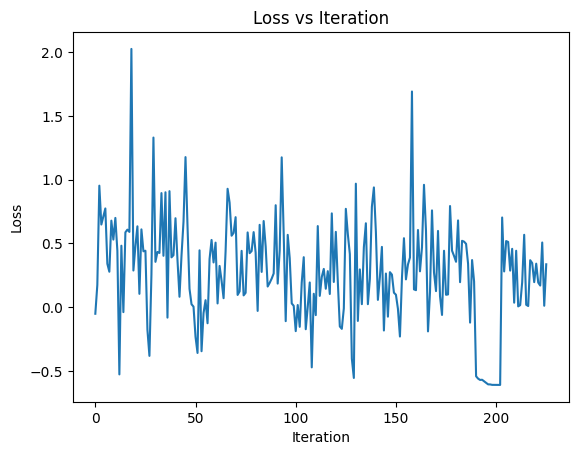


🌍 Training on env: Level 7, Seed 34 | 106 steps
log_probs_theta: -37.15625
log_probs_old: -37.09375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -53.6875
log_probs_old: -53.6875
delta: 0.0
kl:  0.0
log_probs_theta: -43.65625
log_probs_old: -43.6875
delta: 0.03125
kl:  0.0
log_probs_theta: -38.28125
log_probs_old: -38.28125
delta: 0.0
kl:  0.0
log_probs_theta: -34.21875
log_probs_old: -34.09375
delta: -0.125
kl:  0.0078125
log_probs_theta: -36.90625
log_probs_old: -36.8125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -77.0625
log_probs_old: -76.9375
delta: -0.125
kl:  0.0078125
log_probs_theta: -24.953125
log_probs_old: -24.9375
delta: -0.015625
kl:  0.0
log_probs_theta: -32.75
log_probs_old: -32.6875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -58.09375
log_probs_old: -58.0
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -34.40625
log_probs_old: -34.3125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -31.4375
log_probs_old: -31.390625
delta: -0.046875
kl:  0.0009

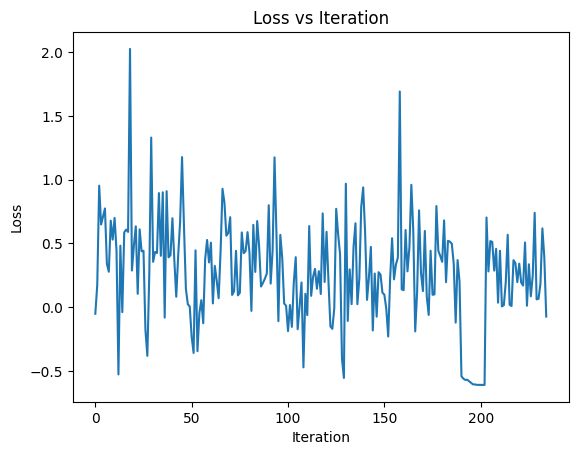


🌍 Training on env: Level 7, Seed 38 | 152 steps
log_probs_theta: -44.59375
log_probs_old: -44.78125
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -48.34375
log_probs_old: -48.4375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -32.78125
log_probs_old: -32.875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -25.546875
log_probs_old: -25.65625
delta: 0.109375
kl:  0.005859375
log_probs_theta: -37.15625
log_probs_old: -37.1875
delta: 0.03125
kl:  0.0
log_probs_theta: -35.96875
log_probs_old: -36.0625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -39.46875
log_probs_old: -39.40625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -42.84375
log_probs_old: -42.96875
delta: 0.125
kl:  0.0078125
log_probs_theta: -28.40625
log_probs_old: -28.4375
delta: 0.03125
kl:  0.0
log_probs_theta: -27.34375
log_probs_old: -27.3125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -22.671875
log_probs_old: -22.625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -33.28125
log_probs_old: -33.28125

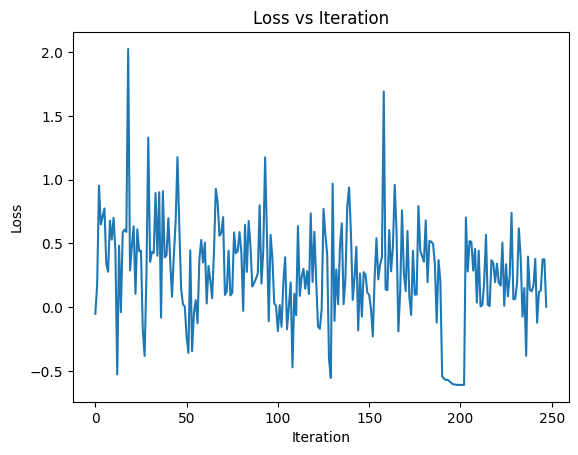


🌍 Training on env: Level 7, Seed 42 | 151 steps
log_probs_theta: -43.15625
log_probs_old: -43.0625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -46.90625
log_probs_old: -46.8125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -33.0625
log_probs_old: -33.0625
delta: 0.0
kl:  0.0
log_probs_theta: -33.8125
log_probs_old: -33.65625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -36.28125
log_probs_old: -36.1875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -45.46875
log_probs_old: -45.25
delta: -0.21875
kl:  0.025390625
log_probs_theta: -37.59375
log_probs_old: -37.5
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -43.25
log_probs_old: -43.1875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.4375
log_probs_old: -40.375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -50.03125
log_probs_old: -49.875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -31.984375
log_probs_old: -31.9375
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -43.5625
log_probs_old: -43.

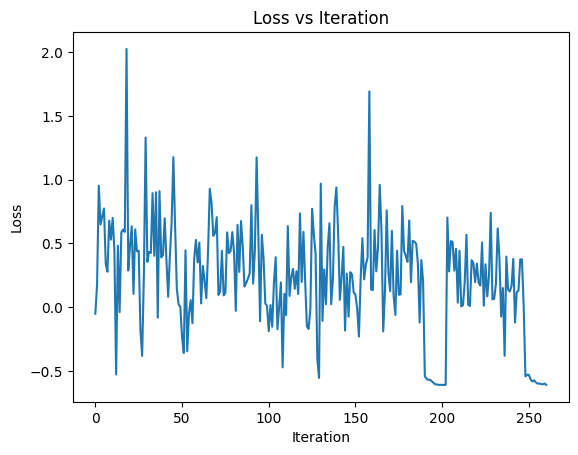


🌍 Training on env: Level 7, Seed 46 | 79 steps
log_probs_theta: -34.6875
log_probs_old: -34.875
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -40.53125
log_probs_old: -40.65625
delta: 0.125
kl:  0.0078125
log_probs_theta: -42.0625
log_probs_old: -42.25
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -42.78125
log_probs_old: -43.03125
delta: 0.25
kl:  0.029296875
log_probs_theta: -36.75
log_probs_old: -36.9375
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -47.90625
log_probs_old: -48.0625
delta: 0.15625
kl:  0.01171875
log_probs_theta: -35.84375
log_probs_old: -35.96875
delta: 0.125
kl:  0.0078125
log_probs_theta: -23.296875
log_probs_old: -23.375
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -29.875
log_probs_old: -29.984375
delta: 0.109375
kl:  0.005859375
log_probs_theta: -29.375
log_probs_old: -29.578125
delta: 0.203125
kl:  0.01953125
log_probs_theta: -51.71875
log_probs_old: -51.90625
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -36.75
log_probs_old: -37.0
delta: 

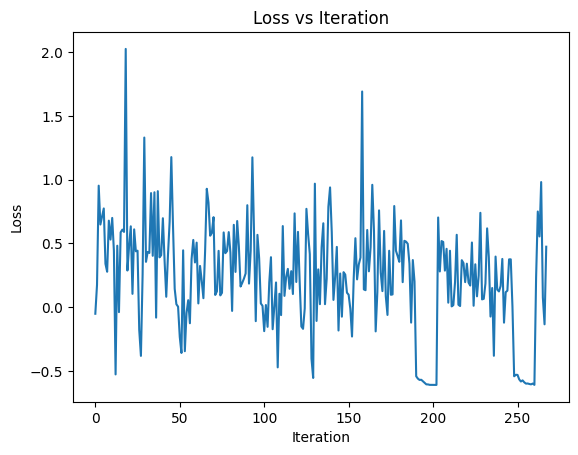


🌟 Epoch 2

🌍 Training on env: Level 5, Seed 10 | 71 steps
log_probs_theta: -42.96875
log_probs_old: -43.21875
delta: 0.25
kl:  0.029296875
log_probs_theta: -19.734375
log_probs_old: -19.84375
delta: 0.109375
kl:  0.005859375
log_probs_theta: -18.890625
log_probs_old: -19.015625
delta: 0.125
kl:  0.0078125
log_probs_theta: -31.78125
log_probs_old: -31.8125
delta: 0.03125
kl:  0.0
log_probs_theta: -33.96875
log_probs_old: -34.0
delta: 0.03125
kl:  0.0
log_probs_theta: -36.15625
log_probs_old: -36.125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -36.53125
log_probs_old: -36.65625
delta: 0.125
kl:  0.0078125
log_probs_theta: -48.6875
log_probs_old: -48.78125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -30.828125
log_probs_old: -30.703125
delta: -0.125
kl:  0.0078125
log_probs_theta: -34.21875
log_probs_old: -34.21875
delta: 0.0
kl:  0.0
log_probs_theta: -39.21875
log_probs_old: -39.1875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -40.15625
log_probs_old: -40.21875
delta: 

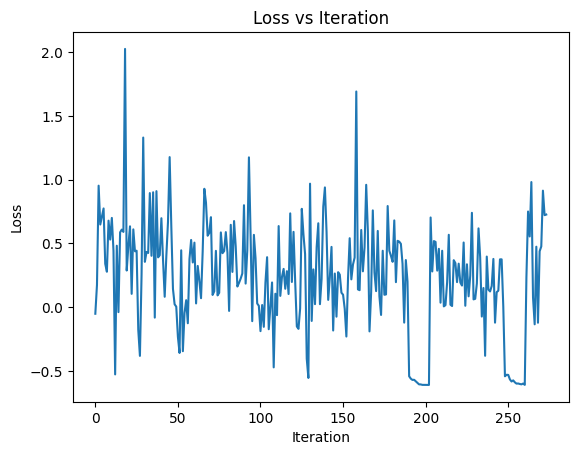


🌍 Training on env: Level 5, Seed 14 | 76 steps
log_probs_theta: -31.90625
log_probs_old: -31.90625
delta: 0.0
kl:  0.0
log_probs_theta: -39.21875
log_probs_old: -39.03125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -35.34375
log_probs_old: -35.3125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -21.328125
log_probs_old: -21.28125
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -54.40625
log_probs_old: -54.25
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -29.0625
log_probs_old: -29.0
delta: -0.0625
kl:  0.001953125
log_probs_theta: -46.0
log_probs_old: -46.0
delta: 0.0
kl:  0.0
log_probs_theta: -41.21875
log_probs_old: -41.15625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -35.65625
log_probs_old: -35.625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -45.125
log_probs_old: -45.0
delta: -0.125
kl:  0.0078125
log_probs_theta: -38.0625
log_probs_old: -38.0
delta: -0.0625
kl:  0.001953125
log_probs_theta: -29.734375
log_probs_old: -29.703125
delta: -0.03125
kl: 

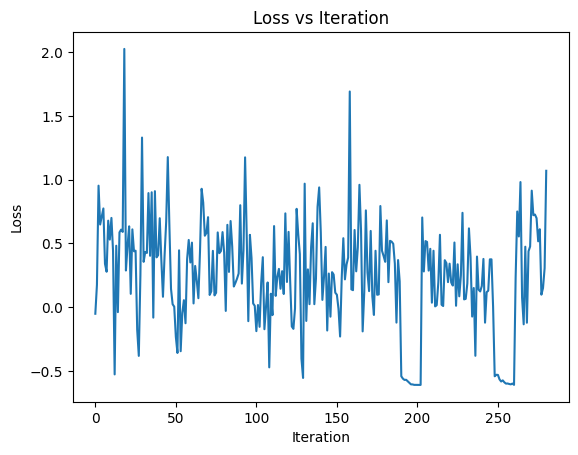


🌍 Training on env: Level 5, Seed 18 | 61 steps
log_probs_theta: -28.84375
log_probs_old: -28.8125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -34.65625
log_probs_old: -34.5
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -21.84375
log_probs_old: -21.8125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -29.25
log_probs_old: -29.203125
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -28.921875
log_probs_old: -28.875
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -31.5
log_probs_old: -31.421875
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -32.15625
log_probs_old: -32.03125
delta: -0.125
kl:  0.0078125
log_probs_theta: -25.953125
log_probs_old: -25.78125
delta: -0.171875
kl:  0.015625
log_probs_theta: -37.6875
log_probs_old: -37.625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -28.578125
log_probs_old: -28.5
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -15.1875
log_probs_old: -15.1796875
delta: -0.0078125
kl:  0.0
log_probs_theta: -37.75
log_probs_o

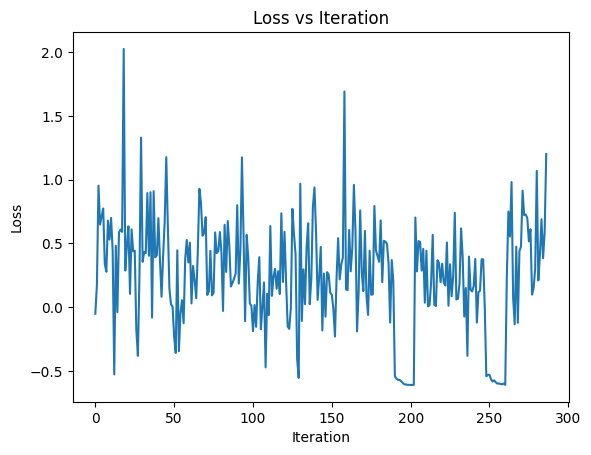


🌍 Training on env: Level 5, Seed 22 | 121 steps
log_probs_theta: -38.3125
log_probs_old: -38.4375
delta: 0.125
kl:  0.0078125
log_probs_theta: -43.15625
log_probs_old: -43.0625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -37.15625
log_probs_old: -37.0
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -57.90625
log_probs_old: -57.90625
delta: 0.0
kl:  0.0
log_probs_theta: -46.90625
log_probs_old: -47.0
delta: 0.09375
kl:  0.00390625
log_probs_theta: -43.6875
log_probs_old: -43.625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.3125
log_probs_old: -34.15625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -60.375
log_probs_old: -60.3125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -46.28125
log_probs_old: -46.21875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.4375
log_probs_old: -40.34375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -39.4375
log_probs_old: -39.40625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -39.09375
log_probs_old: -39.0625
del

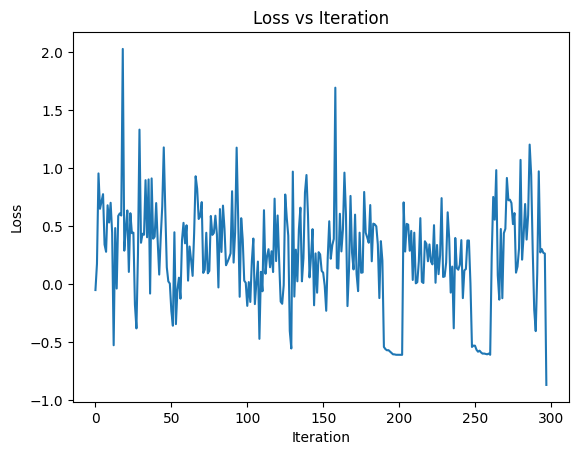


🌍 Training on env: Level 5, Seed 26 | 67 steps
log_probs_theta: -60.4375
log_probs_old: -60.3125
delta: -0.125
kl:  0.0078125
log_probs_theta: -59.09375
log_probs_old: -59.1875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -38.59375
log_probs_old: -38.5625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -32.84375
log_probs_old: -32.8125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -46.96875
log_probs_old: -46.9375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -43.40625
log_probs_old: -43.34375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -46.53125
log_probs_old: -46.5
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -35.5625
log_probs_old: -35.5625
delta: 0.0
kl:  0.0
log_probs_theta: -50.65625
log_probs_old: -50.5625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -34.59375
log_probs_old: -34.625
delta: 0.03125
kl:  0.0
log_probs_theta: -42.0625
log_probs_old: -42.0
delta: -0.0625
kl:  0.001953125
log_probs_theta: -42.125
log_probs_old: -42.15625
delta: 0.031

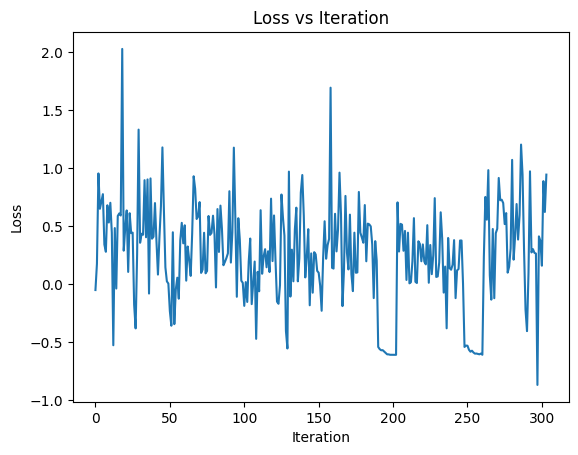


🌍 Training on env: Level 5, Seed 30 | 79 steps
log_probs_theta: -37.9375
log_probs_old: -37.90625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -39.03125
log_probs_old: -39.03125
delta: 0.0
kl:  0.0
log_probs_theta: -40.71875
log_probs_old: -40.75
delta: 0.03125
kl:  0.0
log_probs_theta: -26.8125
log_probs_old: -26.828125
delta: 0.015625
kl:  0.0
log_probs_theta: -42.125
log_probs_old: -42.0625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -41.78125
log_probs_old: -41.84375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -29.875
log_probs_old: -29.921875
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -34.625
log_probs_old: -34.65625
delta: 0.03125
kl:  0.0
log_probs_theta: -25.015625
log_probs_old: -24.984375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -33.40625
log_probs_old: -33.5
delta: 0.09375
kl:  0.00390625
log_probs_theta: -42.875
log_probs_old: -42.78125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -30.765625
log_probs_old: -30.78125
delta: 0.015625
kl

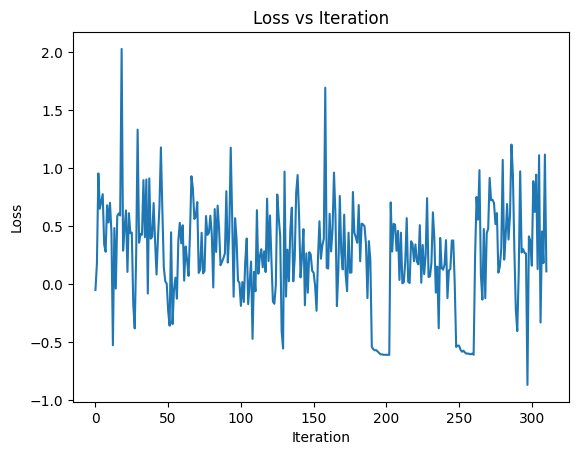


🌍 Training on env: Level 5, Seed 34 | 68 steps
log_probs_theta: -39.8125
log_probs_old: -39.78125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -20.515625
log_probs_old: -20.453125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -45.03125
log_probs_old: -44.96875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -37.0
log_probs_old: -37.03125
delta: 0.03125
kl:  0.0
log_probs_theta: -59.46875
log_probs_old: -59.28125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -16.046875
log_probs_old: -15.9921875
delta: -0.0546875
kl:  0.001953125
log_probs_theta: -40.75
log_probs_old: -40.71875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -34.375
log_probs_old: -34.34375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -36.78125
log_probs_old: -36.90625
delta: 0.125
kl:  0.0078125
log_probs_theta: -34.8125
log_probs_old: -34.875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -22.09375
log_probs_old: -22.109375
delta: 0.015625
kl:  0.0
log_probs_theta: -29.859375
log_probs_old: -2

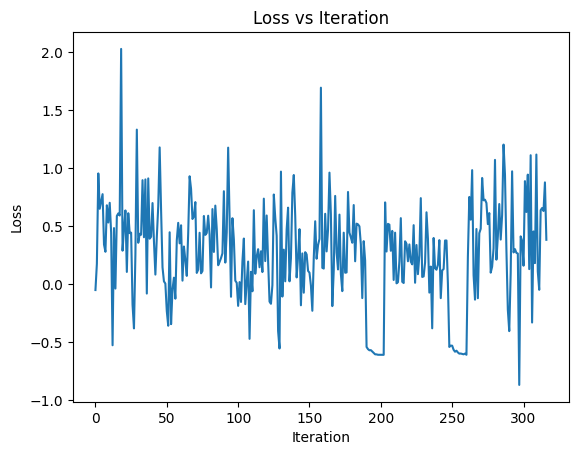


🌍 Training on env: Level 5, Seed 38 | 70 steps
log_probs_theta: -22.765625
log_probs_old: -22.6875
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -37.9375
log_probs_old: -37.90625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -35.75
log_probs_old: -35.75
delta: 0.0
kl:  0.0
log_probs_theta: -39.65625
log_probs_old: -39.53125
delta: -0.125
kl:  0.0078125
log_probs_theta: -28.625
log_probs_old: -28.625
delta: 0.0
kl:  0.0
log_probs_theta: -18.546875
log_probs_old: -18.609375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -53.28125
log_probs_old: -53.1875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -51.3125
log_probs_old: -51.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -43.25
log_probs_old: -43.375
delta: 0.125
kl:  0.0078125
log_probs_theta: -50.125
log_probs_old: -50.03125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -28.578125
log_probs_old: -28.625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -36.59375
log_probs_old: -36.53125
delta: -0.0625

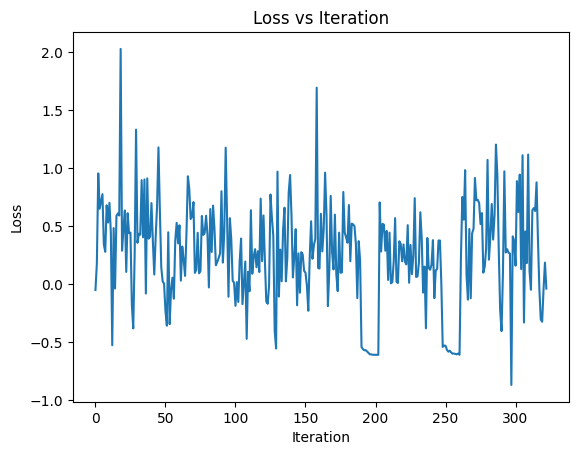


🌍 Training on env: Level 5, Seed 42 | 108 steps
log_probs_theta: -36.03125
log_probs_old: -36.0625
delta: 0.03125
kl:  0.0
log_probs_theta: -32.9375
log_probs_old: -32.90625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -29.65625
log_probs_old: -29.640625
delta: -0.015625
kl:  0.0
log_probs_theta: -37.03125
log_probs_old: -36.9375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -33.59375
log_probs_old: -33.53125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -51.71875
log_probs_old: -51.6875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -58.3125
log_probs_old: -58.125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -25.328125
log_probs_old: -25.28125
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -32.09375
log_probs_old: -32.0625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -30.921875
log_probs_old: -30.859375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -54.34375
log_probs_old: -54.1875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -33.0
log_probs

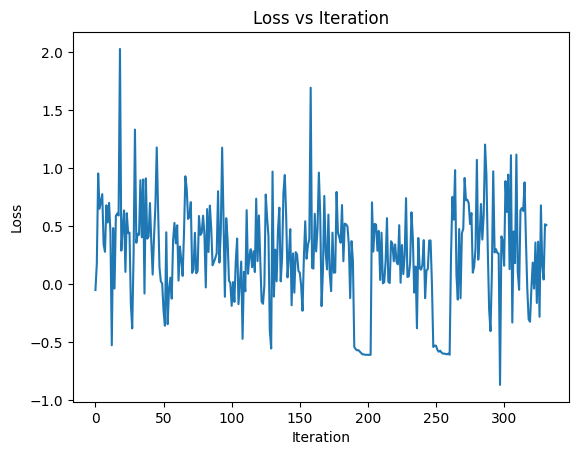


🌍 Training on env: Level 5, Seed 46 | 81 steps
log_probs_theta: -28.015625
log_probs_old: -28.1875
delta: 0.171875
kl:  0.013671875
log_probs_theta: -44.5625
log_probs_old: -44.53125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -53.46875
log_probs_old: -53.28125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -76.0625
log_probs_old: -75.875
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -22.84375
log_probs_old: -22.78125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -22.0625
log_probs_old: -22.171875
delta: 0.109375
kl:  0.005859375
log_probs_theta: -41.8125
log_probs_old: -41.90625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -37.46875
log_probs_old: -37.4375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -39.8125
log_probs_old: -39.625
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -27.09375
log_probs_old: -27.140625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -30.921875
log_probs_old: -30.890625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -38.9

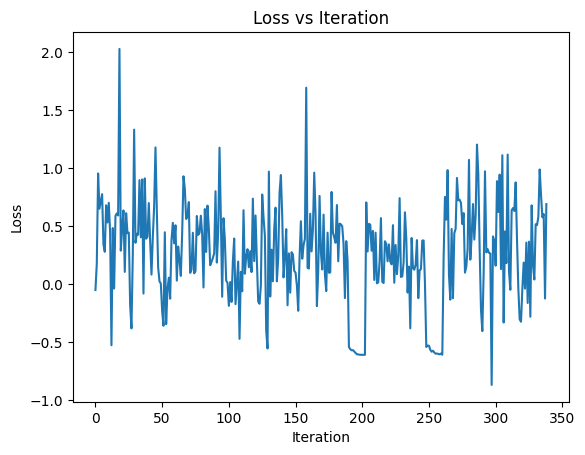


🌍 Training on env: Level 6, Seed 10 | 130 steps
log_probs_theta: -35.375
log_probs_old: -35.4375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -34.4375
log_probs_old: -34.28125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -61.5
log_probs_old: -61.4375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -35.34375
log_probs_old: -35.25
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -38.6875
log_probs_old: -38.53125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -37.90625
log_probs_old: -37.65625
delta: -0.25
kl:  0.0341796875
log_probs_theta: -37.96875
log_probs_old: -38.03125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -27.703125
log_probs_old: -27.78125
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -40.625
log_probs_old: -40.40625
delta: -0.21875
kl:  0.025390625
log_probs_theta: -34.09375
log_probs_old: -34.15625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -41.0
log_probs_old: -40.96875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -52.625
log_probs_old

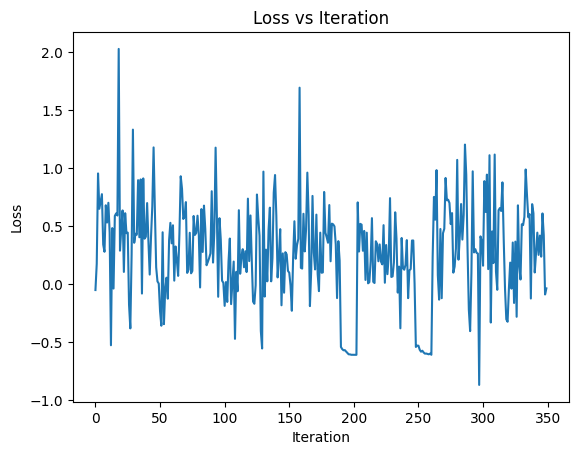


🌍 Training on env: Level 6, Seed 14 | 72 steps
log_probs_theta: -44.53125
log_probs_old: -44.46875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -28.421875
log_probs_old: -28.46875
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -20.53125
log_probs_old: -20.40625
delta: -0.125
kl:  0.0078125
log_probs_theta: -38.0625
log_probs_old: -38.03125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -15.328125
log_probs_old: -15.3359375
delta: 0.0078125
kl:  0.0
log_probs_theta: -52.625
log_probs_old: -52.46875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -52.03125
log_probs_old: -51.875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -40.84375
log_probs_old: -40.8125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -41.96875
log_probs_old: -41.75
delta: -0.21875
kl:  0.025390625
log_probs_theta: -46.0
log_probs_old: -45.84375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -42.84375
log_probs_old: -42.78125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -28.109375
log_p

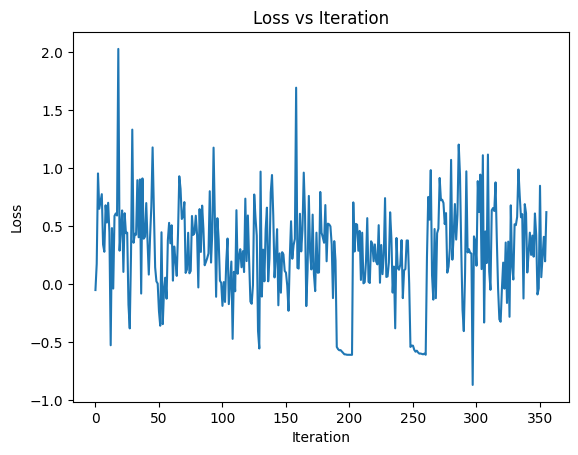


🌍 Training on env: Level 6, Seed 18 | 89 steps
log_probs_theta: -39.09375
log_probs_old: -39.09375
delta: 0.0
kl:  0.0
log_probs_theta: -21.765625
log_probs_old: -21.765625
delta: 0.0
kl:  0.0
log_probs_theta: -33.0
log_probs_old: -33.0
delta: 0.0
kl:  0.0
log_probs_theta: -19.0625
log_probs_old: -19.140625
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -92.1875
log_probs_old: -91.9375
delta: -0.25
kl:  0.0341796875
log_probs_theta: -33.5625
log_probs_old: -33.53125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -35.09375
log_probs_old: -35.0625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -37.59375
log_probs_old: -37.59375
delta: 0.0
kl:  0.0
log_probs_theta: -56.625
log_probs_old: -56.5625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -31.171875
log_probs_old: -31.171875
delta: 0.0
kl:  0.0
log_probs_theta: -33.8125
log_probs_old: -33.78125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -28.84375
log_probs_old: -28.875
delta: 0.03125
kl:  0.0
✅ Epoch 2 | Batch [

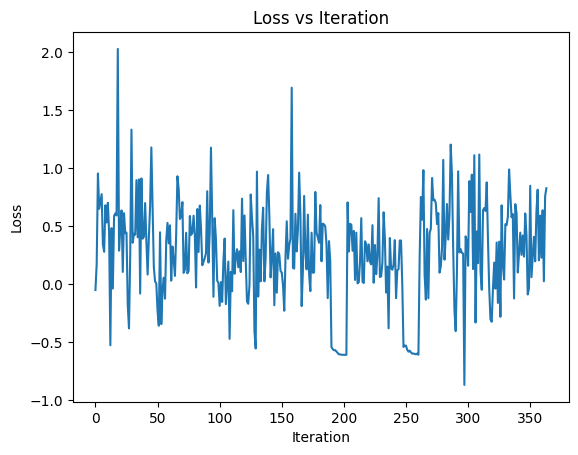


🌍 Training on env: Level 6, Seed 22 | 155 steps
log_probs_theta: -54.03125
log_probs_old: -54.0
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -51.5625
log_probs_old: -51.75
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -33.03125
log_probs_old: -32.9375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -40.4375
log_probs_old: -40.34375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -31.0625
log_probs_old: -31.015625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -36.625
log_probs_old: -36.4375
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -41.75
log_probs_old: -41.71875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -53.375
log_probs_old: -53.4375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -50.3125
log_probs_old: -50.3125
delta: 0.0
kl:  0.0
log_probs_theta: -31.8125
log_probs_old: -31.796875
delta: -0.015625
kl:  0.0
log_probs_theta: -32.5625
log_probs_old: -32.28125
delta: -0.28125
kl:  0.0439453125
log_probs_theta: -30.140625
log_probs_old: -30.109375


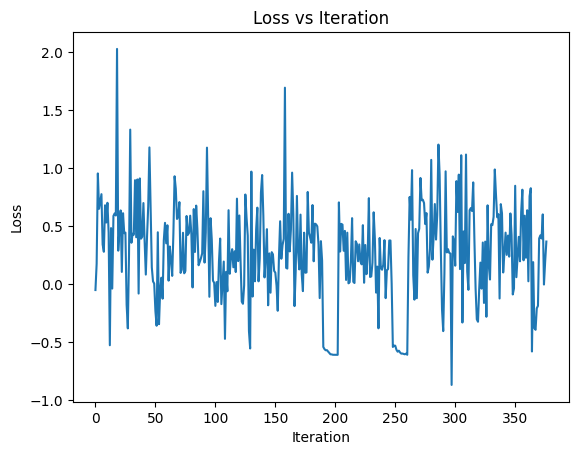


🌍 Training on env: Level 6, Seed 26 | 115 steps
log_probs_theta: -41.21875
log_probs_old: -41.0
delta: -0.21875
kl:  0.025390625
log_probs_theta: -27.46875
log_probs_old: -27.453125
delta: -0.015625
kl:  0.0
log_probs_theta: -26.90625
log_probs_old: -26.90625
delta: 0.0
kl:  0.0
log_probs_theta: -33.625
log_probs_old: -33.65625
delta: 0.03125
kl:  0.0
log_probs_theta: -27.3125
log_probs_old: -27.359375
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -25.796875
log_probs_old: -25.71875
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -60.3125
log_probs_old: -60.3125
delta: 0.0
kl:  0.0
log_probs_theta: -34.15625
log_probs_old: -34.09375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -50.5625
log_probs_old: -50.375
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -80.0625
log_probs_old: -79.8125
delta: -0.25
kl:  0.0341796875
log_probs_theta: -48.40625
log_probs_old: -48.3125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -39.5
log_probs_old: -39.28125
delta: -0.21875
kl:  

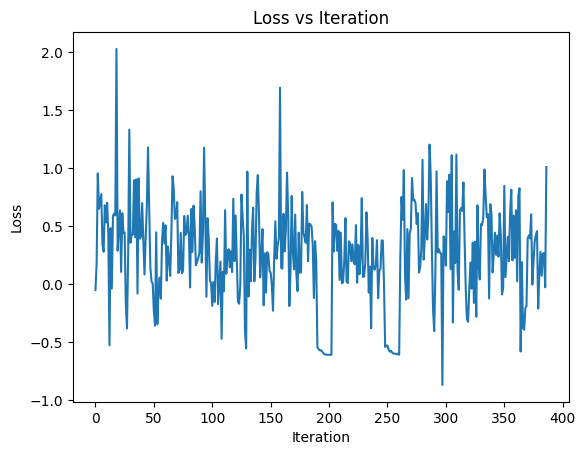


🌍 Training on env: Level 6, Seed 30 | 122 steps
log_probs_theta: -37.3125
log_probs_old: -37.34375
delta: 0.03125
kl:  0.0
log_probs_theta: -37.0625
log_probs_old: -37.0625
delta: 0.0
kl:  0.0
log_probs_theta: -33.1875
log_probs_old: -33.0625
delta: -0.125
kl:  0.0078125
log_probs_theta: -23.703125
log_probs_old: -23.734375
delta: 0.03125
kl:  0.0
log_probs_theta: -46.84375
log_probs_old: -46.6875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -30.03125
log_probs_old: -30.09375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -41.53125
log_probs_old: -41.625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -33.1875
log_probs_old: -33.09375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -31.28125
log_probs_old: -31.21875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.84375
log_probs_old: -34.875
delta: 0.03125
kl:  0.0
log_probs_theta: -48.3125
log_probs_old: -48.4375
delta: 0.125
kl:  0.0078125
log_probs_theta: -30.59375
log_probs_old: -30.5625
delta: -0.03125
kl:  0.00097

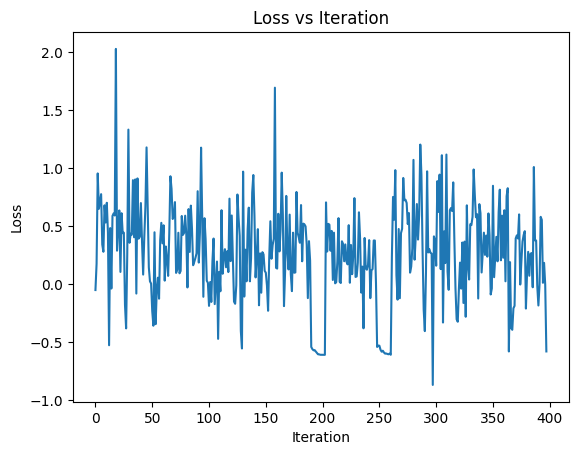


🌍 Training on env: Level 6, Seed 34 | 66 steps
log_probs_theta: -28.0625
log_probs_old: -28.015625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -34.125
log_probs_old: -34.25
delta: 0.125
kl:  0.0078125
log_probs_theta: -45.59375
log_probs_old: -45.625
delta: 0.03125
kl:  0.0
log_probs_theta: -25.40625
log_probs_old: -25.390625
delta: -0.015625
kl:  0.0
log_probs_theta: -26.6875
log_probs_old: -26.734375
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -29.671875
log_probs_old: -29.640625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -46.96875
log_probs_old: -46.9375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -43.5
log_probs_old: -43.4375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.6875
log_probs_old: -40.78125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -39.34375
log_probs_old: -39.375
delta: 0.03125
kl:  0.0
log_probs_theta: -33.15625
log_probs_old: -33.1875
delta: 0.03125
kl:  0.0
log_probs_theta: -26.4375
log_probs_old: -26.46875
delta: 0.03125
kl

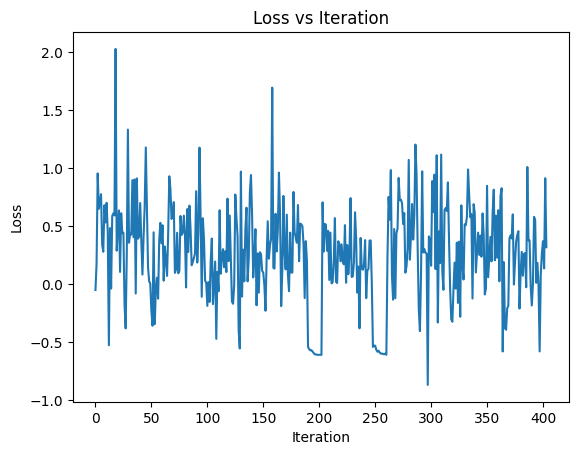


🌍 Training on env: Level 6, Seed 38 | 95 steps
log_probs_theta: -52.375
log_probs_old: -52.5
delta: 0.125
kl:  0.0078125
log_probs_theta: -71.1875
log_probs_old: -71.375
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -44.6875
log_probs_old: -44.75
delta: 0.0625
kl:  0.001953125
log_probs_theta: -47.4375
log_probs_old: -47.53125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -37.625
log_probs_old: -37.59375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -25.328125
log_probs_old: -25.4375
delta: 0.109375
kl:  0.005859375
log_probs_theta: -46.875
log_probs_old: -46.84375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -29.140625
log_probs_old: -29.203125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -42.0
log_probs_old: -42.03125
delta: 0.03125
kl:  0.0
log_probs_theta: -25.0625
log_probs_old: -25.0625
delta: 0.0
kl:  0.0
log_probs_theta: -51.03125
log_probs_old: -51.0
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -39.5
log_probs_old: -39.5625
delta: 0.0625
kl:  0.001953

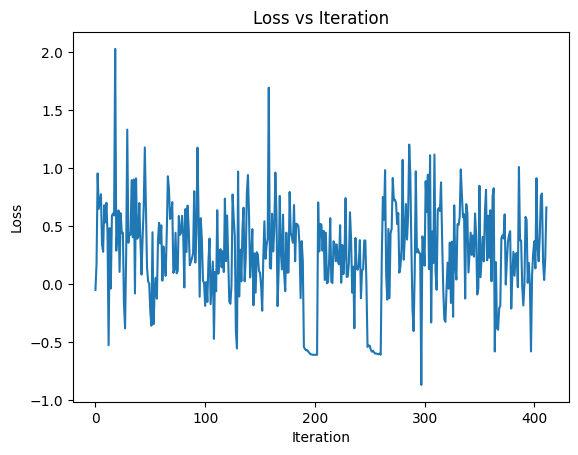


🌍 Training on env: Level 6, Seed 42 | 104 steps
log_probs_theta: -29.90625
log_probs_old: -29.90625
delta: 0.0
kl:  0.0
log_probs_theta: -47.3125
log_probs_old: -47.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -44.9375
log_probs_old: -44.75
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -50.53125
log_probs_old: -50.65625
delta: 0.125
kl:  0.0078125
log_probs_theta: -50.1875
log_probs_old: -49.9375
delta: -0.25
kl:  0.0341796875
log_probs_theta: -33.5625
log_probs_old: -33.46875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -37.65625
log_probs_old: -37.625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -62.09375
log_probs_old: -61.96875
delta: -0.125
kl:  0.0078125
log_probs_theta: -62.21875
log_probs_old: -62.1875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -37.34375
log_probs_old: -37.21875
delta: -0.125
kl:  0.0078125
log_probs_theta: -38.0625
log_probs_old: -37.96875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -43.5625
log_probs_old: -43.4375
d

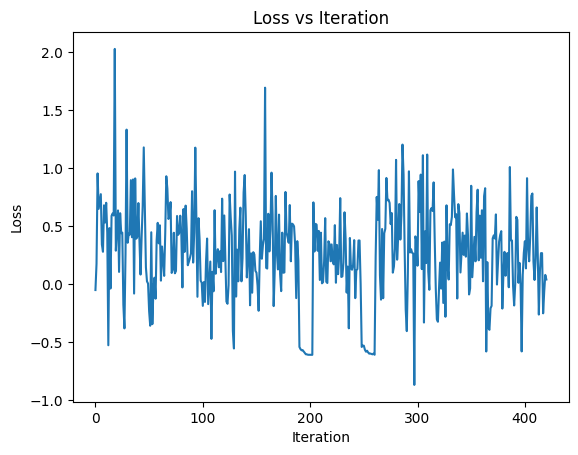


🌍 Training on env: Level 6, Seed 46 | 61 steps
log_probs_theta: -42.46875
log_probs_old: -42.4375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -28.28125
log_probs_old: -28.25
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -61.125
log_probs_old: -60.96875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -33.40625
log_probs_old: -33.40625
delta: 0.0
kl:  0.0
log_probs_theta: -19.078125
log_probs_old: -19.15625
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -34.71875
log_probs_old: -34.65625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -27.859375
log_probs_old: -27.75
delta: -0.109375
kl:  0.005859375
log_probs_theta: -35.21875
log_probs_old: -35.09375
delta: -0.125
kl:  0.0078125
log_probs_theta: -30.3125
log_probs_old: -30.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -36.875
log_probs_old: -36.75
delta: -0.125
kl:  0.0078125
log_probs_theta: -38.6875
log_probs_old: -38.6875
delta: 0.0
kl:  0.0
log_probs_theta: -30.265625
log_probs_old: -30.265625
delta: 

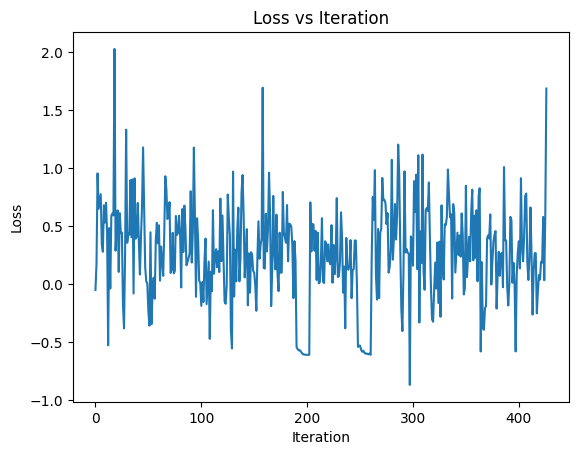


🌍 Training on env: Level 7, Seed 10 | 112 steps
log_probs_theta: -24.953125
log_probs_old: -24.921875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -41.71875
log_probs_old: -41.84375
delta: 0.125
kl:  0.0078125
log_probs_theta: -51.78125
log_probs_old: -51.90625
delta: 0.125
kl:  0.0078125
log_probs_theta: -38.125
log_probs_old: -38.125
delta: 0.0
kl:  0.0
log_probs_theta: -46.75
log_probs_old: -46.84375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -41.59375
log_probs_old: -41.4375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -41.65625
log_probs_old: -41.78125
delta: 0.125
kl:  0.0078125
log_probs_theta: -49.78125
log_probs_old: -49.71875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.09375
log_probs_old: -34.125
delta: 0.03125
kl:  0.0
log_probs_theta: -34.8125
log_probs_old: -34.90625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -53.34375
log_probs_old: -53.4375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -38.84375
log_probs_old: -38.84375
delta: 0.0
kl:  

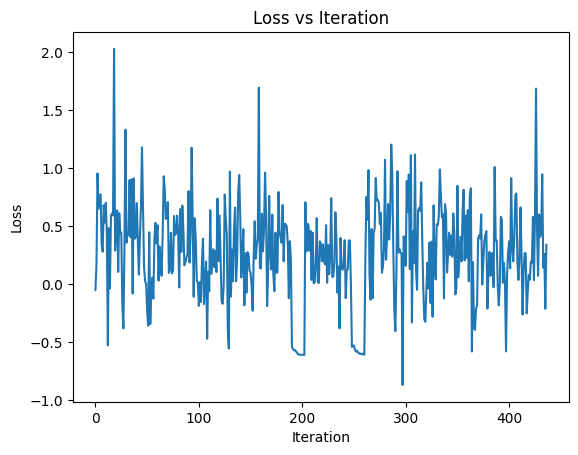


🌍 Training on env: Level 7, Seed 14 | 131 steps
log_probs_theta: -38.375
log_probs_old: -38.25
delta: -0.125
kl:  0.0078125
log_probs_theta: -60.5
log_probs_old: -60.46875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -28.125
log_probs_old: -28.15625
delta: 0.03125
kl:  0.0
log_probs_theta: -33.5
log_probs_old: -33.375
delta: -0.125
kl:  0.0078125
log_probs_theta: -39.0625
log_probs_old: -38.96875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -39.25
log_probs_old: -39.28125
delta: 0.03125
kl:  0.0
log_probs_theta: -31.34375
log_probs_old: -31.21875
delta: -0.125
kl:  0.0078125
log_probs_theta: -27.453125
log_probs_old: -27.4375
delta: -0.015625
kl:  0.0
log_probs_theta: -40.0
log_probs_old: -39.75
delta: -0.25
kl:  0.0341796875
log_probs_theta: -32.84375
log_probs_old: -32.90625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -38.5
log_probs_old: -38.40625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -43.34375
log_probs_old: -43.25
delta: -0.09375
kl:  0.0048828125
✅ E

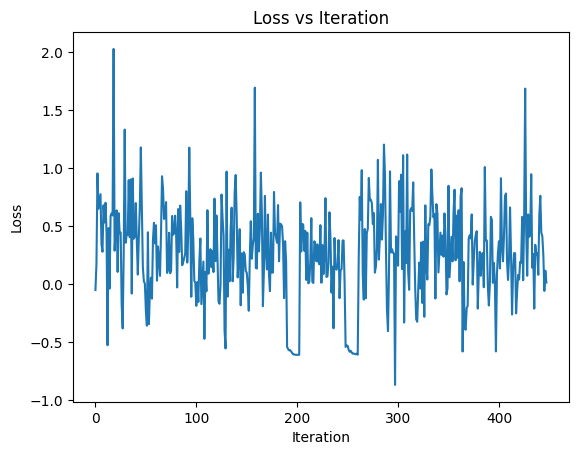


🌍 Training on env: Level 7, Seed 18 | 118 steps
log_probs_theta: -32.71875
log_probs_old: -32.59375
delta: -0.125
kl:  0.0078125
log_probs_theta: -38.5625
log_probs_old: -38.375
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -26.71875
log_probs_old: -26.734375
delta: 0.015625
kl:  0.0
log_probs_theta: -22.609375
log_probs_old: -22.671875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -27.640625
log_probs_old: -27.578125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -33.25
log_probs_old: -33.375
delta: 0.125
kl:  0.0078125
log_probs_theta: -25.0
log_probs_old: -25.0625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -19.34375
log_probs_old: -19.421875
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -34.71875
log_probs_old: -34.78125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -33.59375
log_probs_old: -33.59375
delta: 0.0
kl:  0.0
log_probs_theta: -46.5
log_probs_old: -46.46875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -38.5
log_probs_old: -38.46875
delta: -0.0312

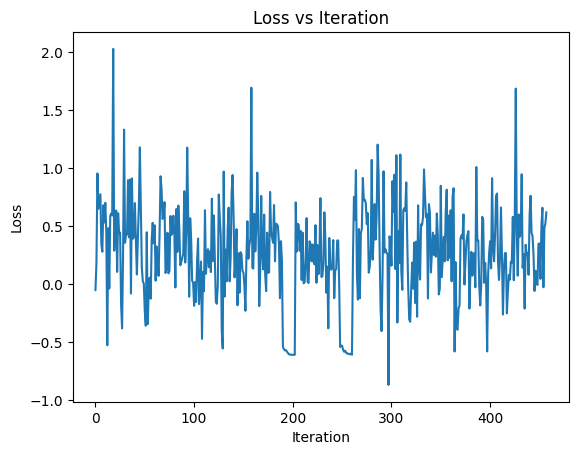


🌍 Training on env: Level 7, Seed 22 | 147 steps
log_probs_theta: -42.5625
log_probs_old: -42.65625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -30.90625
log_probs_old: -31.0
delta: 0.09375
kl:  0.00390625
log_probs_theta: -42.09375
log_probs_old: -42.03125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -52.25
log_probs_old: -52.0625
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -60.8125
log_probs_old: -60.875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -35.65625
log_probs_old: -35.6875
delta: 0.03125
kl:  0.0
log_probs_theta: -32.59375
log_probs_old: -32.5625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -32.9375
log_probs_old: -32.90625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -46.96875
log_probs_old: -46.78125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -59.71875
log_probs_old: -59.71875
delta: 0.0
kl:  0.0
log_probs_theta: -35.625
log_probs_old: -35.5625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -48.96875
log_probs_old: -49.0
delta: 0.03125

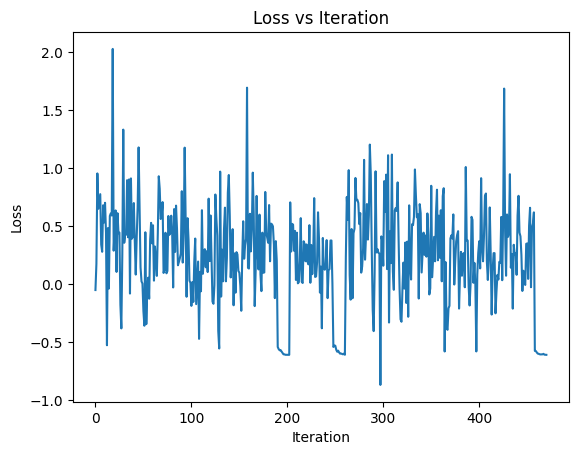


🌍 Training on env: Level 7, Seed 26 | 139 steps
log_probs_theta: -31.75
log_probs_old: -31.765625
delta: 0.015625
kl:  0.0
log_probs_theta: -35.75
log_probs_old: -35.78125
delta: 0.03125
kl:  0.0
log_probs_theta: -61.90625
log_probs_old: -61.9375
delta: 0.03125
kl:  0.0
log_probs_theta: -37.5625
log_probs_old: -37.5625
delta: 0.0
kl:  0.0
log_probs_theta: -50.25
log_probs_old: -50.28125
delta: 0.03125
kl:  0.0
log_probs_theta: -39.40625
log_probs_old: -39.40625
delta: 0.0
kl:  0.0
log_probs_theta: -33.1875
log_probs_old: -33.25
delta: 0.0625
kl:  0.001953125
log_probs_theta: -41.0
log_probs_old: -41.03125
delta: 0.03125
kl:  0.0
log_probs_theta: -37.625
log_probs_old: -37.71875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -29.3125
log_probs_old: -29.375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -31.6875
log_probs_old: -31.796875
delta: 0.109375
kl:  0.005859375
log_probs_theta: -35.15625
log_probs_old: -35.125
delta: -0.03125
kl:  0.0009765625
✅ Epoch 2 | Batch [0-11] | Loss:

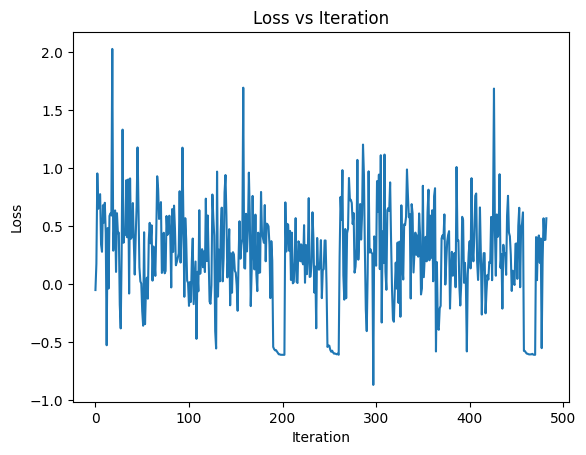


🌍 Training on env: Level 7, Seed 30 | 132 steps
log_probs_theta: -38.84375
log_probs_old: -38.9375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -29.984375
log_probs_old: -29.953125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -31.46875
log_probs_old: -31.484375
delta: 0.015625
kl:  0.0
log_probs_theta: -59.21875
log_probs_old: -59.25
delta: 0.03125
kl:  0.0
log_probs_theta: -55.90625
log_probs_old: -55.875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -45.875
log_probs_old: -45.9375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -25.328125
log_probs_old: -25.296875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -55.21875
log_probs_old: -55.28125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -35.75
log_probs_old: -35.84375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -32.875
log_probs_old: -32.875
delta: 0.0
kl:  0.0
log_probs_theta: -67.125
log_probs_old: -67.0625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -22.25
log_probs_old: -22.265625
delta: 0.015625


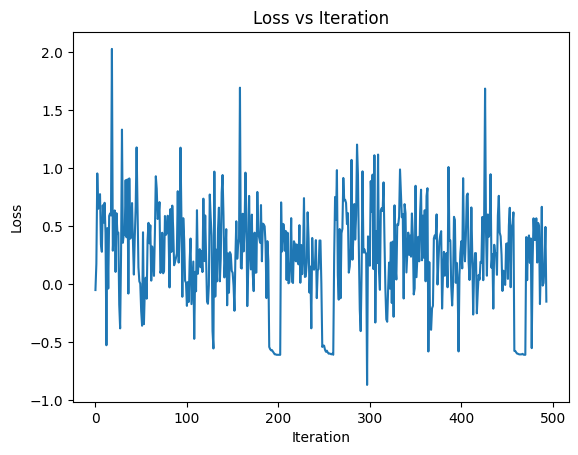


🌍 Training on env: Level 7, Seed 34 | 106 steps
log_probs_theta: -56.28125
log_probs_old: -56.03125
delta: -0.25
kl:  0.0341796875
log_probs_theta: -35.4375
log_probs_old: -35.4375
delta: 0.0
kl:  0.0
log_probs_theta: -36.96875
log_probs_old: -36.78125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -30.828125
log_probs_old: -30.6875
delta: -0.140625
kl:  0.0107421875
log_probs_theta: -43.8125
log_probs_old: -43.6875
delta: -0.125
kl:  0.0078125
log_probs_theta: -33.3125
log_probs_old: -33.1875
delta: -0.125
kl:  0.0078125
log_probs_theta: -31.046875
log_probs_old: -30.875
delta: -0.171875
kl:  0.015625
log_probs_theta: -38.59375
log_probs_old: -38.53125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.5625
log_probs_old: -34.46875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -39.78125
log_probs_old: -39.6875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -43.90625
log_probs_old: -43.6875
delta: -0.21875
kl:  0.025390625
log_probs_theta: -31.5
log_probs_old: -31.359375

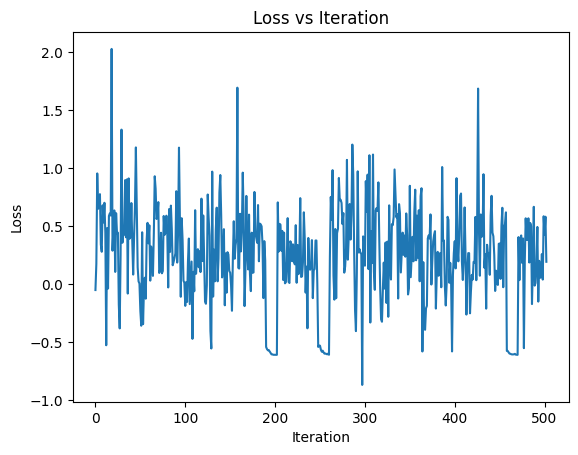


🌍 Training on env: Level 7, Seed 38 | 152 steps
log_probs_theta: -44.75
log_probs_old: -44.78125
delta: 0.03125
kl:  0.0
log_probs_theta: -31.96875
log_probs_old: -32.0
delta: 0.03125
kl:  0.0
log_probs_theta: -33.1875
log_probs_old: -33.28125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -26.3125
log_probs_old: -26.296875
delta: -0.015625
kl:  0.0
log_probs_theta: -36.09375
log_probs_old: -36.0
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -32.71875
log_probs_old: -32.71875
delta: 0.0
kl:  0.0
log_probs_theta: -57.0
log_probs_old: -56.96875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -44.09375
log_probs_old: -44.0625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -55.625
log_probs_old: -55.71875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -31.203125
log_probs_old: -31.265625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -27.296875
log_probs_old: -27.3125
delta: 0.015625
kl:  0.0
log_probs_theta: -35.0
log_probs_old: -35.03125
delta: 0.03125
kl:  0.0
✅ Epoch 2 

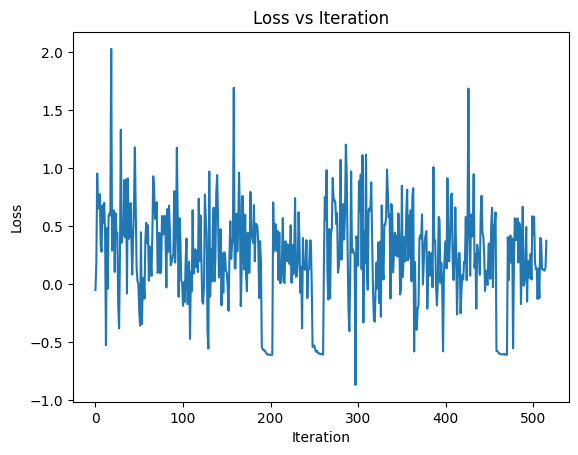


🌍 Training on env: Level 7, Seed 42 | 151 steps
log_probs_theta: -52.59375
log_probs_old: -52.59375
delta: 0.0
kl:  0.0
log_probs_theta: -39.59375
log_probs_old: -39.65625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -46.8125
log_probs_old: -46.8125
delta: 0.0
kl:  0.0
log_probs_theta: -37.65625
log_probs_old: -37.71875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -43.8125
log_probs_old: -43.78125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -39.15625
log_probs_old: -39.1875
delta: 0.03125
kl:  0.0
log_probs_theta: -24.953125
log_probs_old: -24.953125
delta: 0.0
kl:  0.0
log_probs_theta: -24.078125
log_probs_old: -24.0625
delta: -0.015625
kl:  0.0
log_probs_theta: -48.90625
log_probs_old: -48.84375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -46.3125
log_probs_old: -46.125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -45.0
log_probs_old: -44.96875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -35.0
log_probs_old: -34.9375
delta: -0.0625
kl:  0.001953125
✅ Ep

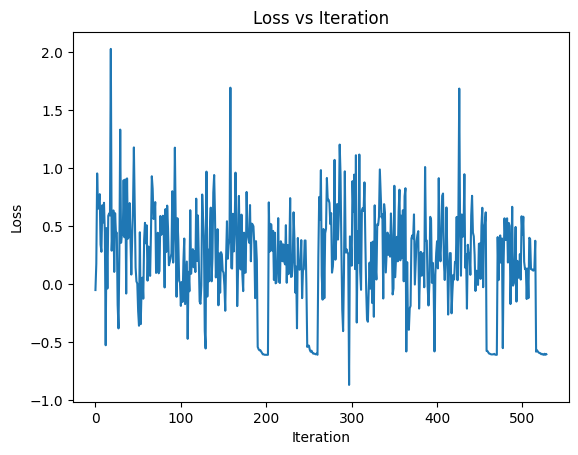


🌍 Training on env: Level 7, Seed 46 | 79 steps
log_probs_theta: -40.0
log_probs_old: -40.125
delta: 0.125
kl:  0.0078125
log_probs_theta: -42.78125
log_probs_old: -42.6875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -20.0
log_probs_old: -19.9375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -36.9375
log_probs_old: -36.9375
delta: 0.0
kl:  0.0
log_probs_theta: -66.0
log_probs_old: -65.875
delta: -0.125
kl:  0.0078125
log_probs_theta: -26.296875
log_probs_old: -26.203125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -23.375
log_probs_old: -23.375
delta: 0.0
kl:  0.0
log_probs_theta: -34.0
log_probs_old: -34.125
delta: 0.125
kl:  0.0078125
log_probs_theta: -34.125
log_probs_old: -34.15625
delta: 0.03125
kl:  0.0
log_probs_theta: -41.71875
log_probs_old: -41.71875
delta: 0.0
kl:  0.0
log_probs_theta: -32.96875
log_probs_old: -32.96875
delta: 0.0
kl:  0.0
log_probs_theta: -48.125
log_probs_old: -48.0625
delta: -0.0625
kl:  0.001953125
✅ Epoch 2 | Batch [0-11] | Loss: 0.2319


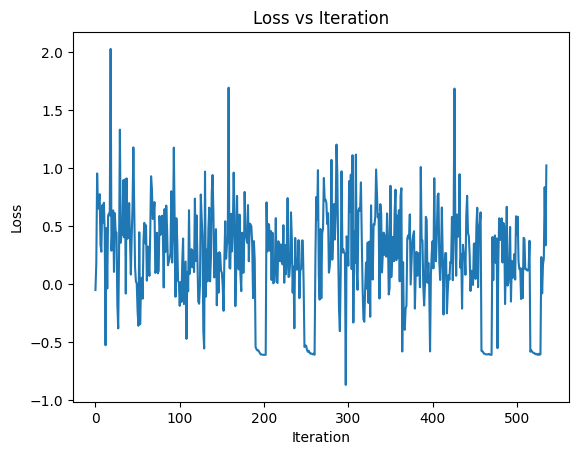


🌟 Epoch 3

🌍 Training on env: Level 5, Seed 10 | 71 steps
log_probs_theta: -41.59375
log_probs_old: -41.71875
delta: 0.125
kl:  0.0078125
log_probs_theta: -29.75
log_probs_old: -29.828125
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -29.203125
log_probs_old: -29.21875
delta: 0.015625
kl:  0.0
log_probs_theta: -52.09375
log_probs_old: -51.90625
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -44.75
log_probs_old: -44.78125
delta: 0.03125
kl:  0.0
log_probs_theta: -52.75
log_probs_old: -52.59375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -34.09375
log_probs_old: -34.15625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -35.875
log_probs_old: -35.875
delta: 0.0
kl:  0.0
log_probs_theta: -36.5
log_probs_old: -36.65625
delta: 0.15625
kl:  0.01171875
log_probs_theta: -34.0
log_probs_old: -34.125
delta: 0.125
kl:  0.0078125
log_probs_theta: -47.4375
log_probs_old: -47.4375
delta: 0.0
kl:  0.0
log_probs_theta: -28.203125
log_probs_old: -28.28125
delta: 0.078125
kl:  0.00292968

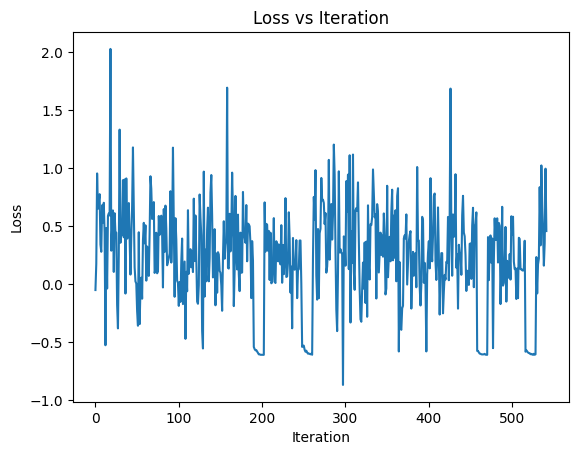


🌍 Training on env: Level 5, Seed 14 | 76 steps
log_probs_theta: -34.5625
log_probs_old: -34.625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -27.828125
log_probs_old: -27.890625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -27.734375
log_probs_old: -27.75
delta: 0.015625
kl:  0.0
log_probs_theta: -36.6875
log_probs_old: -36.625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -31.859375
log_probs_old: -31.90625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -35.15625
log_probs_old: -35.21875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -37.34375
log_probs_old: -37.1875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -41.21875
log_probs_old: -41.21875
delta: 0.0
kl:  0.0
log_probs_theta: -33.625
log_probs_old: -33.6875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -41.125
log_probs_old: -41.15625
delta: 0.03125
kl:  0.0
log_probs_theta: -31.796875
log_probs_old: -31.890625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -35.21875
log_probs_old: -35.3125
delta: 0.09375

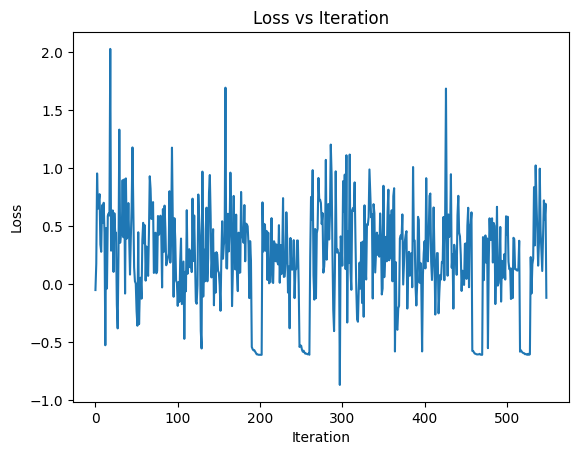


🌍 Training on env: Level 5, Seed 18 | 61 steps
log_probs_theta: -45.0
log_probs_old: -44.90625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -34.34375
log_probs_old: -34.21875
delta: -0.125
kl:  0.0078125
log_probs_theta: -37.4375
log_probs_old: -37.3125
delta: -0.125
kl:  0.0078125
log_probs_theta: -30.1875
log_probs_old: -30.0625
delta: -0.125
kl:  0.0078125
log_probs_theta: -37.15625
log_probs_old: -37.0625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -29.890625
log_probs_old: -29.828125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -35.59375
log_probs_old: -35.53125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -25.125
log_probs_old: -24.9375
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -37.78125
log_probs_old: -37.625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -63.28125
log_probs_old: -63.1875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -33.28125
log_probs_old: -33.15625
delta: -0.125
kl:  0.0078125
log_probs_theta: -48.5
log_probs_old: -48.40

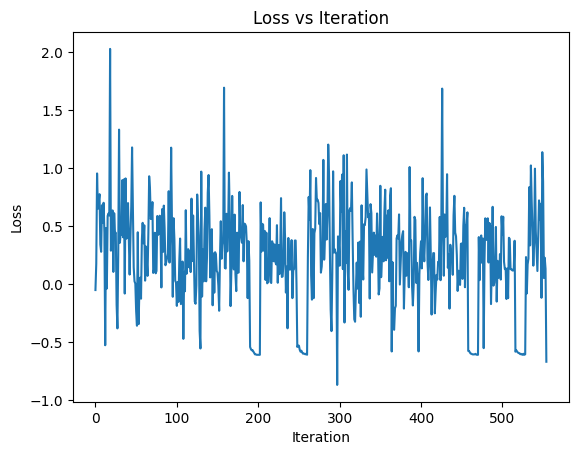


🌍 Training on env: Level 5, Seed 22 | 121 steps
log_probs_theta: -55.40625
log_probs_old: -55.375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -61.9375
log_probs_old: -61.78125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -36.125
log_probs_old: -36.03125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -46.3125
log_probs_old: -46.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -44.5625
log_probs_old: -44.59375
delta: 0.03125
kl:  0.0
log_probs_theta: -40.46875
log_probs_old: -40.34375
delta: -0.125
kl:  0.0078125
log_probs_theta: -39.125
log_probs_old: -38.96875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -43.3125
log_probs_old: -43.375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -33.53125
log_probs_old: -33.46875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -43.6875
log_probs_old: -43.5
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -42.6875
log_probs_old: -42.71875
delta: 0.03125
kl:  0.0
log_probs_theta: -32.9375
log_probs_old: -32.78125
del

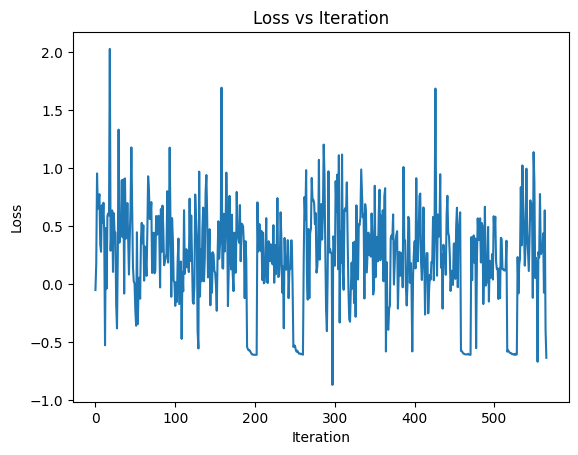


🌍 Training on env: Level 5, Seed 26 | 67 steps
log_probs_theta: -41.75
log_probs_old: -41.78125
delta: 0.03125
kl:  0.0
log_probs_theta: -34.625
log_probs_old: -34.6875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -37.25
log_probs_old: -37.15625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -26.640625
log_probs_old: -26.625
delta: -0.015625
kl:  0.0
log_probs_theta: -35.71875
log_probs_old: -35.5625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -45.625
log_probs_old: -45.71875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -46.9375
log_probs_old: -46.9375
delta: 0.0
kl:  0.0
log_probs_theta: -40.53125
log_probs_old: -40.46875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -39.21875
log_probs_old: -39.21875
delta: 0.0
kl:  0.0
log_probs_theta: -49.0625
log_probs_old: -48.9375
delta: -0.125
kl:  0.0078125
log_probs_theta: -31.734375
log_probs_old: -31.609375
delta: -0.125
kl:  0.0078125
log_probs_theta: -50.5625
log_probs_old: -50.5625
delta: 0.0
kl:  0.0
✅ Epoch 3 | Bat

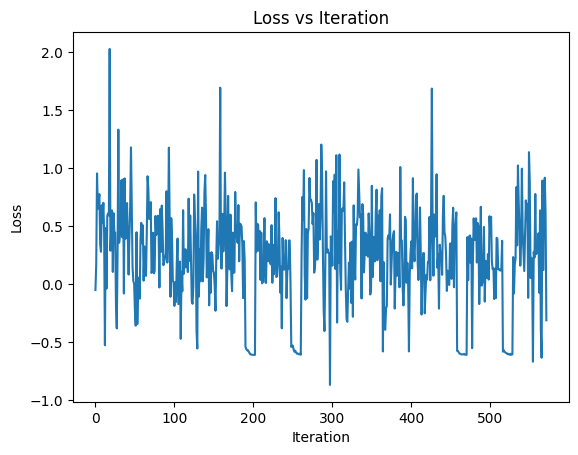


🌍 Training on env: Level 5, Seed 30 | 79 steps
log_probs_theta: -34.65625
log_probs_old: -34.65625
delta: 0.0
kl:  0.0
log_probs_theta: -39.34375
log_probs_old: -39.5
delta: 0.15625
kl:  0.01171875
log_probs_theta: -42.8125
log_probs_old: -42.78125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -58.3125
log_probs_old: -58.625
delta: 0.3125
kl:  0.0439453125
log_probs_theta: -16.015625
log_probs_old: -16.0625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -32.25
log_probs_old: -32.40625
delta: 0.15625
kl:  0.01171875
log_probs_theta: -28.453125
log_probs_old: -28.484375
delta: 0.03125
kl:  0.0
log_probs_theta: -43.46875
log_probs_old: -43.40625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -26.78125
log_probs_old: -26.828125
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -28.25
log_probs_old: -28.40625
delta: 0.15625
kl:  0.01171875
log_probs_theta: -33.40625
log_probs_old: -33.5
delta: 0.09375
kl:  0.00390625
log_probs_theta: -47.0
log_probs_old: -47.21875
delta: 0.2187

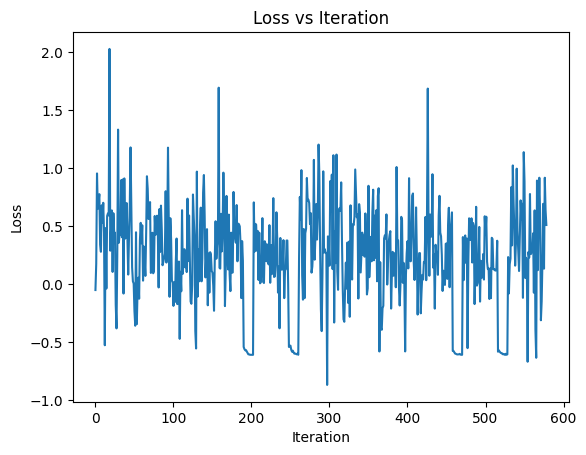


🌍 Training on env: Level 5, Seed 34 | 68 steps
log_probs_theta: -55.6875
log_probs_old: -55.53125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -31.734375
log_probs_old: -31.6875
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -33.0
log_probs_old: -32.96875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -51.8125
log_probs_old: -51.71875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -41.65625
log_probs_old: -41.5
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -33.59375
log_probs_old: -33.59375
delta: 0.0
kl:  0.0
log_probs_theta: -16.015625
log_probs_old: -15.9921875
delta: -0.0234375
kl:  0.0
log_probs_theta: -44.34375
log_probs_old: -44.21875
delta: -0.125
kl:  0.0078125
log_probs_theta: -34.3125
log_probs_old: -34.34375
delta: 0.03125
kl:  0.0
log_probs_theta: -28.71875
log_probs_old: -28.734375
delta: 0.015625
kl:  0.0
log_probs_theta: -31.0625
log_probs_old: -31.015625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -29.078125
log_probs_old: -29.109375
de

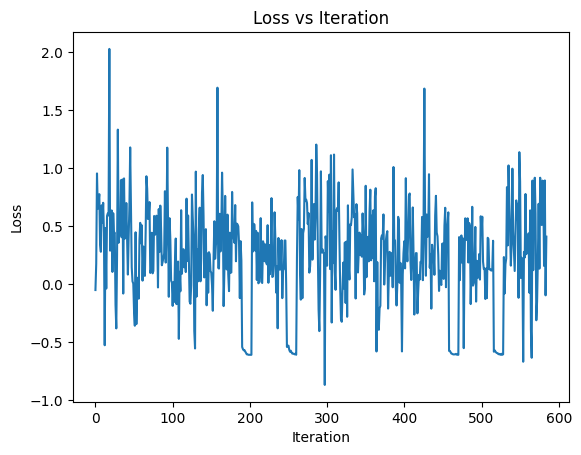


🌍 Training on env: Level 5, Seed 38 | 70 steps
log_probs_theta: -43.875
log_probs_old: -43.9375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -43.375
log_probs_old: -43.21875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -34.0625
log_probs_old: -33.96875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -40.625
log_probs_old: -40.6875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -35.09375
log_probs_old: -35.03125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -49.0625
log_probs_old: -49.25
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -29.59375
log_probs_old: -29.53125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -18.59375
log_probs_old: -18.609375
delta: 0.015625
kl:  0.0
log_probs_theta: -53.5
log_probs_old: -53.34375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -47.78125
log_probs_old: -47.625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -35.78125
log_probs_old: -35.75
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -37.1875
log_probs_old: -37.125

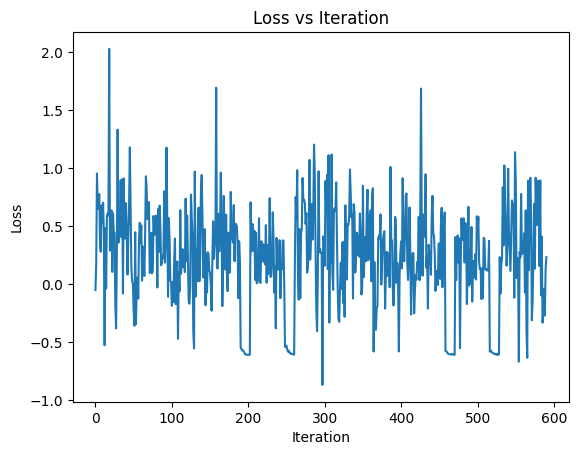


🌍 Training on env: Level 5, Seed 42 | 108 steps
log_probs_theta: -23.015625
log_probs_old: -22.96875
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -28.15625
log_probs_old: -28.1875
delta: 0.03125
kl:  0.0
log_probs_theta: -38.75
log_probs_old: -38.84375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -26.671875
log_probs_old: -26.625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -28.828125
log_probs_old: -28.890625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -35.9375
log_probs_old: -36.0625
delta: 0.125
kl:  0.0078125
log_probs_theta: -29.0625
log_probs_old: -28.9375
delta: -0.125
kl:  0.0078125
log_probs_theta: -35.5625
log_probs_old: -35.5625
delta: 0.0
kl:  0.0
log_probs_theta: -25.046875
log_probs_old: -25.046875
delta: 0.0
kl:  0.0
log_probs_theta: -32.84375
log_probs_old: -32.90625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -36.28125
log_probs_old: -36.3125
delta: 0.03125
kl:  0.0
log_probs_theta: -30.9375
log_probs_old: -30.9375
delta: 0.0
kl:  0.0
✅ Epoch 

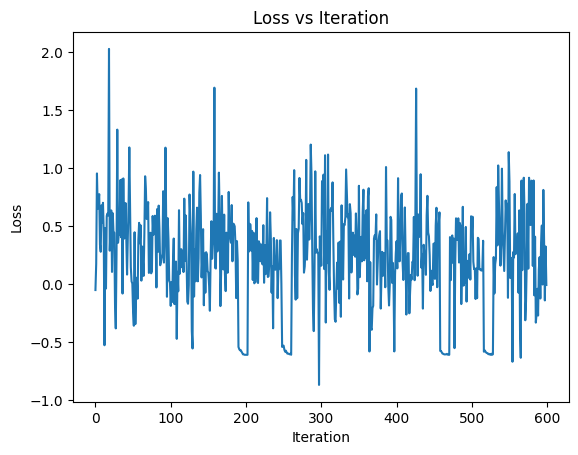


🌍 Training on env: Level 5, Seed 46 | 81 steps
log_probs_theta: -30.890625
log_probs_old: -30.953125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -29.140625
log_probs_old: -29.1875
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -38.6875
log_probs_old: -38.71875
delta: 0.03125
kl:  0.0
log_probs_theta: -32.15625
log_probs_old: -32.03125
delta: -0.125
kl:  0.0078125
log_probs_theta: -32.75
log_probs_old: -32.78125
delta: 0.03125
kl:  0.0
log_probs_theta: -53.5
log_probs_old: -53.40625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -25.96875
log_probs_old: -26.015625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -53.40625
log_probs_old: -53.28125
delta: -0.125
kl:  0.0078125
log_probs_theta: -59.5625
log_probs_old: -59.6875
delta: 0.125
kl:  0.0078125
log_probs_theta: -33.34375
log_probs_old: -33.46875
delta: 0.125
kl:  0.0078125
log_probs_theta: -32.5625
log_probs_old: -32.625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -38.875
log_probs_old: -38.90625
delta: 0.03125

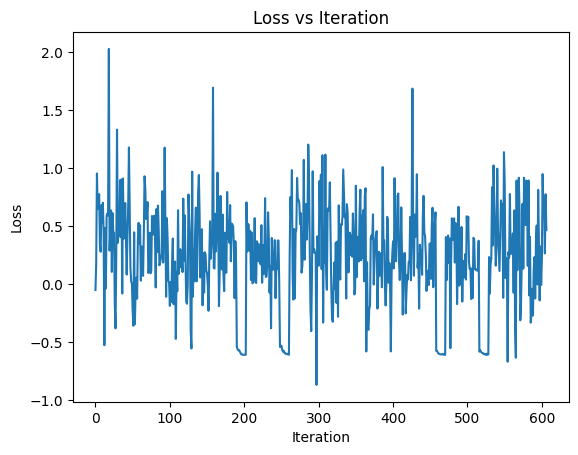


🌍 Training on env: Level 6, Seed 10 | 130 steps
log_probs_theta: -34.96875
log_probs_old: -34.9375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -35.375
log_probs_old: -35.28125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -42.9375
log_probs_old: -42.90625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -37.125
log_probs_old: -37.0
delta: -0.125
kl:  0.0078125
log_probs_theta: -39.03125
log_probs_old: -38.96875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -30.53125
log_probs_old: -30.453125
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -38.125
log_probs_old: -38.03125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -42.03125
log_probs_old: -42.0
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -29.375
log_probs_old: -29.34375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -33.25
log_probs_old: -33.0625
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -52.65625
log_probs_old: -52.4375
delta: -0.21875
kl:  0.025390625
log_probs_theta: -40.4375
log_probs

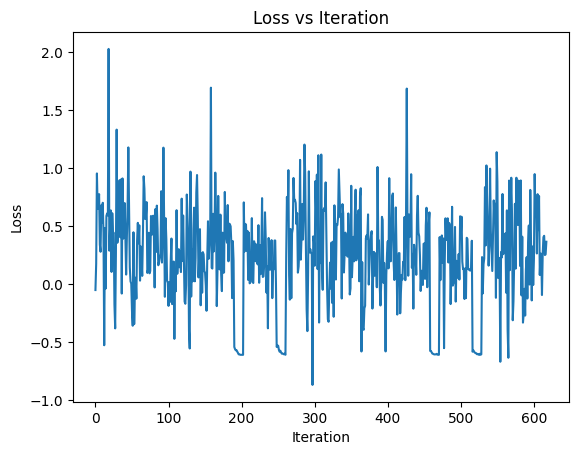


🌍 Training on env: Level 6, Seed 14 | 72 steps
log_probs_theta: -28.4375
log_probs_old: -28.46875
delta: 0.03125
kl:  0.0
log_probs_theta: -40.6875
log_probs_old: -40.625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -43.03125
log_probs_old: -42.96875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -45.96875
log_probs_old: -46.0
delta: 0.03125
kl:  0.0
log_probs_theta: -34.9375
log_probs_old: -34.96875
delta: 0.03125
kl:  0.0
log_probs_theta: -37.90625
log_probs_old: -37.875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -47.0
log_probs_old: -46.75
delta: -0.25
kl:  0.0341796875
log_probs_theta: -38.875
log_probs_old: -38.9375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -38.0
log_probs_old: -38.0
delta: 0.0
kl:  0.0
log_probs_theta: -43.0625
log_probs_old: -43.3125
delta: 0.25
kl:  0.029296875
log_probs_theta: -24.234375
log_probs_old: -24.140625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -40.34375
log_probs_old: -40.4375
delta: 0.09375
kl:  0.00390625
✅ Epoch 3 | 

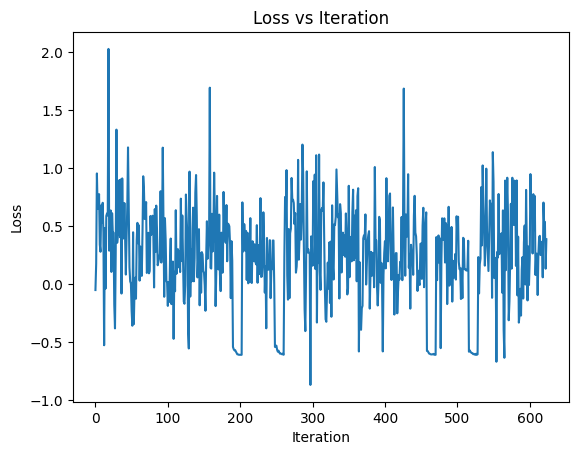


🌍 Training on env: Level 6, Seed 18 | 89 steps
log_probs_theta: -38.96875
log_probs_old: -38.9375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -34.5625
log_probs_old: -34.5625
delta: 0.0
kl:  0.0
log_probs_theta: -33.84375
log_probs_old: -33.78125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -30.546875
log_probs_old: -30.546875
delta: 0.0
kl:  0.0
log_probs_theta: -45.0625
log_probs_old: -45.0625
delta: 0.0
kl:  0.0
log_probs_theta: -57.71875
log_probs_old: -57.78125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -48.53125
log_probs_old: -48.34375
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -19.046875
log_probs_old: -19.140625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -20.671875
log_probs_old: -20.6875
delta: 0.015625
kl:  0.0
log_probs_theta: -49.8125
log_probs_old: -49.71875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -37.0
log_probs_old: -37.03125
delta: 0.03125
kl:  0.0
log_probs_theta: -25.578125
log_probs_old: -25.515625
delta: -0.0625
kl:  0.001953

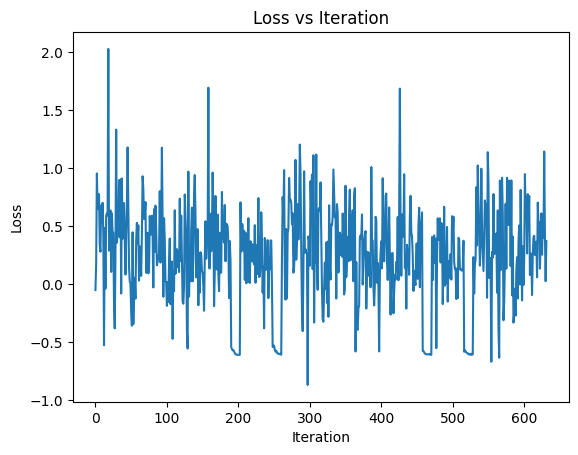


🌍 Training on env: Level 6, Seed 22 | 155 steps
log_probs_theta: -51.40625
log_probs_old: -51.3125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -31.0625
log_probs_old: -31.015625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -36.96875
log_probs_old: -36.84375
delta: -0.125
kl:  0.0078125
log_probs_theta: -53.96875
log_probs_old: -54.0
delta: 0.03125
kl:  0.0
log_probs_theta: -39.28125
log_probs_old: -39.21875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.0
log_probs_old: -33.90625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -54.9375
log_probs_old: -54.71875
delta: -0.21875
kl:  0.025390625
log_probs_theta: -35.40625
log_probs_old: -35.46875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -27.640625
log_probs_old: -27.625
delta: -0.015625
kl:  0.0
log_probs_theta: -51.5
log_probs_old: -51.75
delta: 0.25
kl:  0.029296875
log_probs_theta: -44.25
log_probs_old: -44.21875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -28.109375
log_probs_old: -28.078125
delta

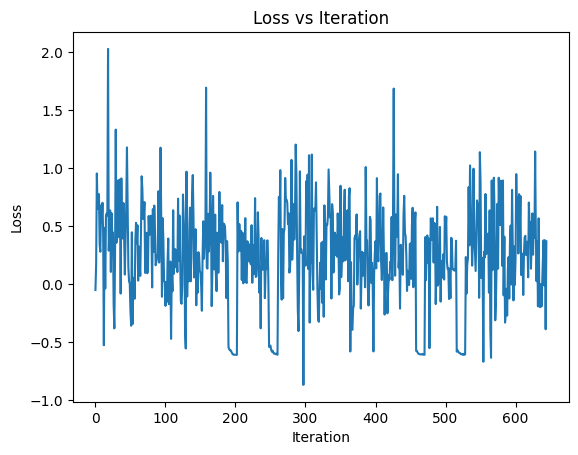


🌍 Training on env: Level 6, Seed 26 | 115 steps
log_probs_theta: -31.9375
log_probs_old: -31.859375
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -33.375
log_probs_old: -33.40625
delta: 0.03125
kl:  0.0
log_probs_theta: -32.03125
log_probs_old: -31.96875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -46.21875
log_probs_old: -46.125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -44.34375
log_probs_old: -44.28125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -33.6875
log_probs_old: -33.6875
delta: 0.0
kl:  0.0
log_probs_theta: -35.03125
log_probs_old: -35.0
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -27.0625
log_probs_old: -27.09375
delta: 0.03125
kl:  0.0
log_probs_theta: -37.5
log_probs_old: -37.40625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -29.234375
log_probs_old: -29.1875
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -41.125
log_probs_old: -40.96875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -37.3125
log_probs_old: -37.28125
delta: 

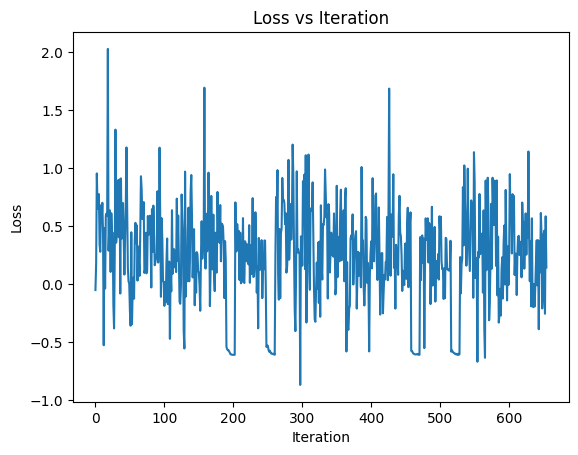


🌍 Training on env: Level 6, Seed 30 | 122 steps
log_probs_theta: -25.828125
log_probs_old: -25.78125
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -54.59375
log_probs_old: -54.6875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -32.03125
log_probs_old: -31.953125
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -20.859375
log_probs_old: -20.859375
delta: 0.0
kl:  0.0
log_probs_theta: -30.546875
log_probs_old: -30.609375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -44.53125
log_probs_old: -44.65625
delta: 0.125
kl:  0.0078125
log_probs_theta: -23.921875
log_probs_old: -23.875
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -31.1875
log_probs_old: -31.171875
delta: -0.015625
kl:  0.0
log_probs_theta: -39.1875
log_probs_old: -39.28125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -23.203125
log_probs_old: -23.265625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -34.09375
log_probs_old: -34.0
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -53.84375
log_probs_old:

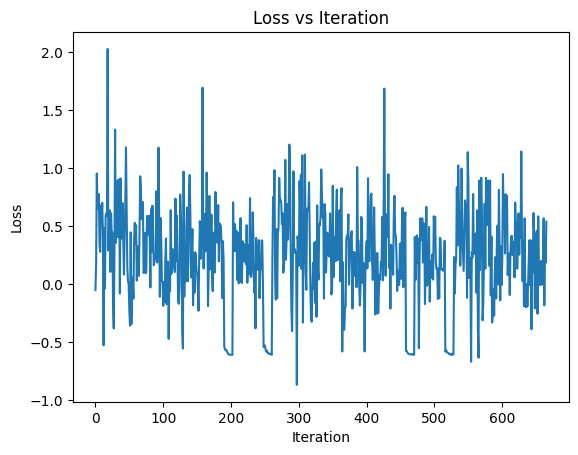


🌍 Training on env: Level 6, Seed 34 | 66 steps
log_probs_theta: -33.40625
log_probs_old: -33.4375
delta: 0.03125
kl:  0.0
log_probs_theta: -40.65625
log_probs_old: -40.78125
delta: 0.125
kl:  0.0078125
log_probs_theta: -31.375
log_probs_old: -31.4375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -20.453125
log_probs_old: -20.4375
delta: -0.015625
kl:  0.0
log_probs_theta: -26.140625
log_probs_old: -26.171875
delta: 0.03125
kl:  0.0
log_probs_theta: -29.796875
log_probs_old: -29.703125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -30.640625
log_probs_old: -30.578125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.5625
log_probs_old: -34.6875
delta: 0.125
kl:  0.0078125
log_probs_theta: -46.8125
log_probs_old: -46.6875
delta: -0.125
kl:  0.0078125
log_probs_theta: -35.03125
log_probs_old: -35.15625
delta: 0.125
kl:  0.0078125
log_probs_theta: -31.5625
log_probs_old: -31.546875
delta: -0.015625
kl:  0.0
log_probs_theta: -40.5
log_probs_old: -40.5
delta: 0.0
kl:  0.0
✅ Epoch 

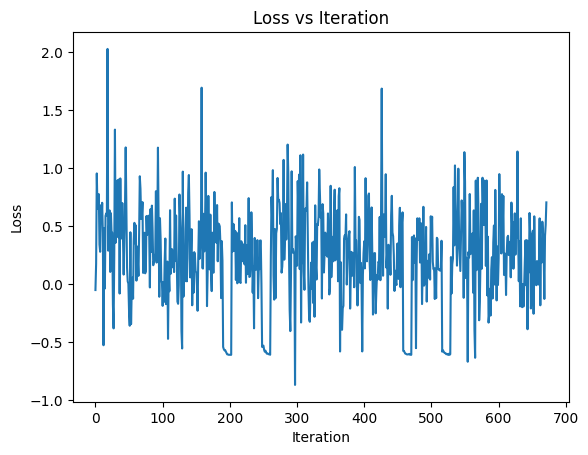


🌍 Training on env: Level 6, Seed 38 | 95 steps
log_probs_theta: -40.09375
log_probs_old: -40.15625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -34.28125
log_probs_old: -34.28125
delta: 0.0
kl:  0.0
log_probs_theta: -20.59375
log_probs_old: -20.6875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -45.59375
log_probs_old: -45.65625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -44.71875
log_probs_old: -44.75
delta: 0.03125
kl:  0.0
log_probs_theta: -41.71875
log_probs_old: -41.75
delta: 0.03125
kl:  0.0
log_probs_theta: -45.1875
log_probs_old: -45.25
delta: 0.0625
kl:  0.001953125
log_probs_theta: -37.90625
log_probs_old: -38.0
delta: 0.09375
kl:  0.00390625
log_probs_theta: -36.0
log_probs_old: -35.9375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -39.21875
log_probs_old: -39.25
delta: 0.03125
kl:  0.0
log_probs_theta: -28.03125
log_probs_old: -28.078125
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -53.15625
log_probs_old: -53.0625
delta: -0.09375
kl:  0.0048828125
✅ Ep

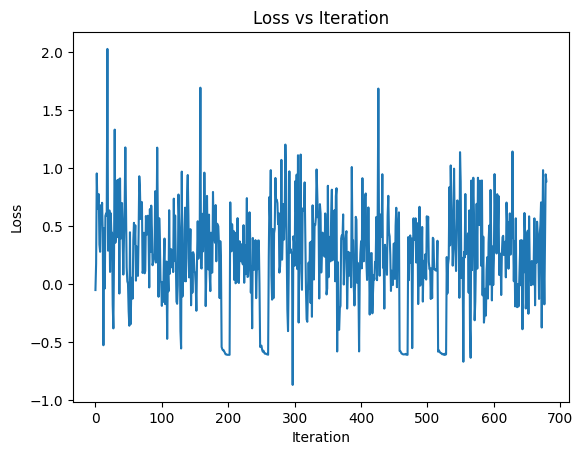


🌍 Training on env: Level 6, Seed 42 | 104 steps
log_probs_theta: -50.6875
log_probs_old: -50.65625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -35.8125
log_probs_old: -35.875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -40.8125
log_probs_old: -40.78125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -39.09375
log_probs_old: -39.25
delta: 0.15625
kl:  0.01171875
log_probs_theta: -15.1484375
log_probs_old: -15.1875
delta: 0.0390625
kl:  0.0009765625
log_probs_theta: -58.15625
log_probs_old: -58.0625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -30.140625
log_probs_old: -30.234375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -32.1875
log_probs_old: -32.15625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -43.71875
log_probs_old: -43.4375
delta: -0.28125
kl:  0.0439453125
log_probs_theta: -29.4375
log_probs_old: -29.375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -65.375
log_probs_old: -65.1875
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -32.40625
log

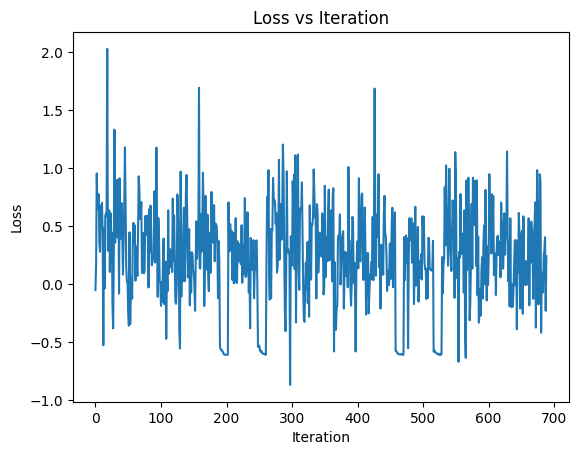


🌍 Training on env: Level 6, Seed 46 | 61 steps
log_probs_theta: -36.6875
log_probs_old: -36.5625
delta: -0.125
kl:  0.0078125
log_probs_theta: -20.96875
log_probs_old: -20.90625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.5625
log_probs_old: -40.5
delta: -0.0625
kl:  0.001953125
log_probs_theta: -30.984375
log_probs_old: -30.796875
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -40.6875
log_probs_old: -40.46875
delta: -0.21875
kl:  0.025390625
log_probs_theta: -39.25
log_probs_old: -39.09375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -33.4375
log_probs_old: -33.40625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -70.0
log_probs_old: -69.6875
delta: -0.3125
kl:  0.0546875
log_probs_theta: -20.953125
log_probs_old: -20.78125
delta: -0.171875
kl:  0.015625
log_probs_theta: -25.296875
log_probs_old: -25.1875
delta: -0.109375
kl:  0.005859375
log_probs_theta: -18.375
log_probs_old: -18.40625
delta: 0.03125
kl:  0.0
log_probs_theta: -42.4375
log_probs_old: -42.4375


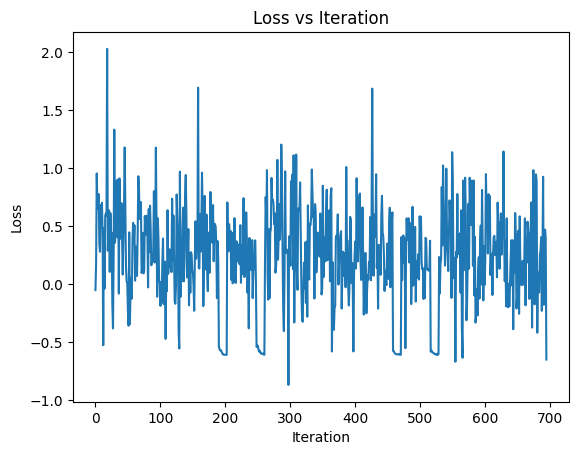


🌍 Training on env: Level 7, Seed 10 | 112 steps
log_probs_theta: -35.53125
log_probs_old: -35.375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -36.84375
log_probs_old: -36.65625
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -47.65625
log_probs_old: -47.8125
delta: 0.15625
kl:  0.01171875
log_probs_theta: -21.984375
log_probs_old: -22.015625
delta: 0.03125
kl:  0.0
log_probs_theta: -36.4375
log_probs_old: -36.4375
delta: 0.0
kl:  0.0
log_probs_theta: -36.9375
log_probs_old: -37.0
delta: 0.0625
kl:  0.001953125
log_probs_theta: -38.375
log_probs_old: -38.28125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -29.578125
log_probs_old: -29.640625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -29.125
log_probs_old: -29.203125
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -22.671875
log_probs_old: -22.703125
delta: 0.03125
kl:  0.0
log_probs_theta: -28.234375
log_probs_old: -28.359375
delta: 0.125
kl:  0.0078125
log_probs_theta: -36.46875
log_probs_old: -36.5
delta: 0.031

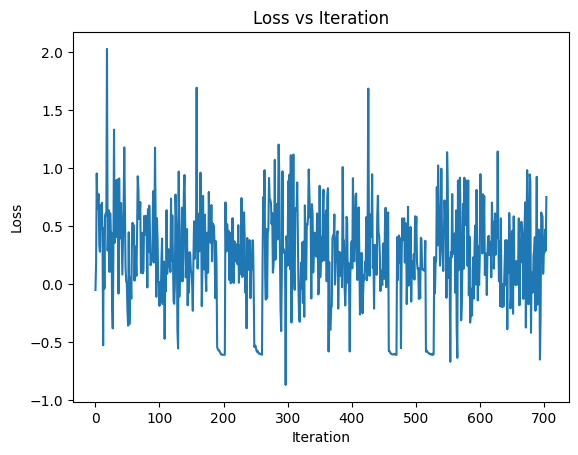


🌍 Training on env: Level 7, Seed 14 | 131 steps
log_probs_theta: -36.875
log_probs_old: -36.90625
delta: 0.03125
kl:  0.0
log_probs_theta: -33.5625
log_probs_old: -33.46875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -49.625
log_probs_old: -49.78125
delta: 0.15625
kl:  0.01171875
log_probs_theta: -39.90625
log_probs_old: -39.75
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -43.28125
log_probs_old: -43.25
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -27.609375
log_probs_old: -27.546875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -35.90625
log_probs_old: -35.96875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -41.90625
log_probs_old: -42.0625
delta: 0.15625
kl:  0.01171875
log_probs_theta: -41.34375
log_probs_old: -41.46875
delta: 0.125
kl:  0.0078125
log_probs_theta: -40.71875
log_probs_old: -40.71875
delta: 0.0
kl:  0.0
log_probs_theta: -39.4375
log_probs_old: -39.5
delta: 0.0625
kl:  0.001953125
log_probs_theta: -50.59375
log_probs_old: -50.6875
delta: 0.0937

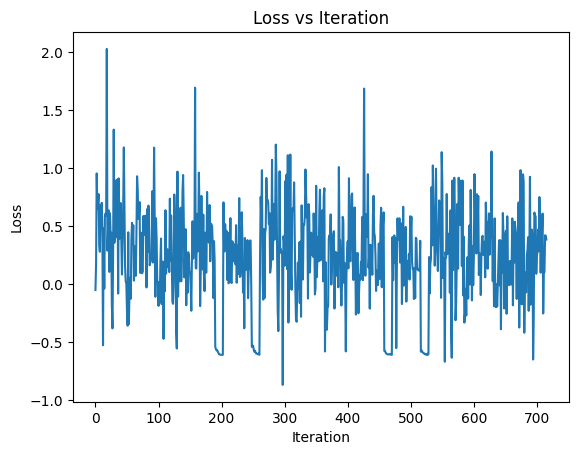


🌍 Training on env: Level 7, Seed 18 | 118 steps
log_probs_theta: -58.46875
log_probs_old: -58.53125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -41.28125
log_probs_old: -41.09375
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -39.125
log_probs_old: -39.15625
delta: 0.03125
kl:  0.0
log_probs_theta: -40.59375
log_probs_old: -40.4375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -28.703125
log_probs_old: -28.59375
delta: -0.109375
kl:  0.005859375
log_probs_theta: -22.671875
log_probs_old: -22.671875
delta: 0.0
kl:  0.0
log_probs_theta: -27.953125
log_probs_old: -27.90625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -35.78125
log_probs_old: -35.84375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -34.84375
log_probs_old: -34.75
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -41.96875
log_probs_old: -41.78125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -49.9375
log_probs_old: -49.84375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -41.40625
log_probs_ol

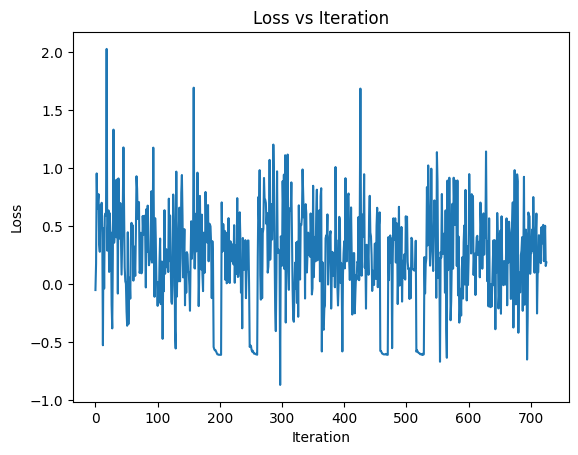


🌍 Training on env: Level 7, Seed 22 | 147 steps
log_probs_theta: -35.71875
log_probs_old: -35.75
delta: 0.03125
kl:  0.0
log_probs_theta: -52.0625
log_probs_old: -52.0625
delta: 0.0
kl:  0.0
log_probs_theta: -34.21875
log_probs_old: -34.21875
delta: 0.0
kl:  0.0
log_probs_theta: -37.375
log_probs_old: -37.46875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -46.9375
log_probs_old: -46.78125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -36.78125
log_probs_old: -36.59375
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -40.125
log_probs_old: -40.09375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -41.9375
log_probs_old: -41.9375
delta: 0.0
kl:  0.0
log_probs_theta: -80.0
log_probs_old: -79.9375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -48.65625
log_probs_old: -48.6875
delta: 0.03125
kl:  0.0
log_probs_theta: -36.1875
log_probs_old: -36.1875
delta: 0.0
kl:  0.0
log_probs_theta: -23.59375
log_probs_old: -23.453125
delta: -0.140625
kl:  0.0107421875
✅ Epoch 3 | Batch [

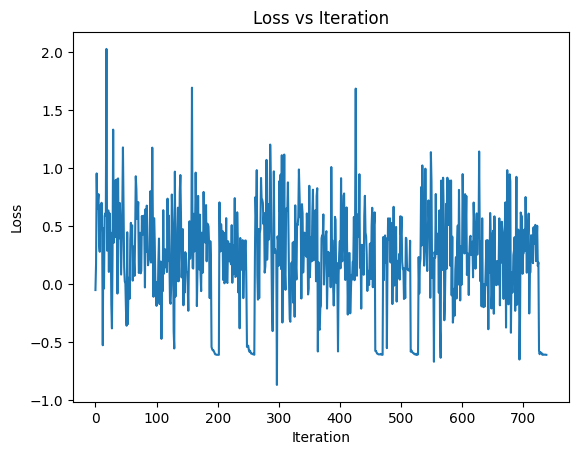


🌍 Training on env: Level 7, Seed 26 | 139 steps
log_probs_theta: -30.1875
log_probs_old: -30.25
delta: 0.0625
kl:  0.001953125
log_probs_theta: -37.0
log_probs_old: -37.0625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -28.921875
log_probs_old: -28.859375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -45.625
log_probs_old: -45.625
delta: 0.0
kl:  0.0
log_probs_theta: -32.5625
log_probs_old: -32.53125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -35.09375
log_probs_old: -35.125
delta: 0.03125
kl:  0.0
log_probs_theta: -23.21875
log_probs_old: -23.359375
delta: 0.140625
kl:  0.009765625
log_probs_theta: -27.28125
log_probs_old: -27.328125
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -32.8125
log_probs_old: -32.875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -29.28125
log_probs_old: -29.375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -33.21875
log_probs_old: -33.25
delta: 0.03125
kl:  0.0
log_probs_theta: -32.875
log_probs_old: -32.96875
delta: 0.09375
kl:  0.00

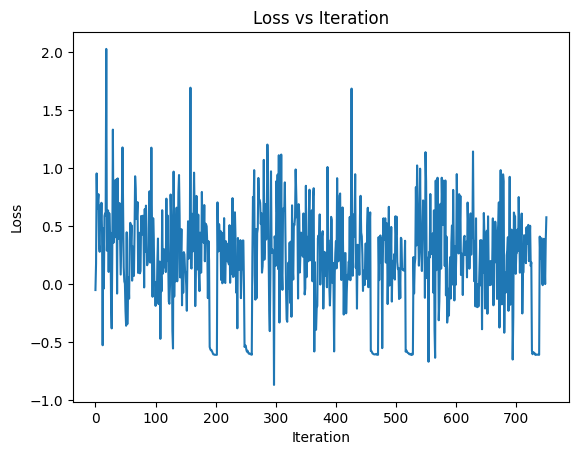


🌍 Training on env: Level 7, Seed 30 | 132 steps
log_probs_theta: -29.5
log_probs_old: -29.546875
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -40.3125
log_probs_old: -40.34375
delta: 0.03125
kl:  0.0
log_probs_theta: -30.015625
log_probs_old: -29.953125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -28.484375
log_probs_old: -28.625
delta: 0.140625
kl:  0.009765625
log_probs_theta: -25.296875
log_probs_old: -25.296875
delta: 0.0
kl:  0.0
log_probs_theta: -56.8125
log_probs_old: -57.03125
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -32.40625
log_probs_old: -32.4375
delta: 0.03125
kl:  0.0
log_probs_theta: -52.0
log_probs_old: -52.0625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -34.84375
log_probs_old: -34.84375
delta: 0.0
kl:  0.0
log_probs_theta: -41.15625
log_probs_old: -41.09375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -44.5625
log_probs_old: -44.59375
delta: 0.03125
kl:  0.0
log_probs_theta: -21.796875
log_probs_old: -21.75
delta: -0.046875
kl:  0.0009765

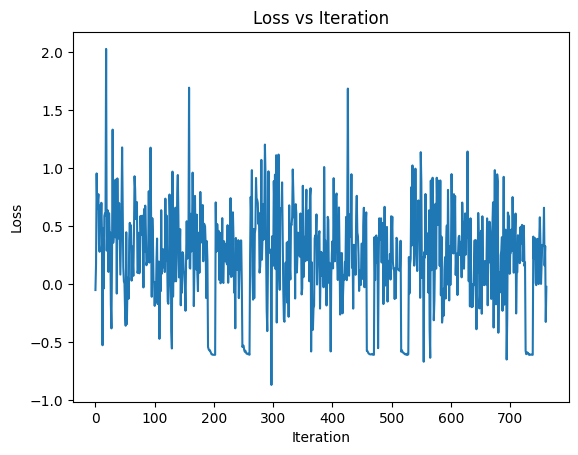


🌍 Training on env: Level 7, Seed 34 | 106 steps
log_probs_theta: -51.3125
log_probs_old: -51.21875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -56.53125
log_probs_old: -56.46875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -32.59375
log_probs_old: -32.53125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -39.46875
log_probs_old: -39.46875
delta: 0.0
kl:  0.0
log_probs_theta: -40.6875
log_probs_old: -40.65625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -31.59375
log_probs_old: -31.328125
delta: -0.265625
kl:  0.0390625
log_probs_theta: -26.5625
log_probs_old: -26.421875
delta: -0.140625
kl:  0.0107421875
log_probs_theta: -34.375
log_probs_old: -34.3125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -32.65625
log_probs_old: -32.59375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -35.09375
log_probs_old: -35.0
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -47.9375
log_probs_old: -48.03125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -77.0
log_probs_old: -7

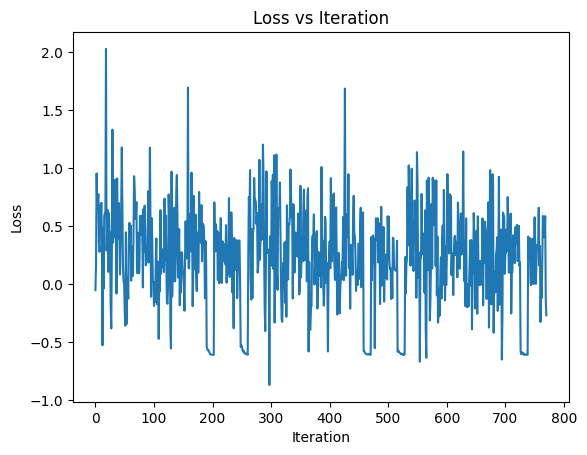


🌍 Training on env: Level 7, Seed 38 | 152 steps
log_probs_theta: -41.90625
log_probs_old: -41.84375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -33.5625
log_probs_old: -33.3125
delta: -0.25
kl:  0.0341796875
log_probs_theta: -30.984375
log_probs_old: -30.59375
delta: -0.390625
kl:  0.0869140625
log_probs_theta: -63.09375
log_probs_old: -63.0
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -43.125
log_probs_old: -42.96875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -36.1875
log_probs_old: -36.0625
delta: -0.125
kl:  0.0078125
log_probs_theta: -32.9375
log_probs_old: -32.9375
delta: 0.0
kl:  0.0
log_probs_theta: -43.8125
log_probs_old: -43.84375
delta: 0.03125
kl:  0.0
log_probs_theta: -35.375
log_probs_old: -35.3125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -50.59375
log_probs_old: -50.53125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -24.796875
log_probs_old: -24.71875
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -38.53125
log_probs_old: -38.375
delta

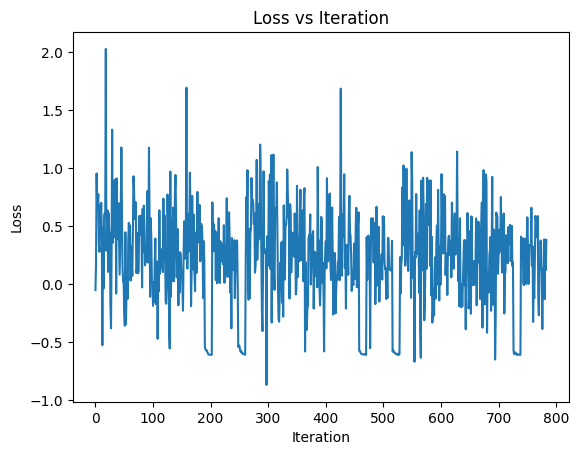


🌍 Training on env: Level 7, Seed 42 | 151 steps
log_probs_theta: -26.578125
log_probs_old: -26.484375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -18.5625
log_probs_old: -18.578125
delta: 0.015625
kl:  0.0
log_probs_theta: -52.15625
log_probs_old: -52.1875
delta: 0.03125
kl:  0.0
log_probs_theta: -48.21875
log_probs_old: -48.4375
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -33.625
log_probs_old: -33.65625
delta: 0.03125
kl:  0.0
log_probs_theta: -35.375
log_probs_old: -35.46875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -52.53125
log_probs_old: -52.59375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -43.78125
log_probs_old: -43.78125
delta: 0.0
kl:  0.0
log_probs_theta: -49.0
log_probs_old: -49.125
delta: 0.125
kl:  0.0078125
log_probs_theta: -37.28125
log_probs_old: -37.28125
delta: 0.0
kl:  0.0
log_probs_theta: -31.40625
log_probs_old: -31.515625
delta: 0.109375
kl:  0.005859375
log_probs_theta: -29.421875
log_probs_old: -29.53125
delta: 0.109375
kl:  0.005859375

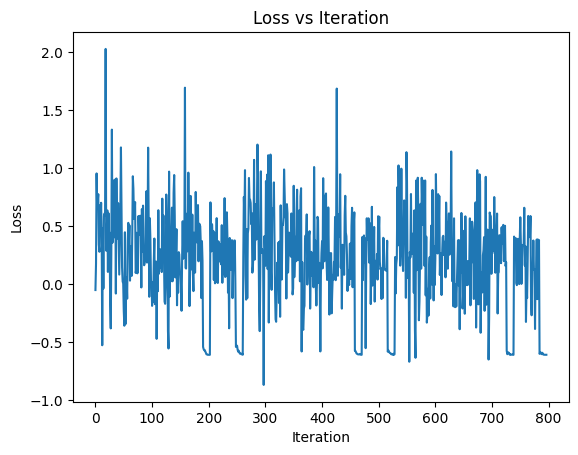


🌍 Training on env: Level 7, Seed 46 | 79 steps
log_probs_theta: -32.53125
log_probs_old: -32.625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -42.34375
log_probs_old: -42.25
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -28.4375
log_probs_old: -28.40625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -35.53125
log_probs_old: -35.53125
delta: 0.0
kl:  0.0
log_probs_theta: -35.375
log_probs_old: -35.375
delta: 0.0
kl:  0.0
log_probs_theta: -36.90625
log_probs_old: -37.0
delta: 0.09375
kl:  0.00390625
log_probs_theta: -39.0625
log_probs_old: -39.0
delta: -0.0625
kl:  0.001953125
log_probs_theta: -35.875
log_probs_old: -35.96875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -45.84375
log_probs_old: -45.84375
delta: 0.0
kl:  0.0
log_probs_theta: -40.0625
log_probs_old: -40.125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -32.5
log_probs_old: -32.59375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -34.6875
log_probs_old: -34.71875
delta: 0.03125
kl:  0.0
✅ Epoch 3 | Batch 

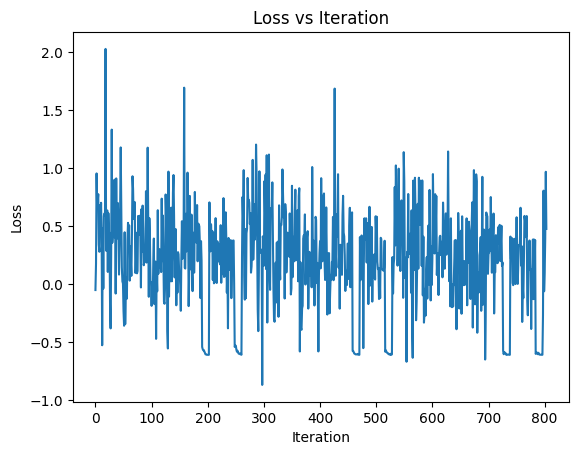


🌟 Epoch 4

🌍 Training on env: Level 5, Seed 10 | 71 steps
log_probs_theta: -34.0625
log_probs_old: -34.0
delta: -0.0625
kl:  0.001953125
log_probs_theta: -52.8125
log_probs_old: -52.59375
delta: -0.21875
kl:  0.025390625
log_probs_theta: -34.0
log_probs_old: -34.125
delta: 0.125
kl:  0.0078125
log_probs_theta: -34.90625
log_probs_old: -35.0
delta: 0.09375
kl:  0.00390625
log_probs_theta: -54.65625
log_probs_old: -54.75
delta: 0.09375
kl:  0.00390625
log_probs_theta: -30.859375
log_probs_old: -30.78125
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -33.75
log_probs_old: -33.71875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -29.25
log_probs_old: -29.21875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -32.28125
log_probs_old: -32.1875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -39.21875
log_probs_old: -39.1875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -18.6875
log_probs_old: -18.671875
delta: -0.015625
kl:  0.0
log_probs_theta: -32.84375
log_probs_old: -

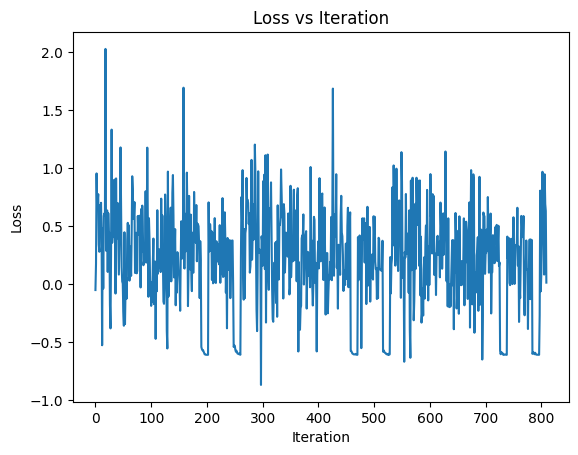


🌍 Training on env: Level 5, Seed 14 | 76 steps
log_probs_theta: -58.5625
log_probs_old: -58.59375
delta: 0.03125
kl:  0.0
log_probs_theta: -34.5
log_probs_old: -34.625
delta: 0.125
kl:  0.0078125
log_probs_theta: -34.03125
log_probs_old: -34.0625
delta: 0.03125
kl:  0.0
log_probs_theta: -33.3125
log_probs_old: -33.34375
delta: 0.03125
kl:  0.0
log_probs_theta: -41.0625
log_probs_old: -41.15625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -33.4375
log_probs_old: -33.4375
delta: 0.0
kl:  0.0
log_probs_theta: -48.40625
log_probs_old: -48.5
delta: 0.09375
kl:  0.00390625
log_probs_theta: -39.21875
log_probs_old: -39.15625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -31.75
log_probs_old: -31.890625
delta: 0.140625
kl:  0.009765625
log_probs_theta: -42.90625
log_probs_old: -42.875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -38.5
log_probs_old: -38.6875
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -18.671875
log_probs_old: -18.71875
delta: 0.046875
kl:  0.0009765625
✅ Epo

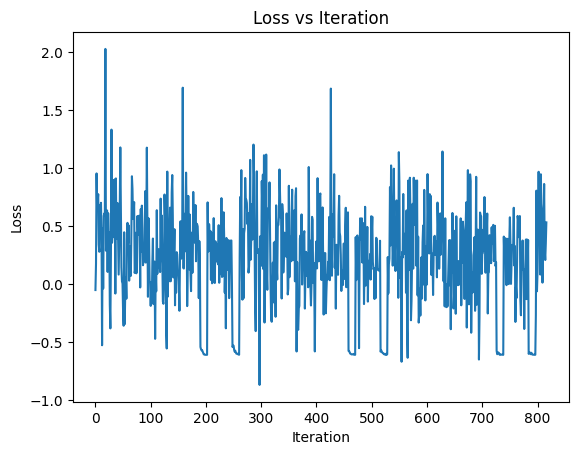


🌍 Training on env: Level 5, Seed 18 | 61 steps
log_probs_theta: -29.078125
log_probs_old: -29.015625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -32.59375
log_probs_old: -32.5
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -18.75
log_probs_old: -18.75
delta: 0.0
kl:  0.0
log_probs_theta: -16.40625
log_probs_old: -16.34375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -28.78125
log_probs_old: -28.8125
delta: 0.03125
kl:  0.0
log_probs_theta: -40.15625
log_probs_old: -40.09375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -27.03125
log_probs_old: -27.046875
delta: 0.015625
kl:  0.0
log_probs_theta: -29.09375
log_probs_old: -29.171875
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -59.3125
log_probs_old: -59.34375
delta: 0.03125
kl:  0.0
log_probs_theta: -48.59375
log_probs_old: -48.65625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -25.890625
log_probs_old: -25.78125
delta: -0.109375
kl:  0.005859375
log_probs_theta: -45.0
log_probs_old: -44.90625
delta: -0.09375
k

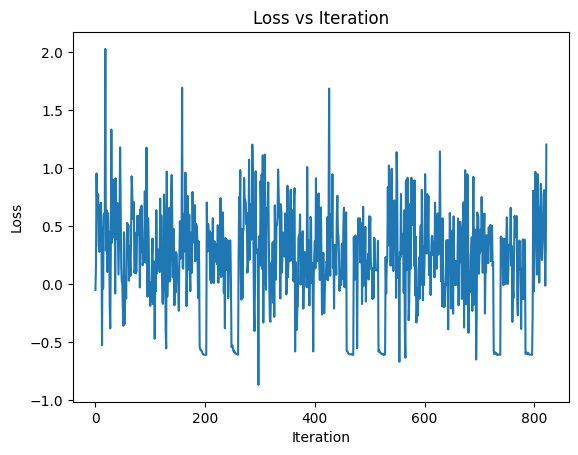


🌍 Training on env: Level 5, Seed 22 | 121 steps
log_probs_theta: -37.15625
log_probs_old: -37.0
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -47.0625
log_probs_old: -47.0
delta: -0.0625
kl:  0.001953125
log_probs_theta: -38.5625
log_probs_old: -38.34375
delta: -0.21875
kl:  0.025390625
log_probs_theta: -24.28125
log_probs_old: -24.3125
delta: 0.03125
kl:  0.0
log_probs_theta: -47.5625
log_probs_old: -47.5
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.625
log_probs_old: -40.53125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -34.3125
log_probs_old: -34.15625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -32.40625
log_probs_old: -32.28125
delta: -0.125
kl:  0.0078125
log_probs_theta: -61.96875
log_probs_old: -61.78125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -50.21875
log_probs_old: -50.0625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -53.0
log_probs_old: -52.75
delta: -0.25
kl:  0.0341796875
log_probs_theta: -44.71875
log_probs_old: -44.5625
delta

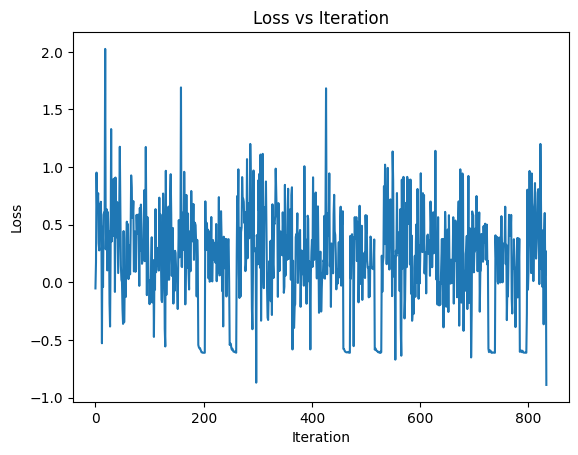


🌍 Training on env: Level 5, Seed 26 | 67 steps
log_probs_theta: -23.09375
log_probs_old: -23.140625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -49.0625
log_probs_old: -48.9375
delta: -0.125
kl:  0.0078125
log_probs_theta: -29.734375
log_probs_old: -29.78125
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -37.78125
log_probs_old: -37.875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -43.03125
log_probs_old: -43.09375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -43.4375
log_probs_old: -43.34375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -32.78125
log_probs_old: -32.8125
delta: 0.03125
kl:  0.0
log_probs_theta: -39.375
log_probs_old: -39.21875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -40.53125
log_probs_old: -40.46875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -35.71875
log_probs_old: -35.5625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -26.625
log_probs_old: -26.625
delta: 0.0
kl:  0.0
log_probs_theta: -41.5625
log_probs_old: -41.46875
del

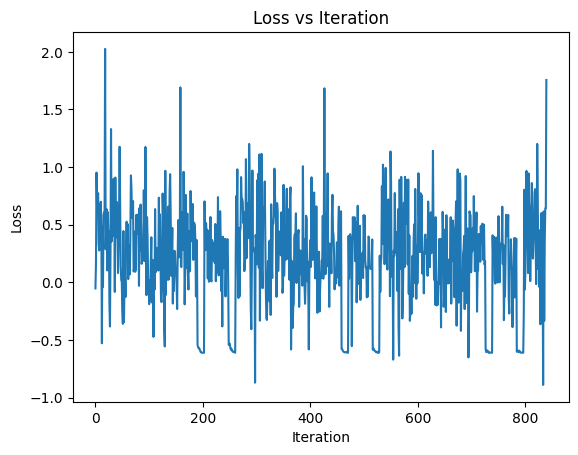


🌍 Training on env: Level 5, Seed 30 | 79 steps
log_probs_theta: -39.34375
log_probs_old: -39.375
delta: 0.03125
kl:  0.0
log_probs_theta: -71.3125
log_probs_old: -71.375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -49.5625
log_probs_old: -49.375
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -31.390625
log_probs_old: -31.34375
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -51.9375
log_probs_old: -52.03125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -53.875
log_probs_old: -53.875
delta: 0.0
kl:  0.0
log_probs_theta: -26.625
log_probs_old: -26.609375
delta: -0.015625
kl:  0.0
log_probs_theta: -37.53125
log_probs_old: -37.625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -34.65625
log_probs_old: -34.65625
delta: 0.0
kl:  0.0
log_probs_theta: -18.0
log_probs_old: -18.0625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -33.28125
log_probs_old: -33.28125
delta: 0.0
kl:  0.0
log_probs_theta: -55.96875
log_probs_old: -55.96875
delta: 0.0
kl:  0.0
✅ Epoch 4 | Batch [0-11] |

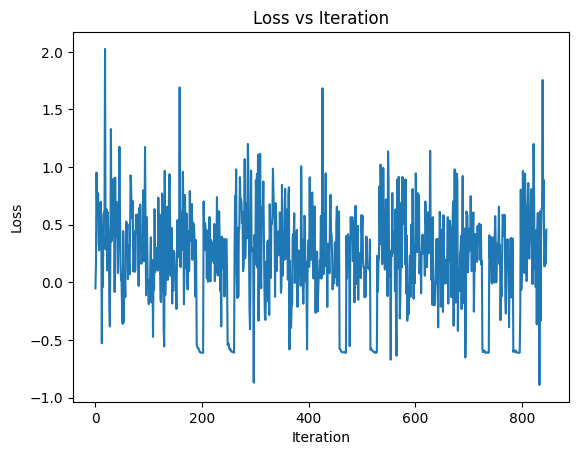


🌍 Training on env: Level 5, Seed 34 | 68 steps
log_probs_theta: -29.796875
log_probs_old: -29.8125
delta: 0.015625
kl:  0.0
log_probs_theta: -43.71875
log_probs_old: -43.71875
delta: 0.0
kl:  0.0
log_probs_theta: -33.90625
log_probs_old: -33.9375
delta: 0.03125
kl:  0.0
log_probs_theta: -55.84375
log_probs_old: -56.0625
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -35.75
log_probs_old: -35.75
delta: 0.0
kl:  0.0
log_probs_theta: -29.078125
log_probs_old: -29.109375
delta: 0.03125
kl:  0.0
log_probs_theta: -43.1875
log_probs_old: -43.1875
delta: 0.0
kl:  0.0
log_probs_theta: -39.1875
log_probs_old: -39.25
delta: 0.0625
kl:  0.001953125
log_probs_theta: -59.34375
log_probs_old: -59.28125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -38.6875
log_probs_old: -38.65625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -39.75
log_probs_old: -39.78125
delta: 0.03125
kl:  0.0
log_probs_theta: -36.71875
log_probs_old: -36.75
delta: 0.03125
kl:  0.0
✅ Epoch 4 | Batch [0-11] | Loss: 0.6

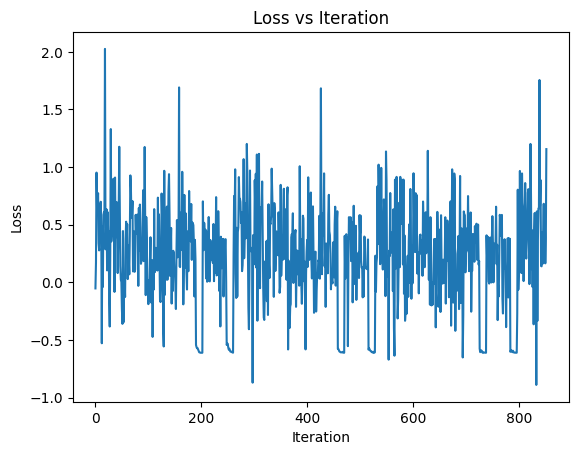


🌍 Training on env: Level 5, Seed 38 | 70 steps
log_probs_theta: -51.75
log_probs_old: -51.5625
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -29.5625
log_probs_old: -29.53125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -36.59375
log_probs_old: -36.53125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -41.03125
log_probs_old: -41.03125
delta: 0.0
kl:  0.0
log_probs_theta: -23.390625
log_probs_old: -23.40625
delta: 0.015625
kl:  0.0
log_probs_theta: -47.84375
log_probs_old: -47.625
delta: -0.21875
kl:  0.025390625
log_probs_theta: -35.8125
log_probs_old: -35.75
delta: -0.0625
kl:  0.001953125
log_probs_theta: -44.71875
log_probs_old: -44.75
delta: 0.03125
kl:  0.0
log_probs_theta: -32.34375
log_probs_old: -32.28125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -49.125
log_probs_old: -49.25
delta: 0.125
kl:  0.0078125
log_probs_theta: -26.875
log_probs_old: -26.75
delta: -0.125
kl:  0.0078125
log_probs_theta: -73.375
log_probs_old: -73.125
delta: -0.25
kl:  0.0341796875
✅ 

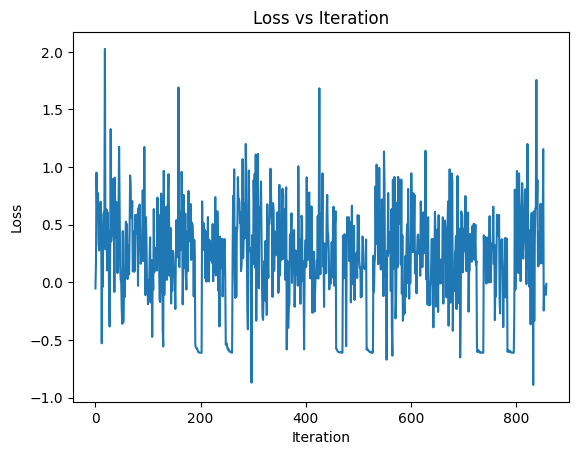


🌍 Training on env: Level 5, Seed 42 | 108 steps
log_probs_theta: -32.40625
log_probs_old: -32.34375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -36.03125
log_probs_old: -36.0625
delta: 0.03125
kl:  0.0
log_probs_theta: -44.9375
log_probs_old: -44.96875
delta: 0.03125
kl:  0.0
log_probs_theta: -30.921875
log_probs_old: -30.9375
delta: 0.015625
kl:  0.0
log_probs_theta: -30.96875
log_probs_old: -30.859375
delta: -0.109375
kl:  0.005859375
log_probs_theta: -40.6875
log_probs_old: -40.53125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -27.6875
log_probs_old: -27.734375
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -86.75
log_probs_old: -86.75
delta: 0.0
kl:  0.0
log_probs_theta: -25.0625
log_probs_old: -25.046875
delta: -0.015625
kl:  0.0
log_probs_theta: -45.75
log_probs_old: -45.59375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -48.40625
log_probs_old: -48.3125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -33.59375
log_probs_old: -33.53125
delta: -0.0625
kl:

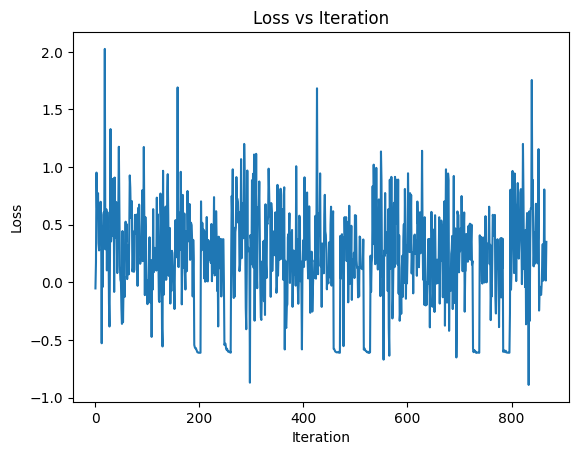


🌍 Training on env: Level 5, Seed 46 | 81 steps
log_probs_theta: -31.59375
log_probs_old: -31.671875
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -45.25
log_probs_old: -45.09375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -50.75
log_probs_old: -50.78125
delta: 0.03125
kl:  0.0
log_probs_theta: -34.65625
log_probs_old: -34.65625
delta: 0.0
kl:  0.0
log_probs_theta: -45.625
log_probs_old: -45.71875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -35.0625
log_probs_old: -35.0625
delta: 0.0
kl:  0.0
log_probs_theta: -47.875
log_probs_old: -47.875
delta: 0.0
kl:  0.0
log_probs_theta: -35.0625
log_probs_old: -35.03125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -30.890625
log_probs_old: -30.953125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -27.0
log_probs_old: -27.0625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -25.953125
log_probs_old: -26.015625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -28.9375
log_probs_old: -28.953125
delta: 0.015625
kl:  0.0
✅ Epoch 

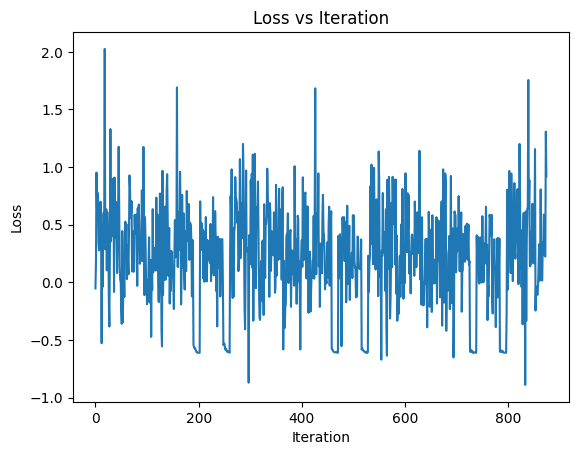


🌍 Training on env: Level 6, Seed 10 | 130 steps
log_probs_theta: -44.5
log_probs_old: -44.3125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -34.40625
log_probs_old: -34.34375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -38.90625
log_probs_old: -38.96875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -27.046875
log_probs_old: -27.0
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -28.359375
log_probs_old: -28.28125
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -40.875
log_probs_old: -40.65625
delta: -0.21875
kl:  0.025390625
log_probs_theta: -39.0
log_probs_old: -39.09375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -49.0
log_probs_old: -48.875
delta: -0.125
kl:  0.0078125
log_probs_theta: -31.40625
log_probs_old: -31.34375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -35.1875
log_probs_old: -35.15625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -25.9375
log_probs_old: -25.921875
delta: -0.015625
kl:  0.0
log_probs_theta: -38.0
log_probs_old: -37.8125
d

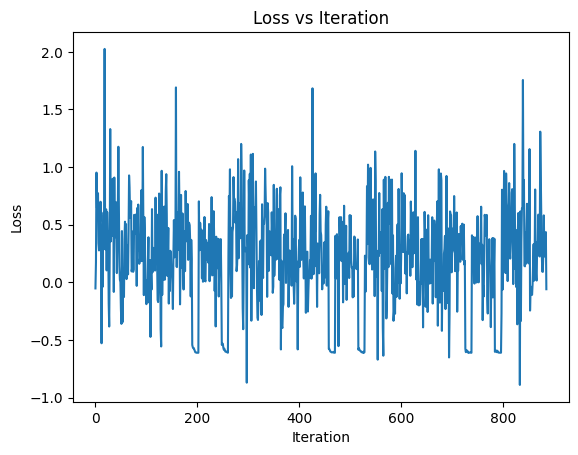


🌍 Training on env: Level 6, Seed 14 | 72 steps
log_probs_theta: -17.59375
log_probs_old: -17.640625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -31.375
log_probs_old: -31.390625
delta: 0.015625
kl:  0.0
log_probs_theta: -45.9375
log_probs_old: -46.0
delta: 0.0625
kl:  0.001953125
log_probs_theta: -31.34375
log_probs_old: -31.265625
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -46.96875
log_probs_old: -46.75
delta: -0.21875
kl:  0.025390625
log_probs_theta: -40.34375
log_probs_old: -40.4375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -28.421875
log_probs_old: -28.46875
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -69.3125
log_probs_old: -69.25
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.90625
log_probs_old: -34.96875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -27.03125
log_probs_old: -27.09375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -29.0625
log_probs_old: -29.078125
delta: 0.015625
kl:  0.0
log_probs_theta: -15.3515625
log_probs_old: -15.3

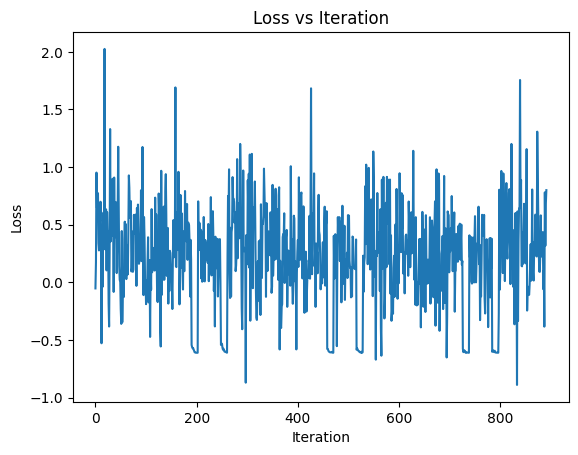


🌍 Training on env: Level 6, Seed 18 | 89 steps
log_probs_theta: -35.53125
log_probs_old: -35.65625
delta: 0.125
kl:  0.0078125
log_probs_theta: -38.875
log_probs_old: -38.96875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -33.25
log_probs_old: -33.28125
delta: 0.03125
kl:  0.0
log_probs_theta: -36.28125
log_probs_old: -36.34375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -38.84375
log_probs_old: -38.90625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -34.96875
log_probs_old: -34.9375
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -51.28125
log_probs_old: -51.46875
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -30.328125
log_probs_old: -30.296875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -33.90625
log_probs_old: -34.0
delta: 0.09375
kl:  0.00390625
log_probs_theta: -61.125
log_probs_old: -61.28125
delta: 0.15625
kl:  0.01171875
log_probs_theta: -34.6875
log_probs_old: -34.78125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -35.03125
log_probs_old: -35.0625
de

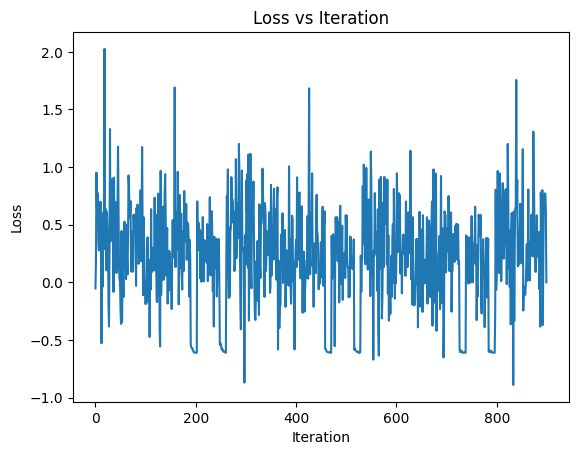


🌍 Training on env: Level 6, Seed 22 | 155 steps
log_probs_theta: -37.5
log_probs_old: -37.5625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -20.296875
log_probs_old: -20.234375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -46.96875
log_probs_old: -46.78125
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -28.984375
log_probs_old: -28.921875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -30.921875
log_probs_old: -30.859375
delta: -0.0625
kl:  0.001953125
log_probs_theta: -59.875
log_probs_old: -59.6875
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -42.21875
log_probs_old: -42.125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -39.96875
log_probs_old: -40.03125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -28.53125
log_probs_old: -28.46875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -34.6875
log_probs_old: -34.59375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -19.296875
log_probs_old: -19.21875
delta: -0.078125
kl:  0.0029296875
log_probs_theta: -34.406

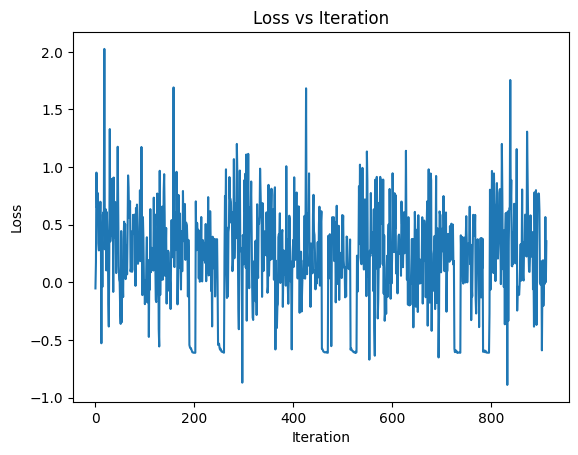


🌍 Training on env: Level 6, Seed 26 | 115 steps
log_probs_theta: -54.21875
log_probs_old: -54.0625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -32.5625
log_probs_old: -32.25
delta: -0.3125
kl:  0.0546875
log_probs_theta: -44.375
log_probs_old: -44.28125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -40.09375
log_probs_old: -40.0
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -38.03125
log_probs_old: -37.90625
delta: -0.125
kl:  0.0078125
log_probs_theta: -37.28125
log_probs_old: -37.28125
delta: 0.0
kl:  0.0
log_probs_theta: -36.3125
log_probs_old: -36.375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -44.5625
log_probs_old: -44.40625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -41.15625
log_probs_old: -41.0625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -32.8125
log_probs_old: -32.8125
delta: 0.0
kl:  0.0
log_probs_theta: -45.6875
log_probs_old: -45.53125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -27.125
log_probs_old: -27.09375
delta: -0.0312

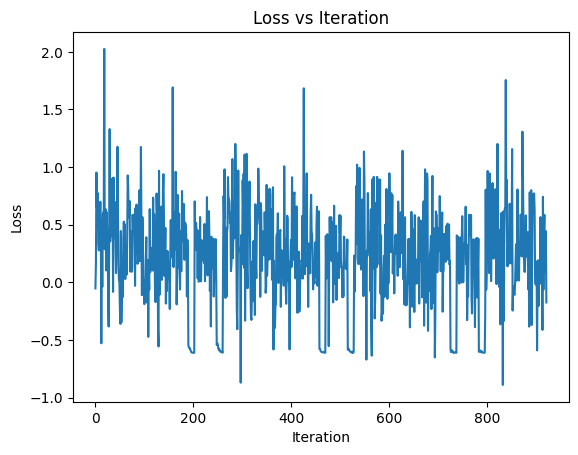


🌍 Training on env: Level 6, Seed 30 | 122 steps
log_probs_theta: -32.71875
log_probs_old: -32.8125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -41.21875
log_probs_old: -41.25
delta: 0.03125
kl:  0.0
log_probs_theta: -24.90625
log_probs_old: -24.78125
delta: -0.125
kl:  0.0078125
log_probs_theta: -54.34375
log_probs_old: -54.21875
delta: -0.125
kl:  0.0078125
log_probs_theta: -33.28125
log_probs_old: -33.125
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -29.171875
log_probs_old: -29.0625
delta: -0.109375
kl:  0.005859375
log_probs_theta: -30.328125
log_probs_old: -30.203125
delta: -0.125
kl:  0.0078125
log_probs_theta: -25.28125
log_probs_old: -25.375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -47.625
log_probs_old: -47.71875
delta: 0.09375
kl:  0.00390625
log_probs_theta: -43.03125
log_probs_old: -43.1875
delta: 0.15625
kl:  0.01171875
log_probs_theta: -47.25
log_probs_old: -47.3125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -53.34375
log_probs_old: -53.40625
delta:

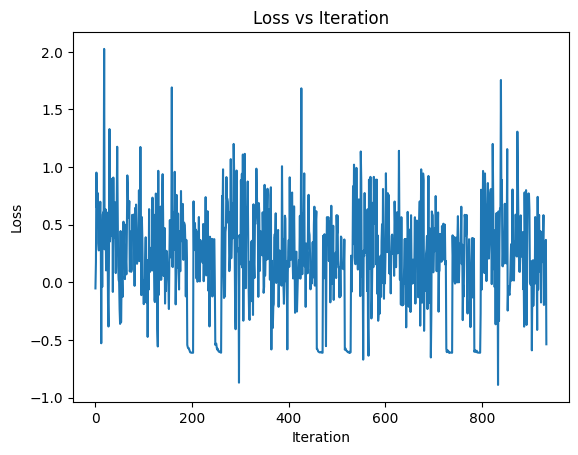


🌍 Training on env: Level 6, Seed 34 | 66 steps
log_probs_theta: -38.9375
log_probs_old: -39.15625
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -31.546875
log_probs_old: -31.546875
delta: 0.0
kl:  0.0
log_probs_theta: -31.859375
log_probs_old: -31.765625
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -34.5
log_probs_old: -34.6875
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -29.96875
log_probs_old: -30.03125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -44.6875
log_probs_old: -44.65625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -30.4375
log_probs_old: -30.390625
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -29.765625
log_probs_old: -29.703125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -40.65625
log_probs_old: -40.78125
delta: 0.125
kl:  0.0078125
log_probs_theta: -46.65625
log_probs_old: -46.65625
delta: 0.0
kl:  0.0
log_probs_theta: -32.15625
log_probs_old: -32.21875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -31.375
log_probs_old: -31.4375
de

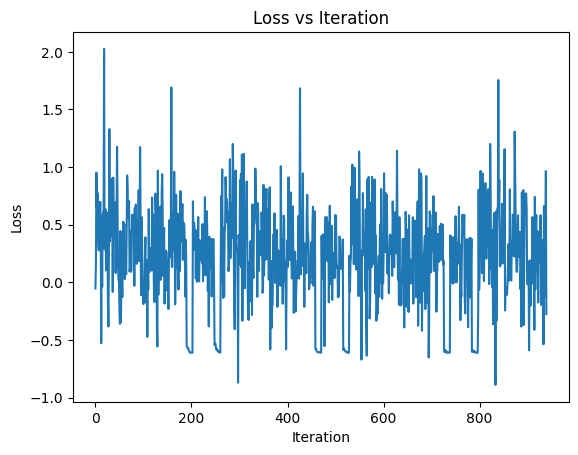


🌍 Training on env: Level 6, Seed 38 | 95 steps
log_probs_theta: -53.0625
log_probs_old: -53.0625
delta: 0.0
kl:  0.0
log_probs_theta: -31.078125
log_probs_old: -31.140625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -33.625
log_probs_old: -33.5625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -43.5
log_probs_old: -43.59375
delta: 0.09375
kl:  0.00390625
log_probs_theta: -34.21875
log_probs_old: -34.28125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -52.3125
log_probs_old: -52.4375
delta: 0.125
kl:  0.0078125
log_probs_theta: -58.21875
log_probs_old: -58.28125
delta: 0.0625
kl:  0.001953125
log_probs_theta: -26.296875
log_probs_old: -26.375
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -30.109375
log_probs_old: -30.1875
delta: 0.078125
kl:  0.0029296875
log_probs_theta: -32.21875
log_probs_old: -32.21875
delta: 0.0
kl:  0.0
log_probs_theta: -30.8125
log_probs_old: -30.8125
delta: 0.0
kl:  0.0
log_probs_theta: -46.625
log_probs_old: -46.53125
delta: -0.09375
kl:  0.0048828

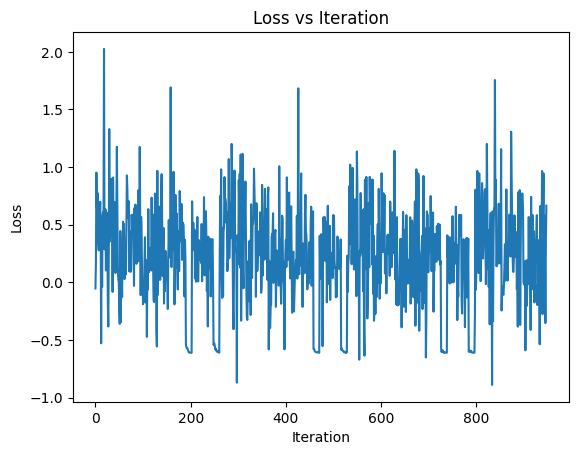


🌍 Training on env: Level 6, Seed 42 | 104 steps
log_probs_theta: -55.9375
log_probs_old: -56.0625
delta: 0.125
kl:  0.0078125
log_probs_theta: -55.96875
log_probs_old: -55.96875
delta: 0.0
kl:  0.0
log_probs_theta: -42.59375
log_probs_old: -42.46875
delta: -0.125
kl:  0.0078125
log_probs_theta: -45.21875
log_probs_old: -45.0625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -40.46875
log_probs_old: -40.5
delta: 0.03125
kl:  0.0
log_probs_theta: -50.15625
log_probs_old: -49.9375
delta: -0.21875
kl:  0.025390625
log_probs_theta: -48.625
log_probs_old: -48.5
delta: -0.125
kl:  0.0078125
log_probs_theta: -35.9375
log_probs_old: -35.9375
delta: 0.0
kl:  0.0
log_probs_theta: -15.1484375
log_probs_old: -15.1875
delta: 0.0390625
kl:  0.0009765625
log_probs_theta: -54.84375
log_probs_old: -54.96875
delta: 0.125
kl:  0.0078125
log_probs_theta: -58.0
log_probs_old: -58.0625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -59.28125
log_probs_old: -59.09375
delta: -0.1875
kl:  0.0185546875
✅ E

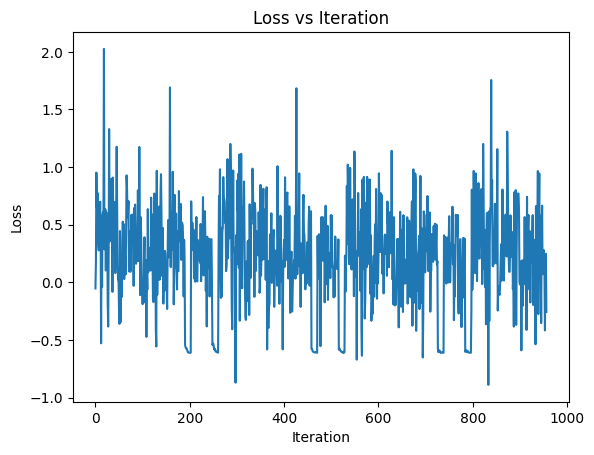


🌍 Training on env: Level 6, Seed 46 | 61 steps
log_probs_theta: -41.1875
log_probs_old: -40.96875
delta: -0.21875
kl:  0.025390625
log_probs_theta: -70.0
log_probs_old: -69.6875
delta: -0.3125
kl:  0.0546875
log_probs_theta: -34.78125
log_probs_old: -34.65625
delta: -0.125
kl:  0.0078125
log_probs_theta: -53.34375
log_probs_old: -53.3125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -40.5625
log_probs_old: -40.34375
delta: -0.21875
kl:  0.025390625
log_probs_theta: -32.5625
log_probs_old: -32.28125
delta: -0.28125
kl:  0.0439453125
log_probs_theta: -36.8125
log_probs_old: -36.75
delta: -0.0625
kl:  0.001953125
log_probs_theta: -42.21875
log_probs_old: -42.15625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -36.375
log_probs_old: -36.21875
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -31.046875
log_probs_old: -30.796875
delta: -0.25
kl:  0.0341796875
log_probs_theta: -37.65625
log_probs_old: -37.65625
delta: 0.0
kl:  0.0
log_probs_theta: -29.984375
log_probs_old: -29.8125

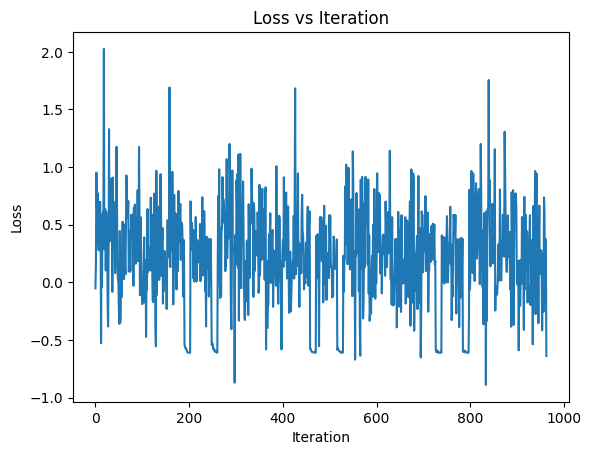


🌍 Training on env: Level 7, Seed 10 | 112 steps
log_probs_theta: -25.015625
log_probs_old: -24.921875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -45.3125
log_probs_old: -45.15625
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -47.71875
log_probs_old: -47.8125
delta: 0.09375
kl:  0.00390625
log_probs_theta: -34.21875
log_probs_old: -34.0
delta: -0.21875
kl:  0.025390625
log_probs_theta: -33.75
log_probs_old: -33.78125
delta: 0.03125
kl:  0.0
log_probs_theta: -33.03125
log_probs_old: -32.75
delta: -0.28125
kl:  0.0439453125
log_probs_theta: -31.96875
log_probs_old: -31.796875
delta: -0.171875
kl:  0.015625
log_probs_theta: -40.25
log_probs_old: -39.96875
delta: -0.28125
kl:  0.0439453125
log_probs_theta: -42.34375
log_probs_old: -42.3125
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -51.8125
log_probs_old: -51.53125
delta: -0.28125
kl:  0.0439453125
log_probs_theta: -50.75
log_probs_old: -50.40625
delta: -0.34375
kl:  0.06640625
log_probs_theta: -52.0
log_probs_old: -51

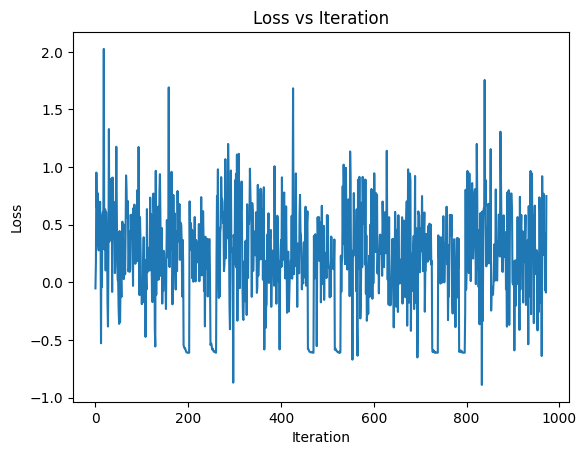


🌍 Training on env: Level 7, Seed 14 | 131 steps
log_probs_theta: -50.0
log_probs_old: -50.25
delta: 0.25
kl:  0.029296875
log_probs_theta: -48.09375
log_probs_old: -48.09375
delta: 0.0
kl:  0.0
log_probs_theta: -42.71875
log_probs_old: -42.875
delta: 0.15625
kl:  0.01171875
log_probs_theta: -23.375
log_probs_old: -23.328125
delta: -0.046875
kl:  0.0009765625
log_probs_theta: -33.0
log_probs_old: -33.1875
delta: 0.1875
kl:  0.0166015625
log_probs_theta: -36.84375
log_probs_old: -36.90625
delta: 0.0625
kl:  0.001953125
log_probs_theta: -39.28125
log_probs_old: -39.21875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -35.90625
log_probs_old: -36.03125
delta: 0.125
kl:  0.0078125
log_probs_theta: -43.78125
log_probs_old: -43.78125
delta: 0.0
kl:  0.0
log_probs_theta: -42.09375
log_probs_old: -42.03125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -49.9375
log_probs_old: -50.15625
delta: 0.21875
kl:  0.0224609375
log_probs_theta: -40.75
log_probs_old: -40.71875
delta: -0.03125
kl:  0.

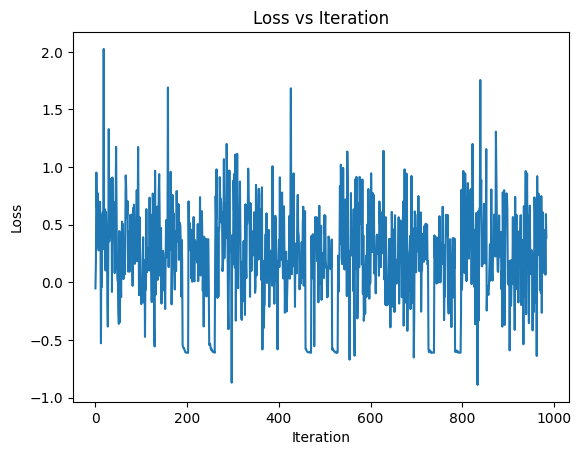


🌍 Training on env: Level 7, Seed 18 | 118 steps
log_probs_theta: -33.84375
log_probs_old: -33.84375
delta: 0.0
kl:  0.0
log_probs_theta: -41.0625
log_probs_old: -41.0625
delta: 0.0
kl:  0.0
log_probs_theta: -45.46875
log_probs_old: -45.375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -36.90625
log_probs_old: -37.0
delta: 0.09375
kl:  0.00390625
log_probs_theta: -40.28125
log_probs_old: -40.34375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -44.96875
log_probs_old: -44.875
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -24.96875
log_probs_old: -25.0625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -36.4375
log_probs_old: -36.40625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -36.59375
log_probs_old: -36.5625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -27.03125
log_probs_old: -26.9375
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -98.625
log_probs_old: -98.375
delta: -0.25
kl:  0.0341796875
log_probs_theta: -26.609375
log_probs_old: -26.421875
delta: -0

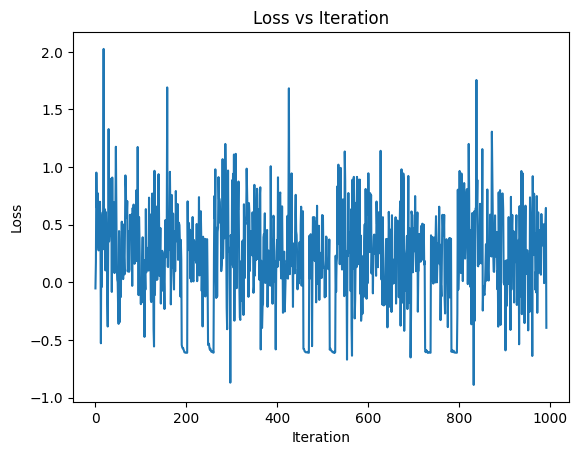


🌍 Training on env: Level 7, Seed 22 | 147 steps
log_probs_theta: -38.5
log_probs_old: -38.46875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -57.6875
log_probs_old: -57.65625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -31.53125
log_probs_old: -31.46875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -64.125
log_probs_old: -64.0
delta: -0.125
kl:  0.0078125
log_probs_theta: -47.1875
log_probs_old: -47.21875
delta: 0.03125
kl:  0.0
log_probs_theta: -41.53125
log_probs_old: -41.5
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -35.125
log_probs_old: -35.0625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -39.34375
log_probs_old: -39.46875
delta: 0.125
kl:  0.0078125
log_probs_theta: -50.25
log_probs_old: -50.25
delta: 0.0
kl:  0.0
log_probs_theta: -38.78125
log_probs_old: -38.75
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -48.65625
log_probs_old: -48.71875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -48.96875
log_probs_old: -49.0
delta: 0.03125
kl:  0.0
✅ E

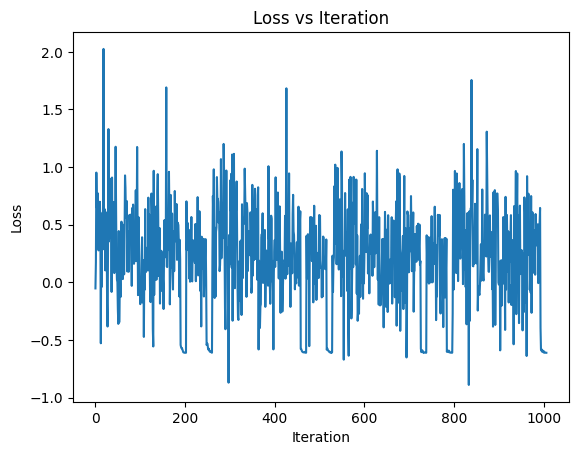


🌍 Training on env: Level 7, Seed 26 | 139 steps
log_probs_theta: -51.21875
log_probs_old: -51.21875
delta: 0.0
kl:  0.0
log_probs_theta: -38.25
log_probs_old: -38.40625
delta: 0.15625
kl:  0.01171875
log_probs_theta: -40.78125
log_probs_old: -40.8125
delta: 0.03125
kl:  0.0
log_probs_theta: -28.859375
log_probs_old: -28.859375
delta: 0.0
kl:  0.0
log_probs_theta: -54.34375
log_probs_old: -54.25
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -48.875
log_probs_old: -48.875
delta: 0.0
kl:  0.0
log_probs_theta: -39.71875
log_probs_old: -39.65625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -53.0625
log_probs_old: -52.9375
delta: -0.125
kl:  0.0078125
log_probs_theta: -32.8125
log_probs_old: -32.90625
delta: 0.09375
kl:  0.00390625
log_probs_theta: -33.8125
log_probs_old: -33.75
delta: -0.0625
kl:  0.001953125
log_probs_theta: -32.90625
log_probs_old: -32.96875
delta: 0.0625
kl:  0.001953125
log_probs_theta: -57.53125
log_probs_old: -57.46875
delta: -0.0625
kl:  0.001953125
✅ Epoch

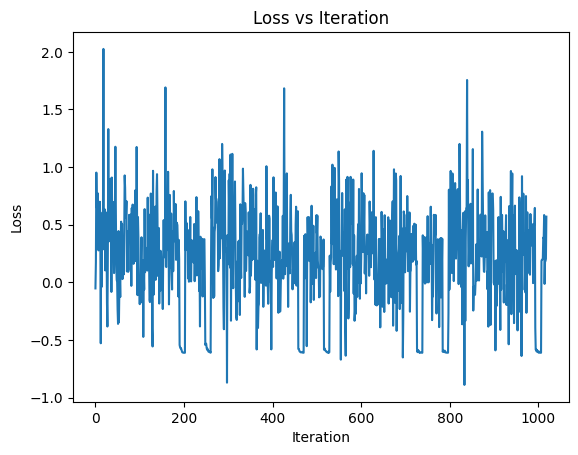


🌍 Training on env: Level 7, Seed 30 | 132 steps
log_probs_theta: -35.3125
log_probs_old: -35.375
delta: 0.0625
kl:  0.001953125
log_probs_theta: -34.3125
log_probs_old: -34.34375
delta: 0.03125
kl:  0.0
log_probs_theta: -45.8125
log_probs_old: -45.9375
delta: 0.125
kl:  0.0078125
log_probs_theta: -22.40625
log_probs_old: -22.390625
delta: -0.015625
kl:  0.0
log_probs_theta: -33.1875
log_probs_old: -33.21875
delta: 0.03125
kl:  0.0
log_probs_theta: -46.625
log_probs_old: -46.625
delta: 0.0
kl:  0.0
log_probs_theta: -52.8125
log_probs_old: -52.84375
delta: 0.03125
kl:  0.0
log_probs_theta: -33.25
log_probs_old: -33.21875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -33.59375
log_probs_old: -33.59375
delta: 0.0
kl:  0.0
log_probs_theta: -52.125
log_probs_old: -52.40625
delta: 0.28125
kl:  0.0361328125
log_probs_theta: -18.46875
log_probs_old: -18.515625
delta: 0.046875
kl:  0.0009765625
log_probs_theta: -30.0625
log_probs_old: -30.203125
delta: 0.140625
kl:  0.009765625
✅ Epoch 4 |

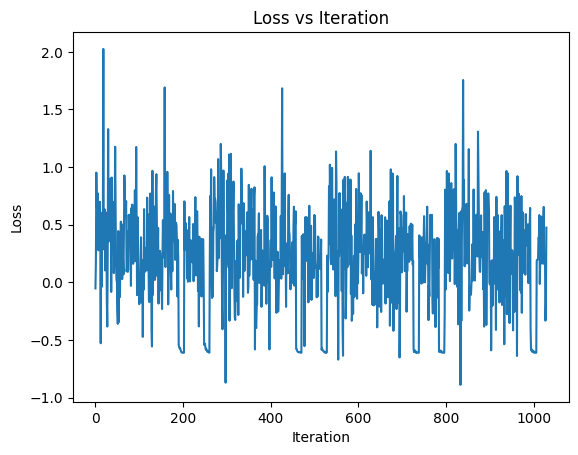


🌍 Training on env: Level 7, Seed 34 | 106 steps
log_probs_theta: -40.6875
log_probs_old: -40.65625
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -68.5625
log_probs_old: -68.5
delta: -0.0625
kl:  0.001953125
log_probs_theta: -62.5625
log_probs_old: -62.21875
delta: -0.34375
kl:  0.06640625
log_probs_theta: -27.53125
log_probs_old: -27.46875
delta: -0.0625
kl:  0.001953125
log_probs_theta: -32.59375
log_probs_old: -32.59375
delta: 0.0
kl:  0.0
log_probs_theta: -44.46875
log_probs_old: -44.1875
delta: -0.28125
kl:  0.0439453125
log_probs_theta: -52.03125
log_probs_old: -51.90625
delta: -0.125
kl:  0.0078125
log_probs_theta: -51.65625
log_probs_old: -51.5
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -60.1875
log_probs_old: -60.125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -39.71875
log_probs_old: -39.6875
delta: -0.03125
kl:  0.0009765625
log_probs_theta: -46.875
log_probs_old: -46.78125
delta: -0.09375
kl:  0.0048828125
log_probs_theta: -20.359375
log_probs_old: -20.390

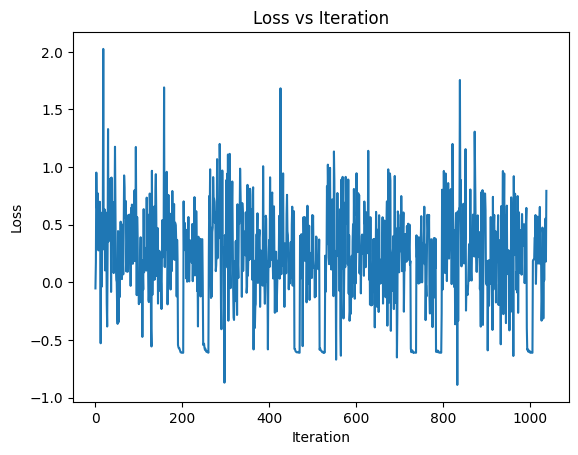


🌍 Training on env: Level 7, Seed 38 | 152 steps
log_probs_theta: -34.0
log_probs_old: -33.75
delta: -0.25
kl:  0.0341796875
log_probs_theta: -48.6875
log_probs_old: -48.4375
delta: -0.25
kl:  0.0341796875
log_probs_theta: -28.59375
log_probs_old: -28.46875
delta: -0.125
kl:  0.0078125
log_probs_theta: -58.46875
log_probs_old: -58.25
delta: -0.21875
kl:  0.025390625
log_probs_theta: -39.8125
log_probs_old: -39.8125
delta: 0.0
kl:  0.0
log_probs_theta: -22.6875
log_probs_old: -22.625
delta: -0.0625
kl:  0.001953125
log_probs_theta: -54.09375
log_probs_old: -53.9375
delta: -0.15625
kl:  0.0126953125
log_probs_theta: -44.34375
log_probs_old: -44.15625
delta: -0.1875
kl:  0.0185546875
log_probs_theta: -45.8125
log_probs_old: -45.59375
delta: -0.21875
kl:  0.025390625
log_probs_theta: -25.375
log_probs_old: -25.3125
delta: -0.0625
kl:  0.001953125
log_probs_theta: -32.78125
log_probs_old: -32.5625
delta: -0.21875
kl:  0.025390625
log_probs_theta: -33.03125
log_probs_old: -32.9375
delta: -0.

In [ ]:
grouped_steps = load_grouped_steps_by_env(file_path)

batch_size = 12
num_epochs = 10
loss_history = []

for epoch in range(num_epochs):
    print(f"\n🌟 Epoch {epoch + 1}")

    for (level, seed), steps in grouped_steps.items():
        print(f"\n🌍 Training on env: Level {level}, Seed {seed} | {len(steps)} steps")

        random.shuffle(steps)

        for i in range(0, len(steps), batch_size):
            batch = steps[i:i + batch_size]
            batch_loss = 0.0
            optimizer.zero_grad()

            for step in batch:
                input_ids_tensor = torch.tensor(step["input_ids"]).unsqueeze(0).to(model.device)
                prompt_len = step["prompt_len"]

                logprob_theta, _, completion_mask = compute_completion_logprob_from_ids(
                    input_ids_tensor, prompt_len, model
                )

                logprob_old = torch.tensor(step["logprob_old"], dtype=torch.float16).to(model.device)
                logprob_ref = logprob_old
                advantage = torch.tensor(step["advantage"], dtype=torch.float16).to(model.device)

                loss = grpo_loss_episode_level(logprob_theta, logprob_old, logprob_ref, advantage)
                batch_loss += loss

            batch_loss = batch_loss / len(batch)
            batch_loss.backward()
            optimizer.step()
            loss_history.append(batch_loss.item())

            print(f"✅ Epoch {epoch+1} | Batch [{i}-{i+len(batch)-1}] | Loss: {batch_loss.item():.4f}")

        plt.plot(loss_history)
        plt.xlabel('Iteration')
        plt.ylabel('Loss')
        plt.title('Loss vs Iteration')
        plt.show()

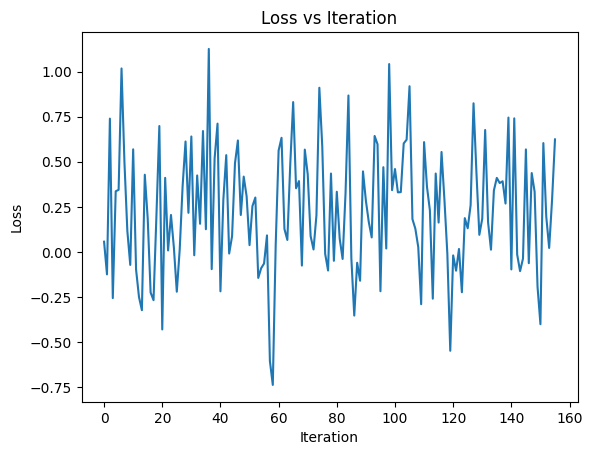

In [ ]:
plt.plot(loss_history)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Loss vs Iteration')
plt.show()

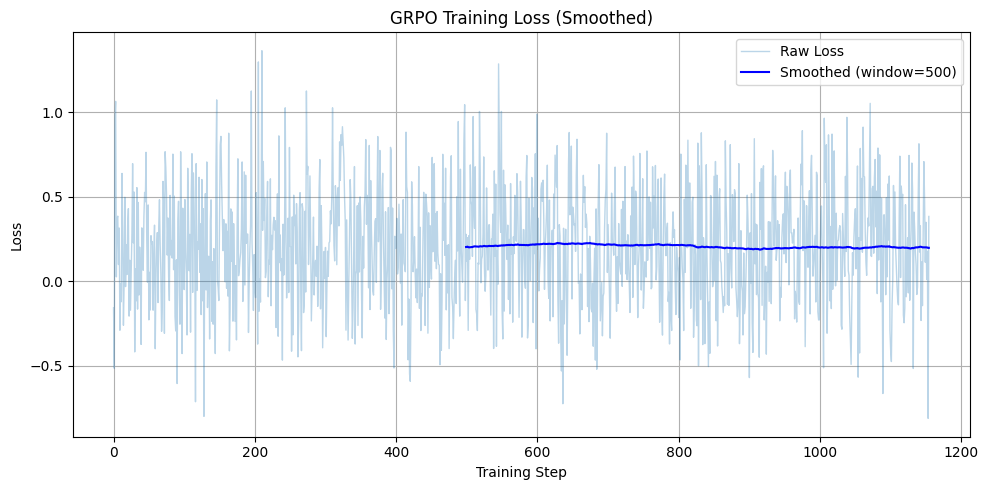

In [ ]:
plot_smoothed_loss(loss_history, window = 500)

#Evaluation

In [ ]:
model.eval()

PeftModelForCausalLM(
  (base_model): LoraModel(
    (model): LlamaForCausalLM(
      (model): LlamaModel(
        (embed_tokens): Embedding(128256, 4096, padding_idx=128004)
        (layers): ModuleList(
          (0): LlamaDecoderLayer(
            (self_attn): LlamaAttention(
              (q_proj): lora.Linear(
                (base_layer): Linear4bit(in_features=4096, out_features=4096, bias=False)
                (lora_dropout): ModuleDict(
                  (default): Identity()
                )
                (lora_A): ModuleDict(
                  (default): Linear(in_features=4096, out_features=8, bias=False)
                )
                (lora_B): ModuleDict(
                  (default): Linear(in_features=8, out_features=4096, bias=False)
                )
                (lora_embedding_A): ParameterDict()
                (lora_embedding_B): ParameterDict()
                (lora_magnitude_vector): ModuleDict()
              )
              (k_proj): lora.Linear(
    

In [ ]:
!pip install -q textworld
import textworld
import re

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 28.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.5/101.5 kB 9.8 MB/s eta 0:00:00


In [ ]:
system_message = """
You are playing a text-based adventure game in a world with various locations and items. Your goal is to explore the world and collect the hidden coin. You can move in different directions (e.g., north, south, east, west) and interact with objects and characters.

### Game Rules:
- You can move using: "go north", "go south", "go east", "go west".
- When a coin is present, it will be clearly described.
- Use "take coin" to collect it.
- Do not return to rooms you've already visited unless necessary.

### Objective:
Your goal is to find the coin present somewhere in the environment. When you find the coin, you can claim it by using the command "take coin"

### Response Format:
<think> your reasoning goes here </think>
<command> your next action goes here </command>

Do not use any other format. Follow this structure exactly.

### Example 1:
Map So Far:
Hallway: east → Kitchen
Kitchen: west → Hallway

Last Move:
From Hallway → go east → Kitchen

Current State:
-= Kitchen =-
You are in the Kitchen. There is no coin here. There are various utensils.

You need an unblocked exit? You should try going west. You don't like doors? Why not try going north, that entranceway is unblocked.

<think>I'm in the Kitchen. Using the "Last Move" and the "Map So Far", I see that I took east from Hallway to arrive here. If I go west I will just go back to the Hallway. But there was no coin in the Hallway. So I won't go back to the Hallway. I will try to explore other options. I see that I can go north. So I should take it.</think>
<command>go north</command>"""

In [ ]:
def extract_initial_game_state(text):
    """
    Extracts the initial room description and its name from the game start text.
    """
    match = re.search(r'(-= .*? =-.*?)(?=>)', text, re.DOTALL)
    if not match:
        return None, None

    description = match.group(1)
    cleaned = re.sub(r'\n\s*\n+', '\n\n', description.strip())

    # Extract room name from -= Room =-
    room_match = re.search(r"-= (.*?) =-", cleaned)
    room_name = room_match.group(1).strip() if room_match else None

    return cleaned, room_name

In [ ]:
def extract_thought_and_command(text):
    """
    Extracts the first <think>...</think> block and <command>...</command> block from the given text.
    Returns a tuple: (thought, command), where either can be None if not found.
    """
    think_match = re.search(r"<think>(.*?)</think>", text, re.DOTALL)
    command_match = re.search(r"<command>(.*?)</command>", text, re.DOTALL)

    thought = think_match.group(1).strip() if think_match else None
    command = command_match.group(1).strip() if command_match else None

    return thought, command

In [ ]:
def parse_game_state(raw_text):
    score_match = re.search(r"<score>\s*(\d+)\s*</score>", raw_text)
    score = int(score_match.group(1)) if score_match else 0 #fallback to 0

    moves_match = re.search(r"<moves>\s*(\d+)\s*</moves>", raw_text)
    moves = int(moves_match.group(1)) if moves_match else 0

    text = raw_text.split("<score>")[0].strip()
    state_description = re.sub(r'\n\s*\n+', '\n\n', text.strip())

    return state_description, score, moves

In [ ]:
def take_action(action: str):

    state = env.step(action)
    state_description, score, moves = parse_game_state(state[0]['raw'])

    # Extract room name from state_description
    room_match = re.search(r"-= (.*?) =-", state_description)
    room_name = room_match.group(1).strip() if room_match else None

    return state_description, score, moves, room_name

In [ ]:
def format_room_graph(room_graph):
    lines = ["### Map So Far:"]
    for room, connections in room_graph.items():
        edges = [f"{dir} → {dest}" for dir, dest in connections.items()]
        lines.append(f"{room}: {', '.join(edges)}")
    return "\n".join(lines)

In [ ]:
def run_episode(env, model, tokenizer, system_message, max_steps=20):
    state = env.reset()
    initial_game_state, prev_room = extract_initial_game_state(state.feedback)
    user_message = initial_game_state

    visited_room_names = set()
    visited_room_names.add(prev_room)
    room_graph = {}

    logprobs = []
    tokenwise_log_probs = []
    moves = 0
    score = 0

    episode_full_input_ids = []
    episode_prompt_len = []


    for step in range(1, max_steps + 1):
        prompt = tokenizer.apply_chat_template(
            [
                {"role": "system", "content": system_message},
                {"role": "user", "content": user_message},
            ],
            tokenize=False,
            add_generation_prompt=True)

        inputs = tokenizer(prompt, return_tensors="pt").to(model.device)

        with torch.no_grad():
            outputs = model.generate(
                **inputs,
                max_new_tokens=200,
                temperature=0.2,
                do_sample=True,
                pad_token_id=tokenizer.eos_token_id,
            )

        response = tokenizer.decode(
            outputs[0][inputs["input_ids"].shape[-1]:], skip_special_tokens=True)

        #print(f"🤖 Response: {response}")

        # Get prompt length and full sequence
        prompt_len = inputs["input_ids"].shape[1]
        full_input_ids = outputs[0].unsqueeze(0)  # shape (1, T)

        # Compute log-probs on completion portion
        with torch.no_grad():
            completion_logprob, token_log_probs, completion_mask = compute_completion_logprob_from_ids(
                                                  full_input_ids, prompt_len, model)

        episode_full_input_ids.append(full_input_ids)
        episode_prompt_len.append(prompt_len)
        logprobs.append(completion_logprob)
        tokenwise_log_probs.append(token_log_probs)

        thought, action = extract_thought_and_command(response)
        if not action:
            print("\n No valid command generated. Ending episode.")
            step = 20
            break

        state, maybe_score, moves, next_room = take_action(action)

        if maybe_score is not None:
            score = maybe_score

        if score == 1:
            print("Coin Found!")
            break

        # Map tracking
        if next_room and next_room not in visited_room_names:
            visited_room_names.add(next_room)

        normalized_action = action.lower()
        if prev_room and next_room and normalized_action.startswith("go "):
            direction = normalized_action.split()[1]
            room_graph.setdefault(prev_room, {})[direction] = next_room
            reverse = {"north": "south", "south": "north", "east": "west", "west": "east"}
            rev_dir = reverse.get(direction)
            if rev_dir:
                room_graph.setdefault(next_room, {})[rev_dir] = prev_room

        graph_summary = format_room_graph(room_graph)
        last_move_description = f"From {prev_room} → {action.lower()} → {next_room}"
        user_message = (
            f"{graph_summary}\n\n"
            f"### Last Move:\n{last_move_description}\n\n"
            f"### Current State:\n{state}\n\n"
            f"---\n\n"
            f"### Please respond strictly in the following format:\n\n"
            f"<think>...</think>\n<command>...</command>"
        )

        prev_room = next_room

    reward = score - 0.01 * step
    return logprobs, tokenwise_log_probs, reward, episode_full_input_ids, episode_prompt_len

In [ ]:
def collect_episodes(env, model, tokenizer, system_message, N=8):
    all_logprobs = []
    all_tokenwise_log_probs = []
    all_rewards = []
    all_full_input_ids = []
    all_prompt_len = []

    for i in range(N):
        print(f"\n🎮 Episode {i + 1} / {N}")
        logprobs, tokenwise_log_probs, reward, full_input_ids, prompt_len = run_episode(env, model, tokenizer, system_message)
        all_logprobs.append(logprobs)
        all_tokenwise_log_probs.append(tokenwise_log_probs)
        all_rewards.append(reward)
        all_full_input_ids.append(full_input_ids)
        all_prompt_len.append(prompt_len)
        print(f"✅ Reward: {reward:.4f} | Steps: {len(logprobs)}")

    return all_logprobs, all_tokenwise_log_probs, all_rewards, all_full_input_ids, all_prompt_len

In [ ]:
def compute_advantages(all_rewards):

    rewards = torch.tensor(all_rewards, dtype=torch.float32)
    mean_r = rewards.mean()
    std_r = rewards.std(unbiased=False) + 1e-8  # unbiased=True by default
    advantages = (rewards - mean_r) / std_r
    return advantages.tolist(), mean_r

In [ ]:
from pathlib import Path

In [ ]:
# ------------------ Configs ------------------
levels = [5, 6, 7]
seeds = [10, 14, 18, 22, 26, 30, 34, 38, 42, 46]
episodes_per_game = 8

save_dir = Path("grpo_dataset")
save_dir.mkdir(exist_ok=True)
save_path = save_dir / "grpo_data.jsonl"

In [ ]:
with open(save_path, "w") as f:
    for level in levels:
        for seed in seeds:
            gamefile = f"coin_level{level}_{seed}.z8"
            !tw-make tw-coin_collector --level {level} --seed {seed} --output {gamefile} --silent
            env = textworld.start(gamefile)
            print(f"\n----- 🌍 Level: {level} | Seed: {seed} -----")

            # Get N rollouts for this environment
            all_logprobs, all_tokenwise_log_probs, all_rewards, all_full_input_ids, all_prompt_len = collect_episodes(
                env, model, tokenizer, system_message, episodes_per_game)

            # Compute advantage across all episodes
            all_advantages, mean_reward = compute_advantages(all_rewards)  # same length as episodes_per_game

            # Save one JSONL line per step
            for i in range(episodes_per_game):
                for step in range(len(all_full_input_ids[i])):
                    example = {
                        "level": level,
                        "seed": seed,
                        "episode": i,
                        "step": step,
                        "input_ids": all_full_input_ids[i][step].squeeze(0).tolist(),
                        "prompt_len": all_prompt_len[i][step],
                        "logprob_old": all_logprobs[i][step].item(),
                        "tokenwise_logprobs": all_tokenwise_log_probs[i][step].tolist(),
                        "advantage": all_advantages[i],
                        "reward": all_rewards[i],
                        "mean_reward": mean_reward.item(),
                    }
                    f.write(json.dumps(example) + "\n")

            print(f"\n🌍 Level: {level} | Seed: {seed} | Mean reward: {mean_reward:.4f}")


print(f"\n✅ All data saved to: {save_path}")


----- 🌍 Level: 5 | Seed: 10 -----

🎮 Episode 1 / 8
Coin Found!
✅ Reward: 0.8800 | Steps: 12

🎮 Episode 2 / 8
Coin Found!
✅ Reward: 0.8400 | Steps: 16

🎮 Episode 3 / 8
Coin Found!
✅ Reward: 0.9000 | Steps: 10

🎮 Episode 4 / 8
Coin Found!
✅ Reward: 0.9300 | Steps: 7

🎮 Episode 5 / 8
Coin Found!
✅ Reward: 0.9500 | Steps: 5

🎮 Episode 6 / 8
Coin Found!
✅ Reward: 0.9500 | Steps: 5

🎮 Episode 7 / 8
Coin Found!
✅ Reward: 0.9500 | Steps: 5

🎮 Episode 8 / 8
Coin Found!
✅ Reward: 0.9200 | Steps: 8

🌍 Level: 5 | Seed: 10 | Mean reward: 0.9150

----- 🌍 Level: 5 | Seed: 14 -----

🎮 Episode 1 / 8
Coin Found!
✅ Reward: 0.9300 | Steps: 7

🎮 Episode 2 / 8
Coin Found!
✅ Reward: 0.9300 | Steps: 7

🎮 Episode 3 / 8
Coin Found!
✅ Reward: 0.9500 | Steps: 5

🎮 Episode 4 / 8
Coin Found!
✅ Reward: 0.9300 | Steps: 7

🎮 Episode 5 / 8
Coin Found!
✅ Reward: 0.9300 | Steps: 7

🎮 Episode 6 / 8
Coin Found!
✅ Reward: 0.9300 | Steps: 7

🎮 Episode 7 / 8
Coin Found!
✅ Reward: 0.9300 | Steps: 7

🎮 Episode 8 / 8
Coin Found